# IST 736 Text Mining
### HW1 - An Evaluation of Sentiment Classification Tools


Ryan Timbrook (RTIMBROO)  
DATE:10/12/2019<br>
Topic: Sentiment Analysis - AI Trend<br>


## 1. Objective
_____________________________________________________________________________________________
An Evaluation of Sentiment Classification Tools

Artificial Intelligence (AI) has become a popular topic recently. Assume that you are a consultant at a public relations firm, and a client of your firm would like you to evaluate the current public sentiment toward AI in social media like Facebook and Twitter. 

Since there are too many comments on social media, you can't manually collect and analyze them all. Fortunately you have discovered some free sentiment analysis tools, and now need to evaluate whether they are good enough to do sentiment analysis for your assigned task.

You need to collect a sample data set and choose two tools to compare their effectiveness in sentiment analysis. Write a report to describe (1) your sampling strategy and whether it would result in a representative sample of public sentiment toward AI, (2) data preparation and system evaluation process, and (3) your conclusion on whether these tools are suitable for your task.
 





## Findings / Recommendations
place findings and recommendations here  





In [6]:
# toggle for working with colab
isColab = False

In [ ]:
#*ONLY RUN WHEN WORKING ON COLAB*
#===================================================
# mount google drive for working in colab

#from google.colab import drive
#drive.mount('/content/gdrive', force_remount=True)

# working within colab, set base working directory
#base_dir = "./gdrive/My Drive/IST707_PRJ_Realestate/buy_rent_sell/"

# validate directory mapping
#ls f'{base_dir}'

# upload custome python files
#from google.colab import files
#uploaded_files = files.upload()

# print files uploaded
#for f in uploaded_files.keys():
#  print(f'file name: {f}')

#isColab = True

______________________________________________________________________________________________
### Coding Environment Setup
Import packages

In [2]:
# import packages for analysis and modeling
import pandas as pd #data frame operations
import numpy as np #arrays and math functions
from scipy.stats import uniform #for training and test splits
from scipy.stats import gaussian_kde as kde # for resampling dataset
from scipy import stats #
import statsmodels.formula.api as smf #R-like model specification
import matplotlib.pyplot as plt #2D plotting
%matplotlib inline
import seaborn as sns #
import requests
import os
import pickle


In [3]:
# packages for twitter
import tweepy as tw
from tweepy import OAuthHandler
import json
from tweepy import Stream
from tweepy.streaming import StreamListener


# packages for NLTK
import nltk
from nltk.tokenize import word_tokenize
from nltk.tokenize import TweetTokenizer
from nltk.corpus import stopwords
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import re

import sys
from os import path

In [4]:
# custome python packages
import rtimbroo_utils as br             # custome python helper functions

In [7]:
# set global properties
notebook_file_name = 'hw1_twitter_sentiment'
report_file_name = 'HW_1_Timbrook_Ryan'
app_name = 'AI_Public_Sentiment'
log_level = 10 # 10-DEBUG, 20-INFO, 30-WARNING, 40-ERROR, 50-CRITICAL

# setup working directory structure
# set global properties
if not isColab:
    dataDir = './data'
    outputDir = './output'
    configDir = './config'
    logOutDir = './logs'
    imageDir = './images'
    modelDir = './models'
else:
    # working within colab
    dataDir = f'{base_dir}data'
    outputDir = f'{base_dir}output'
    configDir = f'{base_dir}config'
    logOutDir = f'{base_dir}logs'
    imageDir = f'{base_dir}images'
    modelDir = f'{base_dir}models'

In [8]:
# create base output directories if they don't exist
if not os.path.exists(outputDir): os.mkdir(outputDir)
if not os.path.exists(logOutDir): os.mkdir(logOutDir)
if not os.path.exists(imageDir): os.mkdir(imageDir)
if not os.path.exists(modelDir): os.mkdir(modelDir)
if not os.path.exists(dataDir): os.mkdir(dataDir)
if not os.path.exists(configDir): os.mkdir(configDir)

In [10]:
# get a logger for troubleshooting / data exploration
logger = br.getFileLogger(logOutDir+'/',app_name,level=log_level)
np.random.seed(42) # NumPy

## 2. OBTAIN the data   
________________________________________________________________________________________________
Import external datasets for evaluation

In [11]:
# load twitter credentials
with open(f'{configDir}/twitter_credentials.json', 'r') as f:
    tw_cred = json.load(f)

# instantiate tweepy object
auth = OAuthHandler(tw_cred['CONSUMER_KEY'], tw_cred['CONSUMER_SECRET'])
auth.set_access_token(tw_cred['ACCESS_TOKEN'], tw_cred['ACCESS_SECRET'])
api = tw.API(auth)

#py_tweets = Twython(tw_cred['CONSUMER_KEY'],tw_cred['CONSUMER_SECRET'],tw_cred['ACCESS_TOKEN'],tw_cred['ACCESS_SECRET'])

# setup base twitter search query
search_terms = 'Artificial+Intelligence OR machine+learning'
search_start_date = '2019-10-11'
# add filters to search criteria
filtered_search_terms = search_terms + " -filter:retweets"
# number of tweets to return
num_tweets = 10000

# query
#base_tw_query = {
   # 'q':filtered_search_terms,
   # 'since':search_start_date,
   # 'count':num_tweets,
   # 'lang':'en',
    
#}

In [12]:
# use .Cursor() to search twitter for tweets containing the search term
tweets = tw.Cursor(api.search,q=filtered_search_terms,lang='en',since=search_start_date).items(num_tweets)
#tweets

In [62]:
#for i,t in enumerate(tweets):
    #print(t.text+'\n')
    #if i > 5: break

In [13]:
# save tweets off to a file
tweet_file_name = 'ai_tweets.txt'
tweet_file_name = search_start_date+'_'+tweet_file_name
raw_tweet_file_name = 'raw_ai_tweets.txt'
failed_tweets_text = []
failed_count = 0

try:
    with open(dataDir+'/'+tweet_file_name, 'w+') as f:
        for t in tweets:
            try:
                f.write(t.text+'\n')
                f.write('\n')
            except:
                failed_count = failed_count + 1
                failed_tweets_text.append(t.text)
                f.write('\n')
                print(f'Failed to write tweet:\n{t.text}')
            
except BaseException as be:
    print(f'Caught BaseException:\n {be}')
    pass

print(f'Failed to write {failed_count}')


Failed to write tweet:
#Repost @thesexed 
・・・
That's a wrap on season 2 of #thesexed podcast! This season we had 22 episodes covering ever… https://t.co/jxpGFif7Qa
Failed to write tweet:
Eat For Free in NYC Using Python, Automation, Artificial Intelligence

☞ https://t.co/gLiNrPDtZ3

#python… https://t.co/I04bEElG8a
Failed to write tweet:
Eat For Free in NYC Using Python, Automation, Artificial Intelligence

☞ https://t.co/Sp2BlWdxlU

#python… https://t.co/pYUVKuauuL
Failed to write tweet:
Did you know this warehouse robot uses machine learning to pick up to 1,000 items an hour, 24-hours a day?! 😲 Conta… https://t.co/tJWUdKxtsE
Failed to write tweet:
Make predictions with Python machine learning for apps

☞ https://t.co/IcDh0BdfyH

#tensorflow

SJAqWmmqT4 https://t.co/q4AdHtxGHL
Failed to write tweet:
🌐 Is #AI a Trillion-Dollar Growth Engine or a Jobs-Killer? There’s Reason for Optimism 

#ArtificialIntelligence… https://t.co/7Ox8RFw6Ne
Failed to write tweet:
@animolenikun Really...😂😂.

Failed to write tweet:
Python para Data Science e Machine Learning - COMPLETO

☞ https://t.co/7U2OMa1lnq

#machinelearning #datascience

S… https://t.co/JmXY2A67Kc
Failed to write tweet:
Python para Data Science e Machine Learning - COMPLETO

☞ https://t.co/V85SzE2OOz

#machinelearning #datascience

S… https://t.co/gVuGtRgarJ
Failed to write tweet:
@DonaldClark 😱 oh my god. A 10/11 year old son should have known integral, differentiation, gradient descent, and machine learning! Hahaha 😅
Failed to write tweet:
https://t.co/v4P9ca8glK 🙃 AI (Artificial Intelligence): What’s The Next Frontier For Healthcare? - Forbes… https://t.co/6X4Ry6IorO
Failed to write tweet:
A Bigram Poem inspired by reubenchasejobs:
 🤖🎓 How 
 How Machine 
 Machine Learning 
 Learning Is 
 Is Bridging 
 B… https://t.co/HVZNry0nuC
Failed to write tweet:
♥️ Artificial Intelligence for Art (Kickstarter) ♥️
SHARE RETWEET SUPPORT DONATE

⬇️PLEASE SUPPORT⬇️… https://t.co/fvp0cYAn8d
Failed to write tweet:
♥️ Artificial Inte

In [14]:
logger.info(f'Failed to write tweets length: {len(failed_tweets_text)}')


Failed to write tweets length: 84


### 2.1 SCRUB / CLEAN
Clean and perform initial transformations steps of the data

In [15]:
# perform scrubbing and cleaning techniques
#%%time
# read tweets text file
line_count=0
hash_count=0
word_count=0
tweet_index=0
bag_of_words=[]
bag_of_hashes=[]
bag_of_links=[]
tweets_cleaned={}
tweet_hashs={}
tweet_links={}

# setup some regular expressions
#------ Barrowed from Dr. Gates - TwitterMining_Tokens
regex1=re.compile('^#.+')
regex2=re.compile('[^\W\d]') #no numbers
regex3=re.compile('^http*')
regex4=re.compile('.+\..+')

with open(f'{dataDir}/{tweet_file_name}') as f:
    for i, line in enumerate(f):
        if line == '\n': 
            tweet_index+=1
            
        #print(line)
        #line = line.replace('\n','')
        line = line.strip()
        line_count+=1
        
        tweetSplitter = TweetTokenizer(strip_handles=True, reduce_len=True)
        tweetTokens = tweetSplitter.tokenize(line)
        
        tweet_tokens_words=[]
        tweet_tokens_links=[]
        tweet_tokens_hashes=[]
        
        for token in tweetTokens:
            if(len(token)>2):
                logger.debug(f'Token: {token}')
                
                if((re.match(regex1,token))):
                    logger.debug(f'Token: {token} | matched regex1 {regex1} - will be added to bag of hashes list')
                    n_token=token[1:]
                    bag_of_hashes.append(n_token) # capture all hashtags
                    tweet_tokens_hashes.append(n_token)
                    hash_count+=1
                elif(re.match(regex2,token)):
                    logger.debug(f'Token: {token} | matched regex2 {regex2}')
                    if(re.match(regex3,token) or re.match(regex4,token)):
                        logger.debug(f'Token: {token} | matched regex3 {regex3} or regex4 {regex4} - will be added to bag of links list')
                        bag_of_links.append(token) # capture all url links
                        tweet_tokens_links.append(token)
                    else:
                        logger.debug(f'Token: {token} | did not match any of the regex patterns - will be added to bag of words list')
                        bag_of_words.append(token) # capture all words
                        tweet_tokens_words.append(token)
                        word_count+=1
                else:
                    logger.debug(f'Token: {token} | did not match regex2 {regex2} | contains numbers')
                    pass
            else:
                logger.debug(f'Token: {token} | is less than 2')
                pass
        # capture tweet index
        tweets_cleaned[tweet_index] = tweet_tokens_words
        tweet_hashs[tweet_index] = tweet_tokens_hashes
        tweet_links[tweet_index] = tweet_tokens_links
        
        #--End For Loop over tokens
    #--End For loop over lines


logger.info(f'bag_of_words count: {len(bag_of_words)} | bag_of_hashes count: {len(bag_of_hashes)} | bag_of_links count: {len(bag_of_links)}')
logger.info(f'Tweets Collected: {tweet_index}')
logger.info(f'Tweets - Line Count: {line_count} | Hash Count: {hash_count}')

bag_of_words count: 24942 | bag_of_hashes count: 1854 | bag_of_links count: 2706
Tweets Collected: 2733
Tweets - Line Count: 5743 | Hash Count: 1854


In [16]:
len(tweets_cleaned)

2734

In [21]:
#bag_of_words

In [17]:
tweet_sents={}

with open(f'{dataDir}/{search_start_date}_ai_tweets_cleaned.txt','a') as f:
    
    for tweet_id, tokens in tweets_cleaned.items():
        if not len(tweets_cleaned[tweet_id]) == 0:
            sent = ''
            #tokens = list(filter(None,tokens))
        
            for t in tokens:
                sent = sent+t+' '
            
            sent = sent.strip()
            sent = sent.replace('\n','')
            tweet_sents[tweet_id] = sent
            f.write(sent)
            #print(tweet_sents)
            #break
    print(tweet_sents)

{1: 'New post Artificial Intelligence pivotal delivering customer service The New Times', 2: "Toyota's concept introduces you helpmate named Yui", 3: 'What heavy rotation for InterpretBank this autumn', 4: 'improving hundreds small details make the tool', 5: 'Tips Futurize Your CannaBusiness With Artificial Intelligence', 6: "Don't but fragile male ego the only reason don't have artificial intelligence calling balls and strike", 7: 'This why Silicon Valley companies not want help the Government acquire next generation artificial intel', 8: 'Scary stuff the hands megalomaniacs', 9: 'Best Machine Learning Data Mining NLP Books', 10: 'Printi', 11: 'The dark side Artificial Intelligence and Facial Recognition via Data Made Simple', 12: 'Tips Futurize Your CannaBusiness With Artificial Intelligence', 13: 'Start Using Machine Learning Algorithms for Buying Selling Digital Ads via', 14: 'there way block not specific phrase Twitter but the style misspelled in-character catposting Twi', 15: 'Wa

### 2.2 Initial EXPLORE
Explore the datasets

In [18]:
# create a list of words to be removed from BOWs for analysis and visualizations
def remove_words(word_list):
    stopwords_set = set(stopwords.words("english"))
    other_words = ['Artificial','artificial','Intelligence','intelligence','artificial intelligence',
                   'Machine','machine','Learning','learning','Data','Science',
                  'The','He','Via','via','New','new','Python','Google','HealthCare']
    
    new_list = set(list(stopwords_set) + other_words)
    
    words_without_stopwords = [word for word in word_list if not word in new_list]
    
    return words_without_stopwords

In [121]:
logger.info(set(stopwords.words("english")))

{'a', "you'd", 'didn', 'be', 'here', 'nor', 'you', 'up', 'they', 'has', 'their', 'him', 'other', 'wasn', 'both', 'doesn', 'his', 'after', 'because', 'was', "won't", 'ma', 'to', "isn't", 'shouldn', 'herself', 'again', 'her', 'while', 'how', 'y', "doesn't", 'some', 'an', 'needn', 'couldn', 'yours', 'between', 's', 'ours', 'am', 'now', 'below', 'that', 'out', 'we', 'who', 'what', "wasn't", "mightn't", "you're", 'weren', "weren't", 'whom', 'at', 'your', 'why', 'and', 'more', 'mustn', "it's", 'yourselves', 'than', 'just', 'during', "hadn't", 'ain', 'from', 'had', 'own', 'myself', 'i', 'off', 'where', 'd', 'do', 'were', 'too', 'over', "needn't", 'are', 'against', 'each', 'hadn', 't', 'above', 'with', 'will', 'few', 'it', 'having', 'by', 'can', 'haven', 'further', 'about', 'this', 'all', 'before', 'shan', 'those', "shouldn't", 'itself', 'my', 'once', 'yourself', "wouldn't", 'does', 'our', 'into', 'these', 'doing', 'if', 'most', 'down', 've', 'being', "couldn't", 'such', "shan't", 'been', 'on'

In [19]:
def get_word_features(word_list):
    word_list = nltk.FreqDist(word_list)
    features = word_list.keys()
    return features, word_list


In [20]:
w_features = get_word_features(remove_words(bag_of_words))
logger.info(w_features[1])

<FreqDist with 5824 samples and 16009 outcomes>


In [102]:
b = remove_words(bag_of_words)
print(b)

['African', 'Women', 'Tech', 'Look', 'VOA', 'News', 'ELON', 'MUSK', 'shocking', 'plans', 'implant', 'chips', 'human', 'brain', 'link', 'artificially', 'intelligent', 'comput', 'factory', 'coming', 'enterprise', 'near', 'factory', 'coming', 'enterprise', 'near', 'ZDNet', 'Neoclassica', 'framework', 'provide', 'tools', 'research', 'co-occurrence', 'transfer', 'change', 'How', 'help', 'save', 'planet', 'Spectator', 'Deepfake', 'technology', 'uses', 'basically', 'put', 'anyones', 'face', 'anybody', 'else', 'given', 'Yelp', 'Collections', 'uses', 'serve', 'recommendations', 'opening', 'best', 'opportunities', 'semiconductor', 'companies', 'decades', 'How', 'capt', 'Reasons', 'Why', 'Important', 'You', 'State', 'Frameworks', 'Really', 'LOOK', 'Demystifying', 'Corporation', 'Forbes', 'Anyone', 'watch', 'Dave', 'Channel', 'They', 'put', 'little', 'messages', 'programmes', "I've", 'seen', 'one', 'Intellectual', 'Property', 'Driving', 'growth', 'Media', 'Tech', 'know', 'recently', 'finished', 'H

In [21]:
def wordcloud_draw(data, color='black', width=1000, height=750, max_font_size=50, max_words=100):
    words = ' '.join([word for word in data])
    #cleaned_word = " ".join([word for word in words])
    wordcloud = WordCloud(stopwords=STOPWORDS,
                    background_color=color,
                    width=width,
                    height=height,
                    max_font_size=max_font_size,
                    max_words=max_words,
                     ).generate(words)
    plt.figure(1,figsize=(10.5, 7))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.show()

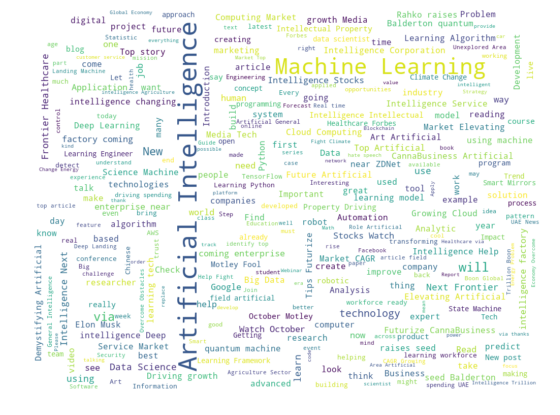

In [118]:
wordcloud_draw(bag_of_words, color='white', max_words=300)

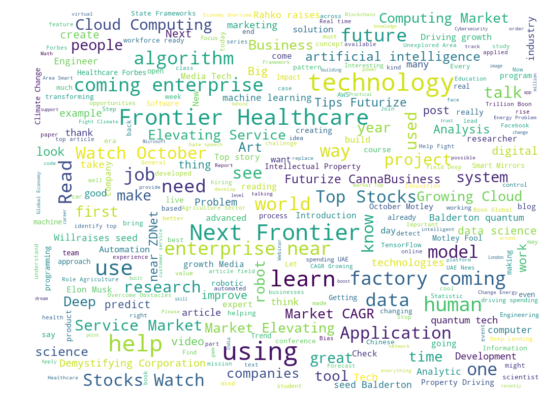

In [119]:
wordcloud_draw(remove_words(bag_of_words),color='white', max_words=300)

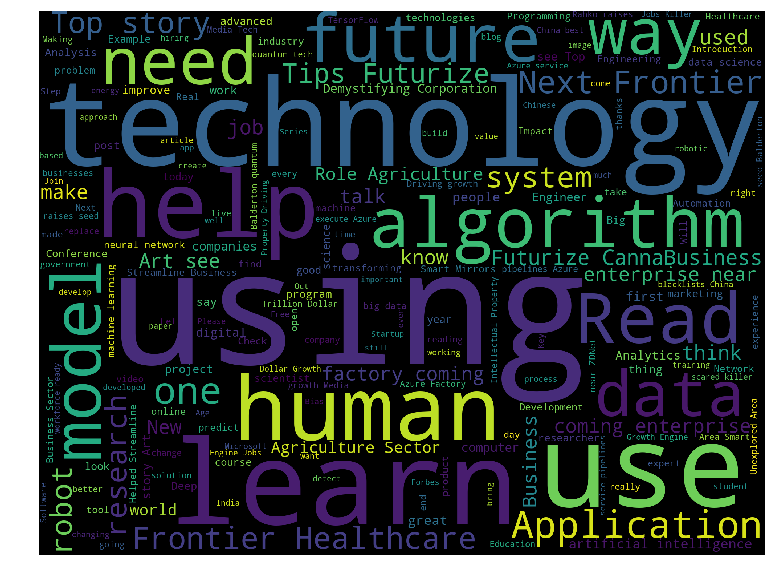

In [87]:
wordcloud_draw(remove_words(bag_of_words))

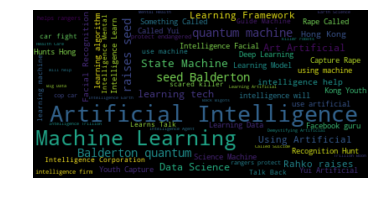

In [107]:
# Create and generate a word cloud image:
wordcloud = WordCloud(stopwords=STOPWORDS).generate(ai_tweets_cleaned)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

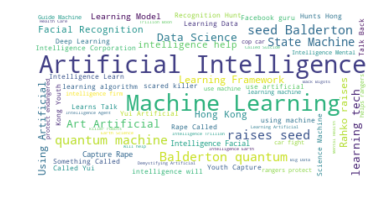

In [108]:
# use parameters to adjust your word cloud, such as 
# lower max_font_size, change the maximum number of word and lighten the background:
wordcloud = WordCloud(stopwords=STOPWORDS,max_font_size=50, max_words=100, background_color="white").generate(ai_tweets_cleaned)
plt.figure()
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

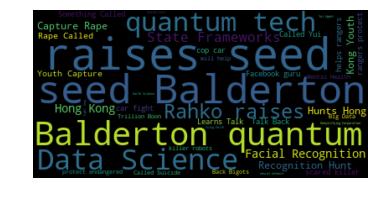

In [106]:
# remove search terms 'Artificial, Intelligence, Machine Learning'
#ai_tweets_cleaned_v1 = ai_tweets_cleaned.replace()
ai_tweets_cleaned_v1 = ai_tweets_cleaned.replace('Artificial','')
ai_tweets_cleaned_v1 = ai_tweets_cleaned_v1.replace('artificial','')
ai_tweets_cleaned_v1 = ai_tweets_cleaned_v1.replace('Intelligence','')
ai_tweets_cleaned_v1 = ai_tweets_cleaned_v1.replace('intelligence','')
ai_tweets_cleaned_v1 = ai_tweets_cleaned_v1.replace('Machine','')
ai_tweets_cleaned_v1 = ai_tweets_cleaned_v1.replace('machine','')
ai_tweets_cleaned_v1 = ai_tweets_cleaned_v1.replace('Learning','')
ai_tweets_cleaned_v1 = ai_tweets_cleaned_v1.replace('learning','')

# Create and generate a word cloud image:
wordcloud = WordCloud(stopwords=STOPWORDS).generate(ai_tweets_cleaned_v1)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

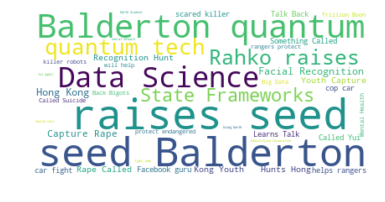

In [105]:
# use parameters to adjust your word cloud, such as 
# lower max_font_size, change the maximum number of word and lighten the background:
wordcloud = WordCloud(stopwords=STOPWORDS,max_font_size=50, max_words=100, background_color="white").generate(ai_tweets_cleaned_v1)
plt.figure()
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

In [22]:
# perform exploratory data analysis techiques
#with open(f'{dataDir}/ai_tweets_cleaned.txt','r') as f:
tweet_sent_clean = [line.strip().rstrip('\n') for line in open(f'{dataDir}/ai_tweets_cleaned.txt')]

In [23]:
#tweet_sent_clean = list(filter(None,tweet_sent_clean))
len(tweet_sent_clean)

30471

In [24]:
tweet_sent_clean

['using for your defense',
 'blacklists Chinese artificial intelligence firms ahead trade talks via',
 'Machine Learning Software Development Techniques and Tools',
 'EHR Software With Artificial Intelligence The Next Big Thing',
 'Rahko raises seed from Balderton for quantum machine learning tech via',
 'Artificial intelligence isn threat humanity natural stupidity Human being are only creatures Earth',
 'love this quote When folks think about artificial intelligence they tend think explicitly about the magi',
 'working against you How artificial intelligence bias can block you',
 '',
 '',
 'Are you passionate about Machine Learning Data Science And have you tried learning your own and yet',
 'New Report shows African Americans will lose more jobs Artificial Intelligence million jobs lost',
 'Artificial Intelligence isn some magical technology that will replace human labor Like all technology',
 '',
 'New post Artificial intelligence helps rangers protect endangered wildlife',
 'talks

## 3. MODEL
_________________________________________________________________________________________________
Create models

### 3.1 Model Analysis
perform model creation and validation techniques

In [25]:
# NLTK downloads
import nltk
nltk.download('subjectivity')
nltk.download('vader_lexicon')

[nltk_data] Downloading package subjectivity to
[nltk_data]     C:\Users\rt310\AppData\Roaming\nltk_data...
[nltk_data]   Package subjectivity is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\rt310\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [26]:
# NLTK assessment
from nltk.classify import NaiveBayesClassifier
from nltk.corpus import subjectivity
from nltk.sentiment import SentimentAnalyzer
from nltk.sentiment.util import *
from nltk.sentiment.util import mark_negation

n_instances = 1000
subj_docs = [(sent,'subj') for sent in subjectivity.sents(categories='subj')[:n_instances]]
obj_docs = [(sent,'obj') for sent in subjectivity.sents(categories='obj')[:n_instances]]
len(subj_docs),len(obj_docs)

(1000, 1000)

In [27]:
subj_docs[0]

(['smart',
  'and',
  'alert',
  ',',
  'thirteen',
  'conversations',
  'about',
  'one',
  'thing',
  'is',
  'a',
  'small',
  'gem',
  '.'],
 'subj')

In [28]:
# NLTK create training / test splits
train_subj_docs = subj_docs[:800]
test_subj_docs = subj_docs[800:1000]
train_obj_docs = obj_docs[:800]
test_obj_docs = obj_docs[800:1000]

training_docs = train_subj_docs+train_obj_docs
testing_docs = test_subj_docs+test_obj_docs

In [29]:
testing_docs[0]

(['the',
  'limited',
  'sets',
  'and',
  'small',
  'confined',
  'and',
  'dark',
  'spaces',
  'also',
  'are',
  'homages',
  'to',
  'a',
  'classic',
  'low-budget',
  'film',
  'noir',
  'movie',
  '.'],
 'subj')

In [30]:
# instantiate a sentiment analyzer object
sentiment_analyzer = SentimentAnalyzer()
all_words_neg = sentiment_analyzer.all_words([mark_negation(doc) for doc in training_docs])


In [31]:
all_words_neg

['smart',
 'and',
 'alert',
 ',',
 'thirteen',
 'conversations',
 'about',
 'one',
 'thing',
 'is',
 'a',
 'small',
 'gem',
 '.',
 'color',
 ',',
 'musical',
 'bounce',
 'and',
 'warm',
 'seas',
 'lapping',
 'on',
 'island',
 'shores',
 '.',
 'and',
 'just',
 'enough',
 'science',
 'to',
 'send',
 'you',
 'home',
 'thinking',
 '.',
 'it',
 'is',
 'not',
 'a_NEG',
 'mass-market_NEG',
 'entertainment_NEG',
 'but_NEG',
 'an_NEG',
 'uncompromising_NEG',
 'attempt_NEG',
 'by_NEG',
 'one_NEG',
 'artist_NEG',
 'to_NEG',
 'think_NEG',
 'about_NEG',
 'another_NEG',
 '.',
 'a',
 'light-hearted',
 'french',
 'film',
 'about',
 'the',
 'spiritual',
 'quest',
 'of',
 'a',
 'fashion',
 'model',
 'seeking',
 'peace',
 'of',
 'mind',
 'while',
 'in',
 'a',
 'love',
 'affair',
 'with',
 'a',
 'veterinarian',
 'who',
 'is',
 'a',
 'non-practicing',
 'jew',
 '.',
 'my',
 'wife',
 'is',
 'an',
 'actress',
 'has',
 'its',
 'moments',
 'in',
 'looking',
 'at',
 'the',
 'comic',
 'effects',
 'of',
 'jealousy

In [32]:
# use simple unigram word features, handling negation
unigram_feats = sentiment_analyzer.unigram_word_feats(all_words_neg, min_freq=4)
#len(unigram_feats)
sentiment_analyzer.add_feat_extractor(extract_unigram_feats, unigrams=unigram_feats)

In [33]:
# apply features to obtain a feature-value representation of dataset
training_set = sentiment_analyzer.apply_features(training_docs)
test_set = sentiment_analyzer.apply_features(testing_docs)


### 3.2 Model Exploration

In [34]:
trainer = NaiveBayesClassifier.train
classifier = sentiment_analyzer.train(trainer, training_set)

#save SentimentAnalyzer
with open('sa_subjectivity.pickle','wb') as f:
    pickle.dump(sentiment_analyzer,f)

for k,v in sorted(sentiment_analyzer.evaluate(test_set).items()):
    print(f'{k}: {v}')


Training classifier
Evaluating NaiveBayesClassifier results...
Accuracy: 0.835
F-measure [obj]: 0.8263157894736842
F-measure [subj]: 0.8428571428571429
Precision [obj]: 0.8722222222222222
Precision [subj]: 0.8045454545454546
Recall [obj]: 0.785
Recall [subj]: 0.885


In [35]:
# tweets
#tweet_sent_clean
tw_sentiment_analyzer = SentimentAnalyzer()

for d in tweet_sent_clean:
    print(d)
    break

#[mark_negation(tw) for tw in tweet_sent_clean]
neg_tweets = tw_sentiment_analyzer.all_words([mark_negation(tw) for tw in tweet_sent_clean])

using for your defense


### 3.3 Model Build

In [36]:
tweet_sent_clean

['using for your defense',
 'blacklists Chinese artificial intelligence firms ahead trade talks via',
 'Machine Learning Software Development Techniques and Tools',
 'EHR Software With Artificial Intelligence The Next Big Thing',
 'Rahko raises seed from Balderton for quantum machine learning tech via',
 'Artificial intelligence isn threat humanity natural stupidity Human being are only creatures Earth',
 'love this quote When folks think about artificial intelligence they tend think explicitly about the magi',
 'working against you How artificial intelligence bias can block you',
 '',
 '',
 'Are you passionate about Machine Learning Data Science And have you tried learning your own and yet',
 'New Report shows African Americans will lose more jobs Artificial Intelligence million jobs lost',
 'Artificial Intelligence isn some magical technology that will replace human labor Like all technology',
 '',
 'New post Artificial intelligence helps rangers protect endangered wildlife',
 'talks

### 4. VADER Sentiment Analyzer

In [41]:
def classify_vader_score_threshold(compound_score):
    pos_sent = 'positive'
    neu_sent = 'neutral'
    neg_sent = 'negative'
    sentiment_class = ''
    
    if compound_score >= 0.05:
        sentiment_class = pos_sent;
    elif compound_score > -0.05 and compound_score < 0.05:
        sentiment_class = neu_sent;
    elif compound_score <= -0.05:
        sentiment_class = neg_sent;
    else:
        logger.warning(f'classify_vader_score_threshold: compound score not in range: {compound_score}')
    return sentiment_class
    

In [37]:
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer 

sid = SentimentIntensityAnalyzer()
for sentence in tweet_sent_clean:
    logger.info(sentence)
    if len(sentence) > 1:
        ss = sid.polarity_scores(sentence)
        for k in ss:
            logger.info(f'{k}: {ss[k]}')
        logger.info('')

using for your defense
neg: 0.0
neu: 0.667
pos: 0.333
compound: 0.128

blacklists Chinese artificial intelligence firms ahead trade talks via
neg: 0.0
neu: 0.721
pos: 0.279
compound: 0.4767

Machine Learning Software Development Techniques and Tools
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

EHR Software With Artificial Intelligence The Next Big Thing
neg: 0.0
neu: 0.721
pos: 0.279
compound: 0.4767

Rahko raises seed from Balderton for quantum machine learning tech via
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificial intelligence isn threat humanity natural stupidity Human being are only creatures Earth
neg: 0.301
neu: 0.431
pos: 0.268
compound: -0.1779

love this quote When folks think about artificial intelligence they tend think explicitly about the magi
neg: 0.0
neu: 0.657
pos: 0.343
compound: 0.8074

working against you How artificial intelligence bias can block you
neg: 0.299
neu: 0.486
pos: 0.215
compound: -0.0516



Are you passionate about Machine Learning Data Science And 

neg: 0.0
neu: 0.633
pos: 0.367
compound: 0.7003

The Department Finance has granted it's annual Real Estate award recent graduate who has work
neg: 0.0
neu: 0.703
pos: 0.297
compound: 0.6705

MIT-IBM developed faster way train video recognition
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Next week Auriga will Join demonstrate how WWS ATM WWS Branch and WWS Customer Mana
neg: 0.0
neu: 0.864
pos: 0.136
compound: 0.296

Artificial Intelligence Can Detect Alzheimer Disease Brain Scans Six Years Before Diagnosis
neg: 0.0
neu: 0.78
pos: 0.22
compound: 0.4767

Artificial Intelligence Learns Talk Back Bigots
neg: 0.0
neu: 0.617
pos: 0.383
compound: 0.4767

Virtual Flow Metering VFM combined with machine learning are ways improve flow estimation accuracy oil and
neg: 0.0
neu: 0.838
pos: 0.162
compound: 0.4404

Artificial intelligence and machine learning can useful tools help improve accuracy within home valuation mod
neg: 0.0
neu: 0.487
pos: 0.513
compound: 0.891

gerald_bader Rahko raises seed 


IBM Ranked the Worldwide Market Share Leader Artificial Intelligence for Third Consecutive Year
neg: 0.0
neu: 0.675
pos: 0.325
compound: 0.6486

First time ever looking hire senior level artificial intelligence expert Join dev
neg: 0.0
neu: 0.654
pos: 0.346
compound: 0.6486

New post Rahko raises seed from Balderton for quantum machine learning tech TechCrunch has been published
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Top story Morgan's Comprehensive Guide Machine Learning Data Science Central
neg: 0.0
neu: 0.678
pos: 0.322
compound: 0.4215


Opinion Artificial intelligence here stay but robot managers replace bad bosses Not likely latest
neg: 0.253
neu: 0.638
pos: 0.109
compound: -0.5719

Learn Machine Learning from the Experienced Training For Best Machine Learning Corporate training reach
neg: 0.0
neu: 0.694
pos: 0.306
compound: 0.6486

Rahko raises seed from Balderton for quantum machine learning tech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


With in-depth knowledge comes plent


Bringing machine learning into marketing CAN improve business results Here's how
neg: 0.0
neu: 0.775
pos: 0.225
compound: 0.4404

Rahko raises seed from Balderton for quantum machine learning tech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

The MIT Horizon learning platform contains bite-sized articles videos and podcasts emerging technologies with
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

expert system comprising less than rules can initially developed with direct labor cost less
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Together the eight blacklisted firms are worth around
neg: 0.0
neu: 0.787
pos: 0.213
compound: 0.2263

excellent reasons adopt Artificial Intelligence hotels
neg: 0.0
neu: 0.261
pos: 0.739
compound: 0.8176

and have the sector full attention but there are few things companies should know before taking
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Early Bird Registration deadline October the International Conference Automat
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

makes se

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

great post Shane Greenstein the start-up Zebra
neg: 0.0
neu: 0.594
pos: 0.406
compound: 0.6249

Rahko raises seed from Balderton for quantum machine learning tech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Rahko raises seed from Balderton for quantum machine learning tech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Breaking Silos and Curating Data for Impactful
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Come check out our Teachable Machine box with Machine Learning facial recognition capabilities
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Demystifying Artificial Intelligence the Corporation
neg: 0.0
neu: 0.563
pos: 0.437
compound: 0.4767

Rahko raises seed from Balderton for quantum machine learning tech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Rahko raises seed from Balderton for quantum machine learning tech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Rahko raises seed from Balderton for quantum machine learning tech
neg: 0.0
neu: 1.0
pos: 0.0
comp

compound: -0.7906

Guide Decision Trees for Machine Learning and Data Science
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

With these courses that picked designer front end web devoloper machine and deep learning specialist
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Overstock one the most significant e-commerce players the United Kingdom has just launched new research
neg: 0.0
neu: 0.652
pos: 0.348
compound: 0.659

Never stop being student Keep learning from domain experts Never hesitate ping friends from your networ
neg: 0.133
neu: 0.675
pos: 0.192
compound: 0.0382

Applied Use Cases Article page
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RepMus team will present the work-in-progress their Residencies this saturday during
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

There Art Artificial Intelligence via
neg: 0.0
neu: 0.563
pos: 0.437
compound: 0.4767

lazy our robot picked off the projects that were clearly the easiest analyze Left for human revie
neg: 0.114
neu: 0.636
pos: 0.25
compound: 0.4

neg: 0.0
neu: 0.763
pos: 0.237
compound: 0.4767

AUTHORS Seeking short fiction theme artificial intelligence
neg: 0.0
neu: 0.659
pos: 0.341
compound: 0.4767

Due
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Learn about Eigenvector
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificial intelligence helps rangers protect endangered wildlife
neg: 0.0
neu: 0.325
pos: 0.675
compound: 0.8074


Artificial Intelligence Being Used Diagnose Disease And Design New Drugs
neg: 0.0
neu: 0.744
pos: 0.256
compound: 0.4767

Machine learning will innovate attractions
neg: 0.0
neu: 0.333
pos: 0.667
compound: 0.7184

Explore how Artificial Intelligence will shape the experiences tomorrow the free eBook Driven Design
neg: 0.0
neu: 0.652
pos: 0.348
compound: 0.7506

New post Thoughtfully Using Artificial Intelligence Earth Science Eos
neg: 0.0
neu: 0.547
pos: 0.453
compound: 0.7003

Transforming Learning With via
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Mar
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Will Artific

neg: 0.0
neu: 0.462
pos: 0.538
compound: 0.8519

How can trading standards harness the power artificial intelligence and computer learning tackle rogue trader
neg: 0.0
neu: 0.819
pos: 0.181
compound: 0.4767

this video Nikhil Bhagwat from explain how artificial intelligence help
neg: 0.0
neu: 0.58
pos: 0.42
compound: 0.7003

Could exams replaced artificial intelligence the future
neg: 0.0
neu: 0.659
pos: 0.341
compound: 0.4767


Artificial Intelligence giving its touch every sector business course digital marketing operations
neg: 0.0
neu: 0.645
pos: 0.355
compound: 0.6705

Within the Automotive Industry Techno FAQ
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

this powered push will provide trillion boost the global economy consulting giant Accentur
neg: 0.0
neu: 0.816
pos: 0.184
compound: 0.4019

without impos
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Chrome can create descriptions for unlabeled images the web
neg: 0.0
neu: 0.792
pos: 0.208
compound: 0.2732

Chrome new solution sends unla

neg: 0.0
neu: 0.563
pos: 0.437
compound: 0.4767

Learn Tools and techniques for discovery analysis and visualisation multi-structured data Text and sentiment
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


that machine learning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Breaking News has rolled out developments that advance the processing speed even
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ARTIFICIAL INTELLIGENCE
neg: 0.0
neu: 0.244
pos: 0.756
compound: 0.4767

Explore more
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Someone idea made the classroom setting and turned lab Now kids are focused and attentive
neg: 0.0
neu: 0.843
pos: 0.157
compound: 0.3818

Why You Should Use Your for
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Serverless Machine Learning Inference with Tika and TensorFlow
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

What Are The Risks And Benefits Forbes
neg: 0.216
neu: 0.515
pos: 0.268
compound: 0.128

What fun
neg: 0.0
neu: 0.233
pos: 0.767
compound: 0.5106

Amazon Workers May Watc


Udemy Free Course How Customize Facebook Ads Based Customer Awareness Principles
neg: 0.0
neu: 0.752
pos: 0.248
compound: 0.5106

Why essential for success the new energy world Read Franck Freycenon insights
neg: 0.0
neu: 0.633
pos: 0.367
compound: 0.7003

Machine learning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

How Artificial Intelligence Will Reshape the Global Order Foreign Affairs
neg: 0.0
neu: 0.744
pos: 0.256
compound: 0.4767


The more machine learning becomes part the business culture and approach the easier becomes justify the
neg: 0.0
neu: 0.843
pos: 0.157
compound: 0.4215

The Magic Smart Mirrors Artificial Intelligence Augmented Reality And The Internet Things
neg: 0.0
neu: 0.633
pos: 0.367
compound: 0.7003

How Changing The World
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


Training the next generation digital skills vital the adoption technologies such Karl
neg: 0.0
neu: 0.833
pos: 0.167
compound: 0.296

Can Write Better Financial Copy than You
neg: 0.0
neu: 0.674
pos: 0

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

The Artificial Intelligence Journey Contact Centers
neg: 0.0
neu: 0.617
pos: 0.383
compound: 0.4767

New post Artificial Intelligence and Mental Health Care Psychology Today
neg: 0.0
neu: 0.559
pos: 0.441
compound: 0.743

Principal
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Manhattan Associates needs Principal Machine Learning Engineer
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Alignment Podcast Human Compatible Artificial Intelligence and the Problem Control with Stuart Russell
neg: 0.161
neu: 0.655
pos: 0.185
compound: 0.1027

Artificial Intelligence with Facial Recognition Hunts Hong Kong Youth For Capture Rape Called Suicide
neg: 0.395
neu: 0.472
pos: 0.133
compound: -0.7964

Oscars Guesses Picked Artificial Intelligence company Has Unanimous guessed right
neg: 0.0
neu: 0.744
pos: 0.256
compound: 0.4767

prefer directed location google map than from stranger Each time there's conflict chose Goog
neg: 0.15
neu: 0.85
pos: 0.0
compound: -0.3182


neu: 0.66
pos: 0.34
compound: 0.5574


Wed Oct John Doppman Memorial Lecture for Imaging Sciences Radiology the Era Artificial Intelli
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

The State Machine Learning Frameworks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificial Intelligence and Marketing What Marketers Need Know
neg: 0.0
neu: 0.693
pos: 0.307
compound: 0.4767

From helping with medical diagnoses detecting credit card fraud neural networks support some the most import
neg: 0.163
neu: 0.515
pos: 0.322
compound: 0.4019

joins the global power play between the and China
neg: 0.0
neu: 0.769
pos: 0.231
compound: 0.34


Tap predict weather address climate change Hindu Business Line
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Watch demo how machine learning driven support services can simplify your support interactions Cat
neg: 0.0
neu: 0.69
pos: 0.31
compound: 0.6597

Watch demo how machine learning driven support services can simplify your support interactions Cat
neg: 0.0
neu: 0.69
pos:

neu: 1.0
pos: 0.0
compound: 0.0



via Boosting your Machine Learning productivity with SAS Viya
neg: 0.0
neu: 0.769
pos: 0.231
compound: 0.34

Many companies still aren't deploying technology despite the huge possible returns economy set miss
neg: 0.229
neu: 0.771
pos: 0.0
compound: -0.374

PhD Candidate Machine Learning About the position The Depart
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Check out latest article explained all via
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Machine Learning Used Optimize Quantum Dot Synthesis machine learning
neg: 0.0
neu: 0.714
pos: 0.286
compound: 0.4939

Refining Concepts Machine Learning this paper deal with mac
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificial Intelligence and Mental Health Care Psychology Today Artificial Intelligence and Mental Hea
neg: 0.0
neu: 0.515
pos: 0.485
compound: 0.8555

American Express provides world-class opportunities for talent Analytics and Machine Learning Sankara Narayanan
neg: 0.0
neu: 0.671
pos: 0.329
com

neg: 0.0
neu: 0.762
pos: 0.238
compound: 0.6124

Ways Automate with
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


Some the distinct features which Artificial Intelligence has added the field weaponry now include percepti
neg: 0.106
neu: 0.722
pos: 0.172
compound: 0.296

began look for solutions gain real-time information about free spaces The constant flux
neg: 0.0
neu: 0.543
pos: 0.457
compound: 0.8126

ICYMI and Other Tech Trends from ReWork via
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificial Intelligence and Mental Health Care Psychology Today Artificial Intelligence and Mental Hea
neg: 0.0
neu: 0.515
pos: 0.485
compound: 0.8555

Instead walking for hunger why don
neg: 0.286
neu: 0.714
pos: 0.0
compound: -0.25

this special gue
neg: 0.0
neu: 0.426
pos: 0.574
compound: 0.4019

This level paranoia from JVL people belies complete failure understand the world they operate
neg: 0.306
neu: 0.694
pos: 0.0
compound: -0.6486

Cushman
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

The Intelligen

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificial Intelligence making pro
neg: 0.0
neu: 0.492
pos: 0.508
compound: 0.4767

e-commerce giant Overstock has revealed plans invest new centre Sligo
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0




pushing the limits what computer can way beyond our expectations Here's how we're helping
neg: 0.0
neu: 0.855
pos: 0.145
compound: 0.296

fought the law The relationship between artificial intelligence and the law receiving greater focus but
neg: 0.095
neu: 0.688
pos: 0.218
compound: 0.2846

Fraudsters are constantly looking for new ways scam their victims The security industry got glimpse what
neg: 0.395
neu: 0.504
pos: 0.101
compound: -0.7906

via
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


RFID Wireless IoT tomorrow Artificial Intelligence circa oftentimes invisible built into mul
neg: 0.0
neu: 0.78
pos: 0.22
compound: 0.4767

Applications for our free Intro Machine Learning bootcamp close tonight EDT Oct Learn
neg: 0.0
neu: 0.784
pos: 0.216
compo

pos: 0.434
compound: 0.5574

Agencies and business owners predict the success digital advertisements with confidence interval
neg: 0.0
neu: 0.588
pos: 0.412
compound: 0.7906

How Artificial Intelligence Transforming Business Models
neg: 0.0
neu: 0.617
pos: 0.383
compound: 0.4767


about how can benefit educati
neg: 0.0
neu: 0.571
pos: 0.429
compound: 0.4588

Advanced Tips for Production Machine Learning
neg: 0.0
neu: 0.714
pos: 0.286
compound: 0.25

shares how Artificial Intelligence could potentially help clinicians improve their work which may eve
neg: 0.0
neu: 0.478
pos: 0.522
compound: 0.872

Problem integrating machine learning model android new machine learning and android using this
neg: 0.184
neu: 0.816
pos: 0.0
compound: -0.4019

Job Machine Learning and NLP Internships Company Iprova Location Lausanne Switzerland
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

bit overhyped but some good ideas what will able for NGOs few years Nonprofit Executives
neg: 0.0
neu: 0.784
pos: 0.216
com

neg: 0.0
neu: 0.828
pos: 0.172
compound: 0.4404

Next top Asvestopoulou Evaluation DysLexML Screening Tool for Usi
neg: 0.0
neu: 0.816
pos: 0.184
compound: 0.2023

Facebook Captum brings explainability machine learning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

The State Machine Learning Frameworks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


Ways Artificial Intelligence Can Empower Your Sales Team
neg: 0.0
neu: 0.693
pos: 0.307
compound: 0.4767


have two PhD positions fill One PhD project will investigate explainability Artificial Intelligence from
neg: 0.0
neu: 0.807
pos: 0.193
compound: 0.4767

The Intelligence community reported that the mainland Chinese regime had implanted the
neg: 0.0
neu: 0.78
pos: 0.22
compound: 0.4767

There Art via
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Preparing for future with Artificial Intelligence Robin Winsor TEDxYYC
neg: 0.0
neu: 0.721
pos: 0.279
compound: 0.4767

I'd say learn the stats math and the machine learning but but also immerce yourself rea

pos: 0.221
compound: -0.2023

puff piece web-based ques
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificial Intelligence Learns Talk Back Bigots Scientific American
neg: 0.0
neu: 0.693
pos: 0.307
compound: 0.4767


Scientists have utilized Artificial intelligence produce far more accurate and in-depth method for analyz
neg: 0.0
neu: 0.807
pos: 0.193
compound: 0.4767

Evolution October
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Join for the
neg: 0.0
neu: 0.476
pos: 0.524
compound: 0.296

Blacklist Chinese Artificial Intelligence Firms
neg: 0.0
neu: 0.563
pos: 0.437
compound: 0.4767

Machine learning algorithms have been developed scientists which can predict bullying and aggressors Twitter
neg: 0.326
neu: 0.674
pos: 0.0
compound: -0.7003

Job Machine Learning and NLP Internships Company Iprova Location Lausanne Switzerland
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Zomato Swiggy are using technologies like and drive their business using data collected from food orders
neg: 0.0
neu: 0.857

compound: 0.6705

SKF Acquires Maintenance Artificial Intelligence Company Metrology and Quality News Online Magazine metr
neg: 0.0
neu: 0.795
pos: 0.205
compound: 0.4767

World International Day the Girl Child
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificial Intelligence not gender blind
neg: 0.0
neu: 0.359
pos: 0.641
compound: 0.6551


Transportation difficulties arise when system action pretty hard model based predictable pattern
neg: 0.228
neu: 0.57
pos: 0.203
compound: 0.1531

Leveraging Improve Analytics Insight
neg: 0.0
neu: 0.508
pos: 0.492
compound: 0.4404

Artificial Intelligence Government Projects Current the Public Sector Machine learning performance the
neg: 0.0
neu: 0.78
pos: 0.22
compound: 0.4767

Exactly how artificial intelligence actually set revolutionise lease management Analytics Jobs have created
neg: 0.0
neu: 0.683
pos: 0.317
compound: 0.6249

Will the advancement Artificial Intelligence result massive job losses Should worried the fea
neg: 0.272
neu: 0.556


neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Common Applications Artificial Intelligence That Are All Around Finextra
neg: 0.0
neu: 0.721
pos: 0.279
compound: 0.4767

Love Alexa Think kettles should smart our latest blog focus ways you can use cutting edge artifici
neg: 0.067
neu: 0.625
pos: 0.308
compound: 0.7506

How APIs Support Artificial Intelligence
neg: 0.0
neu: 0.341
pos: 0.659
compound: 0.7003

The Digital Transformation Accounting And Finance Artificial Intelligence Robots And Chatbots
neg: 0.0
neu: 0.763
pos: 0.237
compound: 0.4767

seeks blacklist Chinese artificial intelligence firms Business Jamaica Gleaner
neg: 0.0
neu: 0.721
pos: 0.279
compound: 0.4767

Ruddock reports the real-life impacts and clears some more
neg: 0.0
neu: 0.86
pos: 0.14
compound: 0.0772


Artificial Intelligence Could Trillion Boon
neg: 0.0
neu: 0.563
pos: 0.437
compound: 0.4767

Artificial Intelligence including can used accelerate Drug Discovery processes
neg: 0.0
neu: 0.721
pos: 0.279
compound: 0.476


Great machine learning talk definitely going have check out now
neg: 0.0
neu: 0.541
pos: 0.459
compound: 0.7783

shitty artificial intelligence
neg: 0.468
neu: 0.13
pos: 0.403
compound: -0.128

Scientific advances can take decades translate into health machine learning model can accu
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

The Intelligence community reported that the mainland Chinese regime had implanted their own paramilitary forces
neg: 0.0
neu: 0.819
pos: 0.181
compound: 0.4767

Researchers have found way marry human creativity and artificial intelligence creativity dramatically
neg: 0.0
neu: 0.52
pos: 0.48
compound: 0.8074

upskill yourself with free courses skills wide range from data analytics digital machine learning
neg: 0.0
neu: 0.798
pos: 0.202
compound: 0.5106

Distributed Machine Learning VMware vSphere with GPUs and Kubernetes Webinar
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Meet The digital assistant that uses and machine learning fix your writing
neg: 0.0
neu: 1.0
po

neg: 0.0
neu: 0.741
pos: 0.259
compound: 0.2732

Machine learning isn't necessarily that resource intensive
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Cerence announces partnership with Mila Quebec Artificial Intelligence Institute Automotive World
neg: 0.0
neu: 0.763
pos: 0.237
compound: 0.4767

God Respects When Work But Loves When Dance panorama the action
neg: 0.0
neu: 0.497
pos: 0.503
compound: 0.7964

God Respects When Work But Loves When Dance panorama the action and more meditative moments
neg: 0.0
neu: 0.505
pos: 0.495
compound: 0.8687


Questions arose response news Artificial intelligence being used schools detect self-harm and bullying
neg: 0.217
neu: 0.611
pos: 0.172
compound: -0.2023

How will you impacted Artificial Intelligence Read this new book the questions you must ask yourself
neg: 0.0
neu: 0.829
pos: 0.171
compound: 0.4767

sponsored talks like Buy our full-featured Big Data DLP Military Grade Cyber Cloud SecDevOps Cubernetes
neg: 0.0
neu: 0.848
pos: 0.152
compound

pos: 0.081
compound: -0.6709

fiction set science fact NASA boffin mulls artificial intelligence watch over the lunar Gateway The
neg: 0.0
neu: 0.819
pos: 0.181
compound: 0.4767

Machine Learning for Developers and
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Waterco Artificial Intelligence creates two-step ldquo rop and push rdquo pool care
neg: 0.0
neu: 0.517
pos: 0.483
compound: 0.8126

Toyota Has Something Called The Yui Artificial Intelligence Agent
neg: 0.0
neu: 0.721
pos: 0.279
compound: 0.4767

various government agencies have conflicting and confusing strategies
neg: 0.434
neu: 0.566
pos: 0.0
compound: -0.5574

Forecast finalist for Startup the Year
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

We're super proud the running for the Best Machine Lea
neg: 0.0
neu: 0.385
pos: 0.615
compound: 0.9042

Read Oct Newsletter featuring Morgan's Comprehensive Guide Machine Learning
neg: 0.0
neu: 0.8
pos: 0.2
compound: 0.25

Model from the Computer Science and Lab
neg: 0.0
neu: 1.0
pos: 0.0
comp

neg: 0.0
neu: 0.847
pos: 0.153
compound: 0.4019

MIT-IBM developed faster way train video recognition
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

How Imperfections Can Help Artificial intelligence improving astounding ways The systems that use
neg: 0.0
neu: 0.441
pos: 0.559
compound: 0.886

can and revolutionizing insurance being used every function business transform the way
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

One the aspect that are working through Artificial Intelligence our organisation the the understa
neg: 0.0
neu: 0.807
pos: 0.193
compound: 0.4767


And think got PowerPoint The growth artificial intelligence has the same effect
neg: 0.0
neu: 0.637
pos: 0.363
compound: 0.6908

Dear sir can use drone patrolling system utilizing drone and artificial intelligence
neg: 0.0
neu: 0.637
pos: 0.363
compound: 0.6908

Have you ever wondered how Artificial Intelligence will change life for humans Will become Skynet give
neg: 0.0
neu: 0.829
pos: 0.171
compound: 0.4767

From Diagnosis Hol

neg: 0.381
neu: 0.486
pos: 0.133
compound: -0.6231

The Amazing Ways Retail Giant Zalando Using Artificial Intelligence
neg: 0.0
neu: 0.504
pos: 0.496
compound: 0.7845

PyTorch Mobile Machine Learning Framework Announced ADTmag via
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

America's Risky Approach Artificial Intelligence
neg: 0.228
neu: 0.38
pos: 0.392
compound: 0.3182

Artificial intelligence isn't very intelligent and won't any time soon
neg: 0.195
neu: 0.58
pos: 0.225
compound: 0.1035

complexity
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificial Intelligence Machine Learning Cybersecurity
neg: 0.0
neu: 0.563
pos: 0.437
compound: 0.4767

Guide including code for
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Facebook Captum brings explainability machine learning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


SAP Leonardo Business Services deliver enterprise-ready value-driven machine learning services integrated into
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Toyota Has Something Called The


Educ_Technology
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificial Intelligence based facial number plate recognition system would tell the system whether driver the
neg: 0.0
neu: 0.747
pos: 0.253
compound: 0.5267

Using the What-If Tool investigate Machine Learning models
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Top Ways Artificial Intelligence Transforming Our World the current technology-driven era there are many
neg: 0.0
neu: 0.71
pos: 0.29
compound: 0.5994

powerful its smart technology has the potential improve productivity efficiency and accuracy Unlock
neg: 0.0
neu: 0.452
pos: 0.548
compound: 0.872

Data Mapping Using Machine Learning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

research examines ways make computers more human
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0



How could help solve some society toughest problems
neg: 0.32
neu: 0.32
pos: 0.36
compound: 0.128

advanced analytical techniques including machine learning combined with our highly-skilled analysts
neg: 0.0
ne

pos: 0.22
compound: 0.4767

Guided Tour Machine Learning Finance
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

New best story Hacker News The State Machine Learning Frameworks
neg: 0.0
neu: 0.682
pos: 0.318
compound: 0.6369

How China Using Artificial Intelligence Classrooms WSJ via
neg: 0.0
neu: 0.693
pos: 0.307
compound: 0.4767

New best story Hacker News The State Machine Learning Frameworks
neg: 0.0
neu: 0.682
pos: 0.318
compound: 0.6369

Draft Seq was just added the Machine learning category Wikipedia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

support assist customers when they are looking for help search something
neg: 0.0
neu: 0.625
pos: 0.375
compound: 0.6597

Explore the Liv
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Voynich Manuscript What Does the Voynich Manuscript Mean
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

The State Machine Learning Frameworks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

New best story Hacker News The State Machine Learning Frameworks
neg: 0.0
neu: 0.682
pos: 0

neu: 0.651
pos: 0.289
compound: 0.6786

Artificial Intelligence worldwide overview patents
neg: 0.0
neu: 0.563
pos: 0.437
compound: 0.4767

Job Machine Learning and NLP Internships Company Iprova Location Lausanne Switzerland
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Economist leader about the limitations machine learning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Gymnastics officials are making artificial intelligence technology available judges this week world champio
neg: 0.0
neu: 0.795
pos: 0.205
compound: 0.4767

SuperChinese Chinese fluency redefined Speak confidently Learn Mandarin Chinese efficiently using our proprietary
neg: 0.0
neu: 0.655
pos: 0.345
compound: 0.7003

Are you looking for Data Scientist Data Architect Machine Learning Engineer Your Search ends AISmartz
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

While attention continues focused the rise and growing sophistication voice-based interfaces startup
neg: 0.0
neu: 0.699
pos: 0.301
compound: 0.5106



SuperChinese Chine


Artificial intelligence and cloud computing the future for scientific research
neg: 0.0
neu: 0.744
pos: 0.256
compound: 0.4767

Artificial Intelligence Detects Heart Failure From One Heartbeat With Accuracy
neg: 0.229
neu: 0.556
pos: 0.215
compound: -0.0516

Machine learning data mining and artificial intelligence are revolutionizing the study and understanding menta
neg: 0.0
neu: 0.807
pos: 0.193
compound: 0.4767

Artificial Intelligence Uncle Sam punishes China for abusing Uyghur Muslims blacklisting top surveillanc
neg: 0.305
neu: 0.45
pos: 0.245
compound: -0.296

Useful guide Path from Pilot Production
neg: 0.0
neu: 0.633
pos: 0.367
compound: 0.4404

How decides which projects pursue TechWire
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


Machine Learning Mobile and Frameworks Comparison
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Can revolutionise physical security Learn more about fully utilising security systems create business intell
neg: 0.0
neu: 0.615
pos: 0.385
compound: 0.7096



neg: 0.0
neu: 0.693
pos: 0.307
compound: 0.4767

Humanity world More Important than Before Because Artificial Intelligence Tasks instead People
neg: 0.0
neu: 0.658
pos: 0.342
compound: 0.6361

Advantages Banking Grow Adding Pressure for Broad Adoption
neg: 0.206
neu: 0.561
pos: 0.234
compound: 0.0772

Doctors are looking artificial intelligence diagnosis tool Shyatto Raha MyHealthcare
neg: 0.0
neu: 0.744
pos: 0.256
compound: 0.4767

IAM Platform Curated Retweet
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Via
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

What's the difference between Machine Learning and Art
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

World Mental Health Day Can Artificial Intelligence Help Kill Your Inner Demons Analytics India Magazine
neg: 0.209
neu: 0.533
pos: 0.258
compound: 0.0258

Kenreisman machine-learning Top GitHub hasktorch hasktorch Tensors and neural networks Haskell
neg: 0.0
neu: 0.847
pos: 0.153
compound: 0.2023

Best blog web mobile and jobs
neg: 0.0
neu: 0.543

neg: 0.0
neu: 0.629
pos: 0.371
compound: 0.7096

Verifying and adjusting your data labels create higher quality training datasets with Amazon SageMaker Ground
neg: 0.0
neu: 0.774
pos: 0.226
compound: 0.4215

Sanya Abdullah lecturer Superior University Gold Campus She's planning take python tutorial coverin
neg: 0.0
neu: 0.774
pos: 0.226
compound: 0.5423

How Machine Learning will Transform the Automotive Industry via
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificial intelligence reveals environmental constraints colour diversity insects Nature Communications
neg: 0.0
neu: 0.744
pos: 0.256
compound: 0.4767

America's Risky Approach Artificial Intelligence
neg: 0.228
neu: 0.38
pos: 0.392
compound: 0.3182

using the are seeing increase farm production Read about how the
neg: 0.0
neu: 0.813
pos: 0.187
compound: 0.3182

The Magic Smart Mirrors Artificial Intelligence Augmented Reality And The Internet Things
neg: 0.0
neu: 0.633
pos: 0.367
compound: 0.7003

BentoML platform for serving an


have compiled list top institutes for bachelors engineering data science and artificial intelligenc
neg: 0.0
neu: 0.87
pos: 0.13
compound: 0.2023

Artificial intelligence now being used healthcare practices risk stratify patients and identify inter
neg: 0.13
neu: 0.679
pos: 0.191
compound: 0.25

There Art Artificial Intelligence Forbes
neg: 0.0
neu: 0.563
pos: 0.437
compound: 0.4767


Artificial Intelligence Could Trillion Boon the Global Economy Can Overcome These Obstacles For
neg: 0.156
neu: 0.659
pos: 0.186
compound: 0.128

Artificial Intelligence Could Trillion Boon the Global Economy Can Overcome These Obstacles For
neg: 0.156
neu: 0.659
pos: 0.186
compound: 0.128

This Diwali ecommerce companies are using data science machine learning and Robots managing their sales
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

India vehicle agnostic Driver Score Tech Stack with the passenger car segment launched Zoomcar the sco
neg: 0.0
neu: 0.909
pos: 0.091
compound: 0.128

Artificial Intelligenc

neg: 0.0
neu: 0.718
pos: 0.282
compound: 0.6705

The data science job market actually growing the artificial intelligence jobs India
neg: 0.0
neu: 0.676
pos: 0.324
compound: 0.5859


Pharma companies like GSK Cipla and Zydus Cadila are employing analytics and machine learning tools order
neg: 0.0
neu: 0.857
pos: 0.143
compound: 0.3612

Hurr
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

SKF buys Israeli Presenso that develops and deploys artificial intelligence-based predictive maintenance sof
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificial Intelligence enhancing network efficiency maximize client satisfaction with massive growth smar
neg: 0.0
neu: 0.419
pos: 0.581
compound: 0.8779

There Art Artificial Intelligence
neg: 0.0
neu: 0.492
pos: 0.508
compound: 0.4767

you know the companies that are working the data science and machine learning domain India Top compani
neg: 0.0
neu: 0.899
pos: 0.101
compound: 0.2023

coincidence that many naked bodies female protesters were found
neg: 0.19

neg: 0.0
neu: 0.842
pos: 0.158
compound: 0.4588

How Play and Win Sudoku Using Math and Machine Learning Solve Every Sudoku Puzzle
neg: 0.0
neu: 0.579
pos: 0.421
compound: 0.7906

This all need right now Burnout game that plays itself
neg: 0.0
neu: 0.818
pos: 0.182
compound: 0.25

Govt orders biggest review GST since its launch Times India
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

People flip between text ratings and video make the best decision There's also the perspective how machine
neg: 0.0
neu: 0.792
pos: 0.208
compound: 0.6369

Great read the state machine learning frameworks and things are moving fast just got
neg: 0.0
neu: 0.76
pos: 0.24
compound: 0.6249

Google workshop machine learning started just now
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

rather frustrating having GPU that capable all the basic operations involved machine
neg: 0.187
neu: 0.645
pos: 0.168
compound: -0.0772

There Art Artificial Intelligence Forbes
neg: 0.0
neu: 0.563
pos: 0.437
compound: 0.4767

Great pod

neg: 0.0
neu: 0.821
pos: 0.179
compound: 0.34

The application artificial intelligence machine learning and deepfakes very real threat national secur
neg: 0.207
neu: 0.619
pos: 0.174
compound: -0.1477

tracking has become powerful weapon against evidence girls being raped after capture
neg: 0.366
neu: 0.484
pos: 0.151
compound: -0.6124

Artificial Intelligence with Facial Recognition Hunts Hong Kong Youth For Capture Rape Called
neg: 0.25
neu: 0.585
pos: 0.165
compound: -0.3818

Like Amicus but for machine learning
neg: 0.0
neu: 0.741
pos: 0.259
compound: 0.1901

interview with Stuart Russell author Human Compatible Artificial Intelligence and the Problem Contr
neg: 0.161
neu: 0.655
pos: 0.185
compound: 0.1027

The new full self driving chip that has incredible ASIC specifically for machine learning would
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


Airport artificial intelligence can detect deception lying
neg: 0.47
neu: 0.299
pos: 0.231
compound: -0.4939

interview with Stuart Russell 

pos: 0.432
compound: 0.5859

we'll exploring and diving into topics like innovative methods artificial intelligence
neg: 0.0
neu: 0.417
pos: 0.583
compound: 0.8316

The State Machine Learning Frameworks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

continued the Constitution oath Office Treasonous Unconstitutional
neg: 0.381
neu: 0.619
pos: 0.0
compound: -0.5719

Mission creep from the trade war One the America blacklists China best artificial-intelligence firms
neg: 0.194
neu: 0.597
pos: 0.209
compound: 0.0772

Power MACHINE LEARNING
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Research Guide Advanced Loss Functions for Machine Learning Models
neg: 0.204
neu: 0.619
pos: 0.177
compound: -0.0772

Watch this cop car fight Jeep via
neg: 0.302
neu: 0.698
pos: 0.0
compound: -0.3818

More and more businesses are leveraging the capabilities improve operations and enhance performance
neg: 0.0
neu: 0.805
pos: 0.195
compound: 0.4404

The Artificial Intelligence Revolution Legal Services via corpcounsel


Artificial Intelligence isn some magical technology that will replace human labor Like all technology
neg: 0.0
neu: 0.682
pos: 0.318
compound: 0.6808


New post Artificial intelligence helps rangers protect endangered wildlife
neg: 0.0
neu: 0.42
pos: 0.58
compound: 0.8074

talks been making artificial int
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificial Intelligence has become integral part industries helping position their collect
neg: 0.0
neu: 0.629
pos: 0.371
compound: 0.6486

Read about
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Google Unlocking the power with solutions designed for every enterprise
neg: 0.0
neu: 0.841
pos: 0.159
compound: 0.1779

There Art Artificial Intelligence
neg: 0.0
neu: 0.492
pos: 0.508
compound: 0.4767

Paychex introduced several new products this month including smartwatch plug-in for Flex Time users Some
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Interesting Artificial intelligence isn't very intelligent and won't any time soon Massive Science
neg: 0.

neg: 0.0
neu: 0.92
pos: 0.08
compound: 0.0772

warning beware state-level laws pertaining the use technology corporations and law firms use more
neg: 0.156
neu: 0.844
pos: 0.0
compound: -0.34

changing the legal landscape
neg: 0.0
neu: 0.667
pos: 0.333
compound: 0.128


changing the legal landscape
neg: 0.0
neu: 0.667
pos: 0.333
compound: 0.128


Rahko raises seed from Balderton for quantum machine learning tech mikebutcher
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Valley Insights Recaps First Year Artificial Intelligence Insights
neg: 0.0
neu: 0.693
pos: 0.307
compound: 0.4767

Rahko raises seed from Balderton for quantum machine learning tech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Rahko raises seed from Balderton for quantum machine learning tech TechCrunch
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Rahko raises seed from Balderton for quantum machine learning tech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Geena Davis using diversify Disney films Follow
neg: 0.0
neu: 1.0
pos: 0.0
c

neg: 0.11
neu: 0.662
pos: 0.228
compound: 0.3818

Thoughtfully Using Artificial Intelligence Earth Science Artificial intelligence
neg: 0.0
neu: 0.36
pos: 0.64
compound: 0.836

Artificial intelligence helps rangers protect endangered wildlife Protection Assistant for Wildl
neg: 0.0
neu: 0.491
pos: 0.509
compound: 0.8074

Accubits Technologies tops the list top companies the world
neg: 0.0
neu: 0.579
pos: 0.421
compound: 0.6249


With the increased adoption emerging technologies such artificial intelligence internet things
neg: 0.0
neu: 0.634
pos: 0.366
compound: 0.6369

via The Year Artificial Intelligence
neg: 0.0
neu: 0.563
pos: 0.437
compound: 0.4767

Blue Canoe raises help people learn spoken English with the assistance artificial intelligence GeekWi
neg: 0.0
neu: 0.674
pos: 0.326
compound: 0.7003

What you need know before implementing artificial intelligence machine learning FinTech Futures
neg: 0.0
neu: 0.78
pos: 0.22
compound: 0.4767

Companies are prepared for the fact that de

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Rahko raises seed from Balderton for quantum machine learning tech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

consumers will need banking services but they may not turn bank get them
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


Rahko raises seed from Balderton for quantum machine learning tech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Researchers Seek Revolutionize Catalyst Design with Machine Learning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Rahko raises seed from Balderton for quantum machine learning tech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Rahko raises seed from Balderton for quantum machine learning tech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Thoughtfully Using Artificial Intelligence Earth Science Eos
neg: 0.0
neu: 0.463
pos: 0.537
compound: 0.7003

Thoughtfully Using Artificial Intelligence Earth Science Eos
neg: 0.0
neu: 0.463
pos: 0.537
compound: 0.7003


Potential Liability for Physicians Using Artificial Intelligence
neg: 0.18

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

OBA Program Blockchain Artificial Intelligence Meet Privacy Law Lexology OBA Program Blockchain Artificial
neg: 0.0
neu: 0.795
pos: 0.205
compound: 0.4767

Rahko raises seed from Balderton for quantum machine learning tech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Google creating god-like artificial intelligence
neg: 0.0
neu: 0.361
pos: 0.639
compound: 0.6486

Kicking off new class our Machine Learning Engineering Academy today For the coming years external
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Rahko raises seed from Balderton for quantum machine learning tech remains proble
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Rahko raises seed from Balderton for quantum machine learning tech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Rahko raises seed from Balderton for quantum machine learning tech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Rahko raises seed from Balderton for quantum machine learning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Will mak

neg: 0.0
neu: 0.52
pos: 0.48
compound: 0.8074

Demystifying Artificial Intelligence the Corporation
neg: 0.0
neu: 0.563
pos: 0.437
compound: 0.4767

Mind-Blowing Stats About Artificial Intelligence Giselle Abramovich
neg: 0.0
neu: 0.659
pos: 0.341
compound: 0.4767

ISF Analyzes Artificial Intelligence Prospects For Information Security Cyware via CyberNews for iOS
neg: 0.0
neu: 0.565
pos: 0.435
compound: 0.7717

Berlin for presenting brain machine interface and machine learning Thank
neg: 0.0
neu: 0.783
pos: 0.217
compound: 0.3612

was great seeing all these artificial intelligence knowledge coming together the event
neg: 0.0
neu: 0.581
pos: 0.419
compound: 0.802

ISF Analyzes Artificial Intelligence Prospects For Information Security
neg: 0.0
neu: 0.394
pos: 0.606
compound: 0.7717


Via
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificial intelligence meant useful its sole purpose help
neg: 0.0
neu: 0.365
pos: 0.635
compound: 0.8271

Thatware redefining digital marketing with artifici

neg: 0.379
neu: 0.494
pos: 0.128
compound: -0.7964

Here another job opening for our group This time are targeting computational biology background
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

How can marketers use artificial intelligence
neg: 0.0
neu: 0.617
pos: 0.383
compound: 0.4767


Machine Critical for
neg: 0.535
neu: 0.465
pos: 0.0
compound: -0.3182

Artificial Intelligence having profound impact all the industrie
neg: 0.0
neu: 0.693
pos: 0.307
compound: 0.4767

Artificial intelligence helps rangers protect endangered wildlife Artificial intelligenc
neg: 0.0
neu: 0.42
pos: 0.58
compound: 0.8074

Hands-On Machine Learning Google Cloud Platform Implementing smart and efficient analytics using Cloud Engin
neg: 0.0
neu: 0.686
pos: 0.314
compound: 0.6705


the recent technical meeting
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Richard Tang Zen Internet made
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificial Intelligence Learns Talk Back Bigots Scientific American
neg: 0.0
neu: 0.693
po

pos: 0.184
compound: 0.4019

Join our team using cutting-edge machine learning
neg: 0.0
neu: 0.732
pos: 0.268
compound: 0.296

The industry changing both response and reaction new technologies such cloud computing machine learni
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

You get the real value RPA when combined with cognitive technologies such machine learning computer
neg: 0.0
neu: 0.854
pos: 0.146
compound: 0.34

Transforming Online Learning With Artificial Intelligence Can potential change even
neg: 0.0
neu: 0.744
pos: 0.256
compound: 0.4767

Learning and understanding what all need keeps adding value our lives
neg: 0.0
neu: 0.806
pos: 0.194
compound: 0.34

Artificial Intelligence Could Trillion Boon the Global Economy Can Overcome These Obstacles
neg: 0.166
neu: 0.637
pos: 0.197
compound: 0.128


Since the data growing rapidly there need find new techniques that can handle this data efficiently Thi
neg: 0.0
neu: 0.773
pos: 0.227
compound: 0.5267

Artificial Intelligence Moving Battl

pos: 0.0
compound: 0.0

Artificial Intelligence with Facial Recognition Hunts Hong Kong Youth For Capture Rape Called Suicide THE
neg: 0.379
neu: 0.494
pos: 0.128
compound: -0.7964

Accenture chief technology officer how artificial intelligence changing work
neg: 0.0
neu: 0.721
pos: 0.279
compound: 0.4767

via Which machine learning algorithm should use
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

via End End Guide For Machine Learning Projects
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


Planning Become Machine Learning Artificial Intelligence Specialist Your time now
neg: 0.0
neu: 0.744
pos: 0.256
compound: 0.4767


Attend For Free Workshop Artificial Intelligence Training-Globally Recognized Workshop Analytics Path Schedul
neg: 0.0
neu: 0.61
pos: 0.39
compound: 0.7506

you enjoyed presentation about digital symptom monitoring and machine learning why not chill out
neg: 0.0
neu: 0.798
pos: 0.202
compound: 0.5106

Sharing Top Stories Morgan's Comprehensive Guide Machine Learning Data Scien

neu: 0.552
pos: 0.448
compound: 0.7964

Incident Solution Matching based and machine learning enriched and improved the support experienc
neg: 0.0
neu: 0.552
pos: 0.448
compound: 0.7964

driving discovery across the sciences but can also turn fool gold false positives blind
neg: 0.322
neu: 0.478
pos: 0.2
compound: -0.4215

Augmentation The Real Future Artificial Intelligence
neg: 0.0
neu: 0.617
pos: 0.383
compound: 0.4767

Seeing You Part Two Elephants and Can artificial intelligence save elephants
neg: 0.0
neu: 0.588
pos: 0.412
compound: 0.743

action the Dubai Artificial Intelligence
neg: 0.0
neu: 0.563
pos: 0.437
compound: 0.4767

Why Facebook guru isn scared killer robots via
neg: 0.545
neu: 0.455
pos: 0.0
compound: -0.802

Can Deepfake Disrupt Hollywood
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificial Intelligence real thing The buildin
neg: 0.0
neu: 0.617
pos: 0.383
compound: 0.4767

UIs for working with data PowerBI Tableau
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Bogdan Ra

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


you will you better get your booty Why Cuz comin town
neg: 0.0
neu: 0.775
pos: 0.225
compound: 0.4404

Artificial Intelligence and Mental Health Care Psychology Today Artificial Intelligence and Mental Hea
neg: 0.0
neu: 0.515
pos: 0.485
compound: 0.8555

IAM Platform Curated Retweet
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Via
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Best Free Datasets for Machine Learning
neg: 0.0
neu: 0.348
pos: 0.652
compound: 0.8176

Pharmaceutical giant Bayer has chosen the develop hub with Sensyne the hope detect diseases using
neg: 0.0
neu: 0.828
pos: 0.172
compound: 0.4404

The Magic Smart Mirrors Artificial Intelligence Augmented Reality And The Internet Things
neg: 0.0
neu: 0.633
pos: 0.367
compound: 0.7003

Common Applications Artificial Intelligence That Are All Around
neg: 0.0
neu: 0.693
pos: 0.307
compound: 0.4767

Hierarchical classification from Python scikit-learn new world machine learning and want
neg: 0.0

neu: 0.652
pos: 0.348
compound: 0.5859

What would you you could predict when you could get ill Personalised medicine branching into artificial
neg: 0.157
neu: 0.843
pos: 0.0
compound: -0.4215

Managing multi-topic conversation flows with Amazon Lex Session API checkpoints
neg: 0.0
neu: 0.841
pos: 0.159
compound: 0.1779

Lecture Machine learning fMRI data For science Guest lecture fro via
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

via Boosting your Machine Learning productivity with SAS Viya
neg: 0.0
neu: 0.769
pos: 0.231
compound: 0.34

How Artificial Intelligence Changing Healthcare Datamation
neg: 0.0
neu: 0.617
pos: 0.383
compound: 0.4767

How Artificial Intelligence Changing Healthcare Datamation
neg: 0.0
neu: 0.617
pos: 0.383
compound: 0.4767

Serverless Machine Learning Inference with Tika and TensorFlow
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificial Intelligence Learns Talk Back Bigots
neg: 0.0
neu: 0.617
pos: 0.383
compound: 0.4767

Ever since the concept emerg
neg: 0.0
n

compound: 0.7506

HiveNet will offer distributed cloud computing service through utilization the blockchain technology and artif
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

defined for insurance via
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

How Play Tricks Artificial Intelligence
neg: 0.167
neu: 0.222
pos: 0.611
compound: 0.6124

Using traffic patterns where third-party cookie available and analyzing them aggregated level across
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


IEEE Job Bank New Job available near Austin Machine Learning Program Manager
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Watch this cop car fight Jeep via thenextweb
neg: 0.271
neu: 0.729
pos: 0.0
compound: -0.3818

Computing and artificial intelligence Humanistic perspectives from MIT
neg: 0.0
neu: 0.693
pos: 0.307
compound: 0.4767

What artificial intelligence and where going
neg: 0.0
neu: 0.617
pos: 0.383
compound: 0.4767


How artificial intelligence can help banks create better content faster and improve customer expe


Microsoft and AstraZeneca join forces artificial intelligence for healthcare
neg: 0.0
neu: 0.569
pos: 0.431
compound: 0.6486

Perhaps technology has generated more hype recent years than
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


Check out this video featuring Michele Goetz learn how organizations can bene
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

The Digital Transformation and the Industrial Revolution
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

The world has turned information technology into both powerful tool and formidable weapon and new approaches
neg: 0.116
neu: 0.737
pos: 0.147
compound: 0.1531

hub get closer compa
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Scientists from the University collaboration with Basel and Lancaster University have developed
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Pleased announce the commencement assignment with Pune based firm into Cloud Automation Analy
neg: 0.0
neu: 0.805
pos: 0.195
compound: 0.4404

New Patent That Arguably the Successor Deep Le

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

You Are Company And Engaged Professional Training Fields Like Cyber
neg: 0.0
neu: 0.606
pos: 0.394
compound: 0.6369

Artificial Intelligence with Facial Recognition Hunts Hong Kong Youth For Capture Rape Called Suicide
neg: 0.395
neu: 0.472
pos: 0.133
compound: -0.7964

Katarzyna Kopczewska from delivers her keynote presentation about the issues machine learning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

via DeepMind Using This Old Technique Evaluate Fairness Machine Learning Models
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

The Intelligence community reported back that the mainland Chinese regime had implanted their own paramilit
neg: 0.0
neu: 0.819
pos: 0.181
compound: 0.4767

Payments use cases artificial intelligence
neg: 0.0
neu: 0.563
pos: 0.437
compound: 0.4767



Rise lessons from google
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

order provide personalization and responsiveness any kind scale organizations will ultimately need
neg: 0.0
neu

neg: 0.0
neu: 0.621
pos: 0.379
compound: 0.6705

created interactive website with examples that helps anyone interested bringing artificial intelligenc
neg: 0.0
neu: 0.552
pos: 0.448
compound: 0.743

and Machine Learning the Public Sector
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

From helping with medical diagnoses detecting credit card fraud neural networks support some the most import
neg: 0.163
neu: 0.515
pos: 0.322
compound: 0.4019

Why You Should Use Machine Learning Within Your Website for Customers
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Human Intelligence Artificial Intelligence any type automation will usually fail replace humans
neg: 0.187
neu: 0.481
pos: 0.332
compound: 0.4019

are rapidly heading place where automation will given promotion into higher-value decision-making
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Myth Reality Artificial Intelligence
neg: 0.0
neu: 0.492
pos: 0.508
compound: 0.4767



Framework for Developing National Strategy World Economic Forum
neg: 0.0

pos: 0.394
compound: 0.6369

Python Machine Learning and Deep Learning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

invited top endocrinologists from Argentina visit the French Academy Medicine Foundation Thank you
neg: 0.0
neu: 0.719
pos: 0.281
compound: 0.5106

IAM Platform Curated Retweet
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Via
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Learn Data Science and Machine learning with easy mini
neg: 0.0
neu: 0.734
pos: 0.266
compound: 0.4404

Aye Finance using machine learning and data science techniques tapping the unrecognized micro enterprises len
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

delivering keynote speech Stimulating Massive Network Effects Networks
neg: 0.0
neu: 0.707
pos: 0.293
compound: 0.4404

Fea
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

via DeepMind Using This Old Technique Evaluate Fairness Machine Learning Models
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

have complied top reasons why driverless cars will not reality India now Nitin

neg: 0.0
neu: 0.744
pos: 0.256
compound: 0.4767

Show On-Device Machine Learning Redact Protected Data Images Via Imran
neg: 0.0
neu: 0.756
pos: 0.244
compound: 0.4404

positions KEUR salary for PhD holders Information Systems Computer Science Data Analytics Machine Learn
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Why Facebook's guru isn't scared killer robots via thenextweb
neg: 0.0
neu: 0.545
pos: 0.455
compound: 0.7048

celebrate the Women Tech Week we're featuring our Scientist Erlin Gulbenkoglu machine learning expert
neg: 0.0
neu: 0.778
pos: 0.222
compound: 0.5719

Exciting news for and the have launched the with
neg: 0.0
neu: 0.598
pos: 0.402
compound: 0.5719

Financial Services Managing machines evolving legal landscape
neg: 0.0
neu: 0.8
pos: 0.2
compound: 0.128

Read this recent repo
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Technologists Are Creating Artificial Intelligence Help Tap Into Our Humanity Here's How and Why
neg: 0.0
neu: 0.579
pos: 0.421
compound: 0.7906

How you k

neg: 0.0
neu: 0.463
pos: 0.537
compound: 0.8516

And know are now being told Artificial Intelligence the new silver bullet that will turn everything upside
neg: 0.0
neu: 0.838
pos: 0.162
compound: 0.4767

How Machine Learning Big Data And Are Changing Healthcare Forever via
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CaixaBank uses artificial intelligence simplify the management direct debit payments
neg: 0.0
neu: 0.744
pos: 0.256
compound: 0.4767

CaixaBank uses artificial intelligence simplify the management direct debit payments
neg: 0.0
neu: 0.744
pos: 0.256
compound: 0.4767

California bans law enforcement from using facial recognition software for the next years
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Blue Canoe
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

IDG Contributor Network Why this company will help change the future artificial intelligence
neg: 0.0
neu: 0.655
pos: 0.345
compound: 0.7003

Microsoft President Privacy Artificial Intelligence and Human Rights
neg: 0.0
neu: 0.693


Google will use machine
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Facebook Captum brings explainability machine learning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

The rise these challenger banks marks exciting new time financial services for the industry and custome
neg: 0.0
neu: 0.749
pos: 0.251
compound: 0.5719

Role Machine Learning and and machine learning are the driving via
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Many thanks for covering our paper machine learning for predicting Curie temperatures
neg: 0.0
neu: 0.791
pos: 0.209
compound: 0.4404

Google causes more facial-recog pain machine learning goes quantum and how lose job doesn't like
neg: 0.411
neu: 0.589
pos: 0.0
compound: -0.812

Data Science Machine Learning Artificial Intelligence
neg: 0.0
neu: 0.617
pos: 0.383
compound: 0.4767

Totally agree The machine learning experts who have ploughed vast amounts money into these
neg: 0.0
neu: 0.823
pos: 0.177
compound: 0.4201

AbdulKarim Bashir defeated other contestants from 


IDG Contributor Network Whats next for artificial intelligence the enterprise
neg: 0.0
neu: 0.744
pos: 0.256
compound: 0.4767

Image Processing Big Data Machine Learning and secure security protocol
neg: 0.0
neu: 0.625
pos: 0.375
compound: 0.5859

just published Machine Learning for Cognitive Diagnosis
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

The mainland poli
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Pretty cool work and very topical especially now with more and more machine learning prediction models being creat
neg: 0.0
neu: 0.744
pos: 0.256
compound: 0.6705

It's against this backdrop that Zalando announced hiring Herbrich
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

published feature about him and Amazon's
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Herbrich was one not the key person behind the strategy tap into the talent pool Germany place
neg: 0.0
neu: 0.851
pos: 0.149
compound: 0.4215

Amazon's machine-learning chief leaving the tech juggernaut and joining German e-commerce gian

neg: 0.0
neu: 0.492
pos: 0.508
compound: 0.4767


clear not self thinking follows tasks set humans hence the word Artificial are
neg: 0.0
neu: 0.822
pos: 0.178
compound: 0.3818

European BlockChain Firm Bitfury Introduces Artificial Intelligence Unit
neg: 0.0
neu: 0.693
pos: 0.307
compound: 0.4767

new career categories being created artificial intelligence
neg: 0.0
neu: 0.495
pos: 0.505
compound: 0.6249

Machine Learning Chinese Edition
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

may evolving unprecedented rate but communication ensures that everyone feels included this new
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Toyota Has Something Called The Yui Artificial Intelligence Agent
neg: 0.0
neu: 0.721
pos: 0.279
compound: 0.4767

There's Art Artificial Intelligence
neg: 0.0
neu: 0.492
pos: 0.508
compound: 0.4767

The NHS have updated their roadmap for
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Here What You Can Expect From Artificial Intelligence Work
neg: 0.0
neu: 0.721
pos: 0.279
compoun

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Art holds mirror the world and magnifies the flaws and shows them everyone Not just the machine lear
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Cobalt Iron and Northdoor Ltd Present Machine Learning Meets Data Protection IBM Think Summit London
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Although culture often afterthought leaders Industry will emphasize the importance embedding
neg: 0.0
neu: 0.8
pos: 0.2
compound: 0.3612

The important question answer what coding aspect want into
neg: 0.0
neu: 0.693
pos: 0.307
compound: 0.2732



The Best Machine Learning Tools Simplilearn
neg: 0.0
neu: 0.543
pos: 0.457
compound: 0.6369

must make sure artificial intelligence doesn't increase inequality
neg: 0.159
neu: 0.404
pos: 0.437
compound: 0.5327

AWS Innovate Machine Learning Edition
neg: 0.0
neu: 0.556
pos: 0.444
compound: 0.4939

BAMBOO unites Blockchain the Internet Things and Artificial Intelligence create platform where users
neg: 0.0
neu: 0.679
pos: 




The Agricultural industry also being transformed and here how
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

The Future Navy Near-Term Applications Artificial Intelligence
neg: 0.0
neu: 0.659
pos: 0.341
compound: 0.4767

Biometric Physical use distinctive and measurable characteristics particular parts the human body such
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

application Physical Security Systems Profound Sentinel offers namesake home security framework that coordinat
neg: 0.0
neu: 0.696
pos: 0.304
compound: 0.5859

Transportation difficulties arise when system action pretty hard model based predictable pattern inf
neg: 0.214
neu: 0.595
pos: 0.19
compound: 0.1531

official artificial intelligence literally wired the web
neg: 0.0
neu: 0.659
pos: 0.341
compound: 0.4767

Artificial Intelligence automation current applications Based Smart Building Automation Controller for Energy Effic
neg: 0.0
neu: 0.559
pos: 0.441
compound: 0.7845

Doctor Bot How artificial intelligence already changin

neg: 0.141
neu: 0.859
pos: 0.0
compound: -0.3182

Predict prevent Transforming mining with machine learning
neg: 0.0
neu: 0.845
pos: 0.155
compound: 0.0258

This year's CHILL lab focused how machine learning and IoT tech will create industrial revolution
neg: 0.0
neu: 0.734
pos: 0.266
compound: 0.5719

Rise the Machine Learning How Helps Create Photorealistic Digital Humans via
neg: 0.0
neu: 0.657
pos: 0.343
compound: 0.5719

While artificial intelligence continues drive completely autonomous technologies its real value comes when
neg: 0.0
neu: 0.667
pos: 0.333
compound: 0.6705


The State Machine Learning Frameworks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


There Art Artificial Intelligence
neg: 0.0
neu: 0.492
pos: 0.508
compound: 0.4767

Forex Ambush Artificial Intelligence Forex Trading
neg: 0.0
neu: 0.617
pos: 0.383
compound: 0.4767

Six reasons Artificial Intelligence technology will never take over from human teachers
neg: 0.0
neu: 0.78
pos: 0.22
compound: 0.4767

Human teachers

neg: 0.0
neu: 0.833
pos: 0.167
compound: 0.296

Key statistics for with insights its impact businesses and how you could leve
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Significant gains are being mined integrating and machine learning into the design process mature technol
neg: 0.0
neu: 0.632
pos: 0.368
compound: 0.7184


The State Machine Learning Frameworks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

VIRAL Artificial Intelligence Co-Founder David Dorsett charged with computer fraud and conspiracy Dorsett plea
neg: 0.407
neu: 0.452
pos: 0.14
compound: -0.7096

Using and creates realistic virtual characters that capture emotions and
neg: 0.0
neu: 0.811
pos: 0.189
compound: 0.2732

Are you looking for some fuel climb your career Then join tomorrow with
neg: 0.0
neu: 0.845
pos: 0.155
compound: 0.296

Read
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


Why Facebook's guru isn't scared killer robots
neg: 0.0
neu: 0.461
pos: 0.539
compound: 0.7048

How China Using Artificial Intelligence Classroo

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

The State Machine Learning Frameworks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

SuperChinese Chinese fluency redefined Speak confidently Learn Mandarin Chinese efficiently using our proprietary
neg: 0.0
neu: 0.655
pos: 0.345
compound: 0.7003

Framework for developing National Artificial Intelligence Strategy
neg: 0.0
neu: 0.659
pos: 0.341
compound: 0.4767


Statistic Analysis Chronic Farting useful for Development Artificial Intelligence
neg: 0.0
neu: 0.538
pos: 0.462
compound: 0.7184

For the first time Toronto-based company called Dee
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificial Intelligence Daily Tackling Explainability Automating White-Collar Jobs Bayer Looks Speed Drug
neg: 0.0
neu: 0.78
pos: 0.22
compound: 0.4767

Thursday November
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Animal tracking
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

This kinda falls under Machine learning RFIDs but just expand
neg: 0.0
neu: 0.753
pos: 0.247
compound:

pos: 0.0
compound: 0.0

TheStateMachineLearningFrameworks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


ArtificialIntelligenceWhatFearcmts
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Thiswhyskepticalluxuryfully-automatedSometasksrequireintelligenceandusing
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

thevolumedatabeamedfromEarthobservationsatellitesincreasesquasi-exponentially
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TryingstaffinitiativesyourorgGetthereportLeadingUpskillingInitiatives
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Areyoupreparedleadeffectivelytheage
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

youthinkartificialintelligencewouldreplacephysiciansthatspentyearsaveragelearntheart
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceWhatFear
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0



NaturalLanguageProcessingmassivespacewithinartificialintelligencewhichenterprisesare
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Interestingprofiletheusemachinelearningagriculture
neg: 0.0
neu: 1.

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RahkoraisesseedfromBaldertonforquantummachinelearningtech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceWhatFearComments
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceWhatFearComments
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

OnemajorchallengefacingmarketersNavigatingthecomplexcustomerjourneyLearnhowthreebrandsaresuccessfu
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

importantthinkbigbutstartsmallandscalefastMachinelearningandshouldappliednot
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Lastchancecommentpatent-relatedinventionsPublicopinionwilldetermine
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

PreviewMachineLearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Machinelearningcausingsciencecrisis
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


carbon-intensiveandtheexplosionapplicationsmakingtheproblemevenmoreseriousThisteam
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RahkoraisesseedfromBaldertonforquantummachinelearningtech

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

explainshowtechnologywillhelpmorepatient-specificusingdataartificialintelligenceIoT
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RahkoraisesseedfromBaldertonforquantummachinelearningtech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Thereremainsproblemwiththerace
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

DemystifyingArtificialIntelligencetheCorporation
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RahkoraisesseedfromBaldertonforquantummachinelearningtech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RahkoraisesseedfromBaldertonforquantummachinelearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RahkoraisesseedfromBaldertonforquantummachinelearningtech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Thereremains
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


ArtificialIntelligenceLearnsTalkBackBigotsScientificAmerican
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Readmorehere
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RahkoraisesseedfromBaldertonforquantummachinelearningtech


neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RahkoraisesseedfromBaldertonforquantummachinelearningtech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MIT-IBMdevelopedfasterwaytrainvideorecognition
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TatyanaKanzaveliArtificialIntelligenceDonunderestimatethepowersmalldata
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RahkoraisesseedfromBaldertonforquantummachinelearningtech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

greatpostShaneGreensteinthestart-upZebra
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RahkoraisesseedfromBaldertonforquantummachinelearningtech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RahkoraisesseedfromBaldertonforquantummachinelearningtech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

BreakingSilosandCuratingDataforImpactful
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ComecheckoutourTeachableMachineboxwithMachineLearningfacialrecognitioncapabilities
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

DemystifyingArtificialIntelligencetheCorporation
neg: 0.0
neu: 1

pos: 0.0
compound: 0.0

AppliedUseCasesArticlepage
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RepMusteamwillpresentthework-in-progresstheirResidenciesthissaturdayduring
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThereArtArtificialIntelligencevia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

lazyourrobotpickedofftheprojectsthatwereclearlytheeasiestanalyzeLeftforhumanrevie
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

AIKOsignsESAcontractfortheprovisionGenerativeArtificialIntelligenceforHighPerformingInversionModel
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

DaresuggestthebiologicalintelligenceCummingsandtheartificialintelligencearewell
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

DemystifyingArtificialIntelligencetheCorporation
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Mind-BlowingStatsAboutArtificialIntelligenceGiselleAbramovich
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ISFAnalyzesArtificialIntelligenceProspectsForInformationSecurityCywareviaCyberNewsforiOS
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

B

compound: 0.0

ArtificialIntelligencehavingprofoundimpactalltheindustrie
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialintelligencehelpsrangersprotectendangeredwildlifeArtificialintelligenc
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Hands-OnMachineLearningGoogleCloudPlatformImplementingsmartandefficientanalyticsusingCloudEngin
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


therecenttechnicalmeeting
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RichardTangZenInternetmade
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceLearnsTalkBackBigotsScientificAmerican
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificialintelligencehelpsrangersprotectendangeredwildlife
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

GetfastRenderingsClickFluidRaytakesadvantagethelatestresearchmachinelearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificialintelligencehelpsrangersprotectendangeredwildlife
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


TheArtificialIntelligenceJourneyContactCenters
neg: 0.0
neu

neu: 1.0
pos: 0.0
compound: 0.0

ToyotaHasSomethingCalledTheYuiArtificialIntelligenceAgent
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Withareenteringtheageself-drivingcompaniesMeganBeckAIMattersputsalgorithms
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ComputersdependhumancannotcompareArtificialintelligencewithGodgivencapabilities
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowCanHelpYouAchieveSingleViewtheSalesforceBlogvia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

organizationsexperiencechangesdueongoingeffortsreliableandactionablefrom
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CouldArtificialIntelligenceRespondBigotsvia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


BiosensingArtificialIntelligenceandOlfactionTheSBTEpisodewithRosaBiotechUnit
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


CodingMobileProgrammingArtificialIntelligenc
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

themove
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

OracleOpensRetailInnovationandTechnologyCenterPortugalMarTechSeries
neg: 0.0


ThefutureDonaldTrumppresidentiallibraryandcasinoMinskshoulddefinitelyfeature
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThefutureDonaldTrumppresidentiallibraryandcasinoMinskshoulddefinitelyfeatur
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

blacklistsChineseartificialintelligencefirmsaheadtradetalks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

SpiritsTrendsTheYearAheadthemeantimenaturalwinescontinueattractattentionandartificialintelli
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

timesimplyspentDatapreparationStatsandareafocusthearticle
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


HowMachineLearningchangingtheworldEducation
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

LEXHighlighttodayWebinarMachineLearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Dial-In
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


interesetingseeallthatourfriendsAYSPSaredoingFromusingartificialintelligencehealthca
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

viaWhichmachinelearningalgorithmshoulduse
neg: 0.0
neu: 1.0
pos: 0.0
compound:




WhyFacebookguruisnscaredkillerrobotsvía
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

EnterprisesGetHeadStartwithAs-A-ServiceInformationWeek
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThosefacialrecognitionappseveryonehasusedleastoncetheirlifeMACHINELEARNINGANDNEURALNETWORKS
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Machinelearningcybersecuritymovesneedledoesn'tnegatethreats
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CalculatingRouteWherePropellingWorkForbes
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Seattle-arealanguagelearningstartupraisesseedfundingItsapphelpsnon-nativeEngli
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TrumpspeakingArtificialIntelligencewoulddefiniteimprovementANYintelligencewouldstep
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificialintelligencepennystocks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheartificialintelligencemarketexpectedvaluedUSDbillion
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheArtificialIntelligenceJourneyContactCenters
neg: 0.0
neu: 1.0
pos: 0.0
com

neu: 1.0
pos: 0.0
compound: 0.0

LatestappliedUrbintNewYorkstartupsometheoldestgasdistribution
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

OBAProgramBlockchainArtificialIntelligenceMeetPrivacyLawLexology
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowwilltransformhumanthinkingManagementIssues
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheArtificialIntelligenceJourneyContactCenters
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Machinelearningalgorithmscanalreadyrecognizepatternsfarbet
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

FraudsterssheddataeverydaytimeinsurersusesaysLinhuiDongdatascientistand
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThesecretarytheArmyannouncedadvancedmanufacturingpolicythisweekthatlooksusetechnologieslike
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Learnhowemergingtechnologiescanpredictanticipateandprotectagainstdangerousthe
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ClassMSBAstudentspartneredwithandutilizedlogisticregressionclassificationdecisi
neg: 0.0
neu: 1.0
pos: 0.0
com


Thisshouldanswersomethequestions
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

SuggestedguestforpodcastArmyNoneex-RangerRelevant
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachineLearningProbabilisticPerspectiveAdaptiveComputationandMachineLearningseries
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

PutinsignedRussia'sNationalStrategytheDevelopmentArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


Rea
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Cloud-basedworkspacesmobileappsandartificialintelligencearemakingourworkingliveseasierlessstressful
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheWorldArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThisarticlewillhelpdatasciencebeginnerspythoninstallationandhowstartwithPythonfordatascience
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceCouldTrillionBoontheGlobalEconomyCanOvercomeTheseObstacles
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowartificialintelligenceinfluencingUnilevermarketing
neg: 0.0
neu: 1.0
p

neu: 1.0
pos: 0.0
compound: 0.0

IITGuwahatidevelopschatbotsupportEEEstudentsIITGuwahatialongwithitsfacultymembersdeveloped
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Whilebothplatformsarehurriedlybuildingoutmachine-learningcapabilitieseffortenticemorebudgetary
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceFromSciFiReality
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


NEURO-DRAMrecurrentvisualattentionmodelthepaperArxivtodaymachinelearningGithub
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

PharmacompanieslikeGSKCiplaandZydusCadilaareemplyinganalyticsandmachinelearningtoolsorder
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceenhancingnetworkefficiencymaximizeclientsatisfactionwithmassivegrowthsmar
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

StartedDaysFacultyDevelopmentProgramAdvancedPythonforMachineLearningmadanapalle
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

youknowthecompaniesthatareworkingthedatascienceandmachinelearningdomainIndiaAnalyticsJobs
neg: 0.0
neu

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Didyouknowcannowleveragedwiththepower
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

thisblogarticlewill
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


MachineLearningforBeginnersAbsoluteBeginnersGuideLearnMachineLearningandArtificialIntelligencefrom
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Bridgingthegapbetweenhumanandartificialintelligencevia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Machinelearningnowhasover-agitatedculturethatIMHObadforresearcherwellbeing
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

You'renotloser
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ReasonsWhyArtificialIntelligenceImportantYou
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CloudCyberSecurityExpoVideoInterview
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

SteveStruthersWorldwideSolutionsandAlliancesexplai
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CaixaBankusesartificialintelligencesimplifythemanagementdirectdebitpayments
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ShowOn-DeviceMachineLearni

compound: 0.0

AndknowarenowbeingtoldArtificialIntelligencethenewsilverbulletthatwillturneverythingupside
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowMachineLearningBigDataAndAreChangingHealthcareForevervia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CaixaBankusesartificialintelligencesimplifythemanagementdirectdebitpayments
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CaixaBankusesartificialintelligencesimplifythemanagementdirectdebitpayments
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Californiabanslawenforcementfromusingfacialrecognitionsoftwareforthenextyears
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

BlueCanoe
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

IDGContributorNetworkWhythiscompanywillhelpchangethefutureartificialintelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MicrosoftPresidentPrivacyArtificialIntelligenceandHumanRights
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0





Howtellartificialintelligencecompanyworthbuying
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Piérrestartsthemornin

pos: 0.0
compound: 0.0



Camerasshouldmonitoringeveryonepassingthroughthecheckpoint
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ToyotaHasSomethingCalledTheYuiArtificialIntelligenceAgent
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ToyotaHasSomethingCalledTheYuiArtificialIntelligenceAgent
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

lovedyourtalkThanksforgettingexcitedaboutmachinelearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Greatarticlefrom
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MavenWaveGoogleandyouWe'relookingforSeniorDataScientisthelpourclientssolvecomplexbusiness
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

andniceeditorialcoverage
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

PhysicsSynopsisDiscoveringNewMagneticMaterialswithMachineLearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MeetDigiDougthefirstdigitalhumangiveTEDtalkrealtimeDigiDougthevirtualversionDoug
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

havehopeyouarecorrectbutlikeyousaidtheimplicationsseempointunstoppablemarch
neg: 0.0



Themainlandpoliceandsecurityarmy
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

PiérreReimertzwilltakejourneywithMachineLearningandsharesomedo'sand
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


LevelyourdatasciencevocabularyKeras
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificialintelligencetoolgoodexpertsdetectingeyeproblems
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Fearingfutureartificialintelligencehavesandhave-nots
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Howthedatingappindustryattemptsregainyourtrustthemarriageblockchainwithartificialintelligen
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

DidnknowofferedprogramstheandSingaporetimeboostyourcareerwithourprogramsdevelope
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

AmericaRiskyApproachArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

AdriannotthatvaguewackydoeswhattellTheproblempoorprogrammers
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

fictionsetsciencefactNASAboffinmullsartificialintelligencewatchoverthelunarGatewayThe
neg: 0.0



MIT-IBMdevelopedfasterwaytrainvideorecognition
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowImperfectionsCanHelpArtificialintelligenceimprovingastoundingwaysThesystemsthatuse
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

canandrevolutionizinginsurancebeingusedeveryfunctionbusinesstransformtheway
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

OnetheaspectthatareworkingthroughArtificialIntelligenceourorganisationthetheundersta
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


AndthinkgotPowerPointThegrowthartificialintelligencehasthesameeffect
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Dearsircanusedronepatrollingsystemutilizingdroneandartificialintelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HaveyoueverwonderedhowArtificialIntelligencewillchangelifeforhumansWillbecomeSkynetgive
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

FromDiagnosisHolisticPatientCareMachineLearningTransformingHealthcareWIRED
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Oncethat'sdoneTheycanchoosefrombunchotherroadmaps
neg: 0.0
neu

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

FreeBookComprehensiveGuideMachineLearningBerkeleyUniversity
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Clearthepathcontinuousintelligencewithmachinelearningconsultancyurges
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

NewpostToyotaHasSomethingCalledTheYuiArtificialIntelligenceAgent
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachineLearningsessionsthetodayCheckingoutseewhatpartsareapplicablemakinggames
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

waseverywhereaboutyearsago
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

DemystifyingMachineLearningandDeepLearningvia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Guideincludingcodefor
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Guideincludingcodefor
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Guideincludingcodefor
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Guideincludingcodefor
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThereArtArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Thelackcleargroundruleshascrea

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


China'stopopeninnovationplatformsfornext-generationhasbeenreleasedtheScienceandTechnology
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligence-BasedeLearningPlatformItsImpactTheFutureeLearningArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0



EuropewillitsownwayartificialintelligencerulesEuropeintroducesethicalandhuman-centre
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ComeBelgiumandjointheMintsprojectwiththis
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowGoogleusesMachineLearningrevolutionisetheInternetWorld
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MultiplereportscamebackthatthegirlsweregangrapedtheHongKongpolicewhoareactuallyMainlandChine
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CriminalsDATABANKbanayenaursafecitycamerasARTIFICIALINTELLIGENCESYSTEMconnect
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


OnetheAmericablacklistsChinabestartificial-intelligencefirmsvia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Formanyorgani

pos: 0.0
compound: 0.0

EACHOTHERArtificialintelligencebehindlifeepisdestartingourresponsibilitybufferingfaceandhisdining
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheStateMachineLearningFrameworks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

sitdownwritetalkresearchquoteI'mplanningusingcheckitssourceandphrasing
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


CaixaBankUsesArtificialIntelligenceSimplifytheManagementDirectDebitPayments
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0



It'smorelikeonewhichfeelswaswrittenandillustratedmachinelearningalgorithm
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WhyPythontheBayesClassifierMachineLearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheStateMachineLearningFrameworks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Readhere
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


showshowstainscannormalizedcomputationallyforusemachinelearningalgorithmstheAsia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

anyonesseenartificialintelligencethebluefairycomestraightmind
neg: 0.0
neu

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Andprobablydon'tmachinelearningwithsmallsamplesizeThoughtthatwithverylargesample
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

K-MeansClusteringforUnsupervisedMachineLearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachineLearningChangingtheWayRetailersBusinessvia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


ThereArtArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ExploringforInsurance
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0



PhDpositionOnlinecharacterizationandclassificationradiologicalsignalsusingembeddedmachinelearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TopArtificialIntelligenceNewsfromVenusMachineLearningfromMarsseemore
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0



MachineLearningTheNewTheMITPressEssentialKnowledgeSeries
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0







ToyotaHasSomethingCalledTheYuiArtificialIntelligenceAgent
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheStateMachineLearningFrameworks
neg: 0.0
neu: 1.0
pos

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Lin
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WhyFacebook'sguruisn'tscaredkillerrobotsvia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Googleavoidsservingrepeatadswithmachinelearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Thetechpredictswhichadsprivatebrowsershavealready
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

IBMRankedtheWorldwideMarketShareLeaderIDCGladseeOpenScalebeingcalledoutIDCpart
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MaharashtraUsingSatelliteImageryArtificialIntelligenceForBetterCropYield
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArmyHumanResourcesCommandAwardsDMIMillionArtificialIntelligenceContractDMI's
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

GeenaDavisusingartificialintelligencediversifyDisneyfilmsGeenaDavisuse
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThereArtArtificialIntelligencehardbelieve
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

JoinandforpubliclectureTheEthicsMoralMachines
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ther

pos: 0.0
compound: 0.0

SirMehmoodHussainlecturerCOMSATSSkilledPythonforArtificialIntelligencewilltellingabou
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


Googleaddressfrequencywithmachinelearningwhencookiesarenavailable
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

technologyregulatorwillannouncenewrulesthefirstdaysher
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

GettingstartedwithArtificialIntelligencechatbotsdevelopmentwithPythonJapaneseEdition
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachineLearningTheArtandScienceAlgorithmsthatMakeSenseData
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachinesarestillveryverystupidThesmartestsystemstodayhavelesscommonsensethanhousecatYan
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

DemystifyingArtificialIntelligenceInformationSecuritybriefingpaperavailablefordownload
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CanfindingfromthisArtificialIntelligenceinfohelpdisclosecoverupspoli
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheStateMachineLearningFrameworks
neg: 0.0
n

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowservedeeplearningmodelsusingTensorFlowwithCloudFunctions
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheNordicStartupAwardsarehereLumoaonefivefinaliststwocategoriesFinlandBestMachine
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachineLearningWithmachinelearningyoucan
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheBestPlatformsthatwillhelpArtificialIntelligenceTechnology
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


incumbentconstitutionalresponsibilityforhismanyrecogn
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

havecompiledlisttopinstitutesforbachelorsengineeringdatascienceandartificialintelligenc
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificialintelligencenowbeingusedhealthcarepracticesriskstratifypatientsandidentifyinter
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThereArtArtificialIntelligenceForbes
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


ArtificialIntelligenceCouldTrillionBoontheGlobalEconomyCanOvercomeTheseObstaclesFor
neg: 0.0
neu: 1.0
pos: 

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceenhancingnetworkefficiencymaximizeclientsatisfactionwithmassivegrowthsmar
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThereArtArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

youknowthecompaniesthatareworkingthedatascienceandmachinelearningdomainIndiaTopcompani
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

coincidencethatmanynakedbodiesfemaleprotesterswerefound
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


Usingmachinelearningestimateriskcardiovasculardeath
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

youhaveexampaperquizassignmentsfortheorycomputerscienc
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TelanganaallpoisedconcentrateheavilyemployingtheusageGICsorderbringboosttheloca
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheintertwiningandHownewoperatingmodelspeopleandtechnologyneedhan
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

JobPostdoctoralpositionMachineLearningandControlMethodsforNavigationElectricVehiclesCompa
neg: 0.0

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ReadNewsletterfeaturingArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

isn'tveryintelligentandwon'tanytimesoon
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

theageandmachinelearningjustbeingmoreproductivewoncutThefuturebelongsthecreati
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Fromhelpingwithmedicaldiagnosesdetectingcreditcardfraudneuralnetworkssupportsomethemostimport
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Fromhelpingwithmedicaldiagnosesdetectingcreditcardfraudneuralnetworkssupportsomethemostimport
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

datascientistperspectivemachinelearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Copy
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

companiesthemarketvia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Explorethetheprosandconstechnologyandlookexamplesaround
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

conversationalsolutionscanturntechnologyadoptionintoconversationratherthanexercisemaste
neg: 0.0
neu: 1.

neu: 1.0
pos: 0.0
compound: 0.0

includeshowusescience
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowperformancemanagementstartupPrederahelpingenterprisesdeploymachinelearningandautoma
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Keystatisticsforwithinsightsitsimpactbusinessesandhowyoucouldleve
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Significantgainsarebeingminedintegratingandmachinelearningintothedesignprocessmaturetechnol
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


TheStateMachineLearningFrameworks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

VIRALArtificialIntelligenceCo-FounderDavidDorsettchargedwithcomputerfraudandconspiracyDorsettplea
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Usingandcreatesrealisticvirtualcharactersthatcaptureemotionsand
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

AreyoulookingforsomefuelclimbyourcareerThenjointomorrowwith
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Read
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


WhyFacebook'sguruisn'tscaredkillerrobots
neg: 0.0
neu: 1.0



Animaltracking
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThiskindafallsunderMachinelearningRFIDsbutjustexpand
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0



via
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificialintelligencegivingmedicalprofessionalstheabilitycreatedigitalreplicapatientsallowi
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheoppositeMachineLearningsearchingYouTubeforPeppaespañoleverynightforyearandstillbeing
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

havediscoveredtestdifferentiatestatisticalmodeldevelopersfrommachinelearningmodeldevelopers
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

peoplemathalsomachinelearningtwitterwhathavingideaincrementalcontractiontropicalsimplexencl
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachineLearningModelFairnessPractice
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

BayerchoosesforitsAI-focusedhubvia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachineLearningModelFairnessPractice
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

thiswhyfightfor
neg: 0.0
neu: 1



GreatnewsAgeArtificialIntelligencehasarrivedSoftwaredrivenhaspotentialfortransformationalrath
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

AnothergreatupdatedlistforandthoughtleadersGiselleAbramovichAdobe
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Onepretty
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

NewtopstoryHackerNewsArtificialIntelligenceWhatFear
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0



ArtificialintelligencepromisesrevolutionizeaccountingknowLearnmoreaboutAI'simpacthere
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WhatFear
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


partIndiaWeekHamburgandfilmmakerChristophFaulhaberarehostingtheArtificialInte
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


WillArtificialIntelligenceReallyTakeJob
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

SomegreatpapersfromtheconferenceEconomicsArtificialIntelligencethisyear
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


GhoststheMachineHowMachineLearningTransform

pos: 0.0
compound: 0.0

DeepakVisweswaraiahSeniortalksabouthowhealthcareorganisationsaroundthewor
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


knowhowyoulikeinterestingthings
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ForbesArtificialIntelligenceDetectsHeartFailureFrom
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

PalletforceFirstOfferArtificialIntelligenceTechnology
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

OPINIONSexiststereotypesareplayingouttheworldartificialintelligencejustaskSiri
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

IBMdesignedSummitthefastestsupercomputerEarth
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RahkoraisesseedfromBaldertonforquantummachinelearningtechRahkoraisesseedfromBaldertonfor
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

AmazonthismonthaddedEC2instancesitsGPU-poweredcomputefleetThenewinstancesareoptimizedandcost
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

kindthebuzzwordthemomentbutwhat'softenhiddenbehindthewordonly
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntell

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowSecureDataPrivacyWhileGrowingMachineLearningInformationWeekvia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

BringingmachinelearningintomarketingCANimprovebusinessresultsHere'show
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RahkoraisesseedfromBaldertonforquantummachinelearningtech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheMITHorizonlearningplatformcontainsbite-sizedarticlesvideosandpodcastsemergingtechnologieswith
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

expertsystemcomprisinglessthanrulescaninitiallydevelopedwithdirectlaborcostless
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Togethertheeightblacklistedfirmsarewortharound
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

excellentreasonsadoptArtificialIntelligencehotels
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

andhavethesectorfullattentionbuttherearefewthingscompaniesshouldknowbeforetaking
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

EarlyBirdRegistrationdeadlineOctobertheInternationalConferenceAutomat
ne

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RahkoraisesseedfromBaldertonforquantummachinelearningtech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RahkoraisesseedfromBaldertonforquantummachinelearningtech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

DigitalChamberRahkoraisesseedfromBaldertonforquantummachine
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RahkoraisesseedfromBaldertonforquantummachinelearningtech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

OBAProgramBlockchainArtificialIntelligenceMeetPrivacyLawLexologyOBAProgramBlockchainArtificial
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RahkoraisesseedfromBaldertonforquantummachinelearningtech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Googlecreatinggod-likeartificialintelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

KickingoffnewclassourMachineLearningEngineeringAcademytodayForthecomingyearsexternal
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RahkoraisesseedfromBaldertonforquantummachinelearningtechremainsproble
neg: 0.0
neu: 1.0
pos: 0.0
compoun

compound: 0.0

wasgreatseeingalltheseartificialintelligenceknowledgecomingtogethertheevent
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ISFAnalyzesArtificialIntelligenceProspectsForInformationSecurity
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


Via
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificialintelligencemeantusefulitssolepurposehelp
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThatwareredefiningdigitalmarketingwithartificialintelligenceForbesIndiaThatwareredefiningdigita
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WhyYouShouldUseYourfor
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificialintelligencewilltakecontrolovertheworld
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

oneknowsfromwhothenexttechnologywillcomefrombutassuredwillwhoandnotwhatTer
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

JobComputerVisionSoftwareEngineerMachineLearningCompanyPEAKTechnicalStaffingUSALocationSeg
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CodesitsOwnChildArtificialIntelligencebreakthroughvia
neg: 0.0
neu: 1.0
po

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

NorthwellHealthteamingwiththeirEHRproviderAllscriptscreatenewEHRthatwillvoiceenabled
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

FixingTheHumanProblemArtificialIntelligenceHowcanstriveforethicaldataandintelligentsystems
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

OBAProgramBlockchainArtificialIntelligenceMeetPrivacyLawLexology
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


roletheInternalMarketCommitteeEuropeanParliamentonethethingsfocusgettingtheahe
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificialintelligencehelpsrangersprotectendangeredwildlife
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

OBAProgramBlockchainArtificialIntelligenceMeetPrivacyLawLexology
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


DronesforassetmanagementactivitiescarriedoutinsidewithandDronesima
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WalmarthasdatascientistsandhiringmoreamidpushadoptartificialintelligenceTheretailer's
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificialintelligence


TechMahindrahasrolle
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligencewilldrasticallychangethejobmarketthirdjobswillautomatedchang
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Themodelreportedlydesignedforcollaborationandhopestacklechallengesrangingfromartificialintellige
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

cangetbigbangautonomousdrivinglikeaskingchildstartflawlesslyrunningoncebeforesta
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

FromtheStatetheStateSurveykeyfindingnumberArtificialIntelligenceincludingmachine
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceLearnsTalkBackBigots
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowIBMWatsonMachineLearningforWMLztakingbabystepstowardmakingsomeapplications
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WhyArtificialIntelligenceImportantHealthcare
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

AnnouncingupdatesAutoMLVisionEdgeAutoMLVideoandVideoIntelligenceAPIGoogleCloudBlog
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificia

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

viaEndEndGuideForMachineLearningProjects
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

viaWhichmachinelearningalgorithmshoulduse
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

viaEndEndGuideForMachineLearningProjects
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceManufacturingImprovingTheBottomLine
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowSecureDataPrivacyWhileGrowingMachineLearningFromInformationWeek
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


TheStateMachineLearningFrameworks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThiswhyHongkongersareangrynothaveevidencebutcansmellThegovernorhandareallblood
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceChangeHealthcareappliedits
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThemachinelearningthatworksandmakesthemostheadlinesseemsNetflixAmazonGoogle
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

OBAProgramBlockchainArtificialIntelligenceMeetPrivacyLawSeptembertheInf
neg: 0.0
neu: 1.0
po


TrendsGrowYourLuxuryEcommerce
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Thenewruleswillbuildthereputationtheworldforemosttechnologywatchdogandregulatoronlin
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Thekidisnlearningboothepresslearningthattheliberalpropagandamachinebedwith
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CanNowCreatePerfumesEvenWithoutSenseSmellForbes
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheStateMachineLearningFrameworks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

OverstocksetscenterIrelandwithfocusblockchainmachinelearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

bringyoutablewhichinvolvesbringallstakeholdersthesamepag
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Whyguru
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

isn'tscared
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


youeverwonderedwhatmachinelearninggoodforheregreatexample
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

low-resourceenvironmentsandincludeembeddedlibrarieswhichwillenablethecommunitydesignersusethe
neg: 0.0
neu: 1.

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


WhattheDigitalFutureYouthThemostexcitingtechnologiesexpectedhavethelargestimpacttheir
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

UsingDeepLearningautomaticallyidentifyingcountanddescribewildanimalstheSerengetiUnlockthepot
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheWhenintegratedwiththedevelopmentprocessmobileapplicationsgivesrisehightechservices
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

SergiPalomarwinnerwroteaboutthefuturetheindustrythediffere
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowdoesMultipleLinearRegressionWork
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


link
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ComputerVillageHUBprovidesservicesLikeBootcampArtificialintelligenceWebsitesdesignbrandingSoftware
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

NewbeststoryHackerNewsTheStateMachineLearningFrameworks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

canmeancompetitiveadvantagefortravelandcompaniesourheadexplai
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

explainstheartificialintelligenc
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0



viaBoostingyourMachineLearningproductivitywithSASViya
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Manycompaniesstillaren'tdeployingtechnologydespitethehugepossiblereturnseconomysetmiss
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

PhDCandidateMachineLearningAboutthepositionTheDepart
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Checkoutlatestarticleexplainedallvia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachineLearningUsedOptimizeQuantumDotSynthesismachinelearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RefiningConceptsMachineLearningthispaperdealwithmac
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceandMentalHealthCarePsychologyTodayArtificialIntelligenceandMentalHea
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

AmericanExpressprovidesworld-classopportunitiesfortalentAnalyticsandMachineLearningSankaraNarayanan
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Serverles

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Cushman
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheIntelligencecommunityreportedbackthatthemainlandChineseregimehadimplantedtheirownparamilitar
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowPlayTricksArtificialIntelligencevia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

VeryinterestingTheStateMachineLearningFrameworks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0



Changing
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowArtificialIntelligenceChangingHealthcareDatamation
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Readmorehere
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligencewithPythonComprehensiveGuideBuildingIntelligentAppsforPythonBeginnersand
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

VeryfewtopicshavepromisedtransformhumanitymorethanartificialintelligenceReadhowagenciesand
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

beingPhDscholarcurrentlyworkingprojectrelatingArtificialIntelligencebased
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


Demysti


Artificialintelligenceoncology
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

youlikeArtificialIntelligencegreatread
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

BlueCanoeraiseshelppeoplelearnspokenEnglishwiththeassistanceartificialintelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

helpsbuststrokeidentifyocclusions
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Couldbetterjobgoverningthanhumans
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


NatWestbankusesartificialintelligencepredictthefuture
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

OptimizingOutcomePredictionDiffuseLargeB-CellLymphomaUseMachineLearningandNationwideLymphoma
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

theageandmachinelearningjustbeingmoreproductivewoncutThefuturebelongsthecreative
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CongratulationsNickyNicolsonwhowinstheYoungResearchersAwardfordevelop
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Thechallengeforretailcombineindoorpositioningbehavioralanalyticsandartificialintelligencepro
neg: 0.0

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

FacebookresearchhaslaunchedresearchplatformcalledCrypTentaketheprivacy-preservingmachinelearnin
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialGeneralIntelligenceplainEnglish
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

thistrue
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CiscoPartnersWithSingularityNETDecentralizedArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

blacklistsChineseartificialintelligencefirmsaheadtradetalksvia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligencegenderlessyettendshavebiastowardsmalesThereasonbeingthatmostsys
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Machinelearningfindsnewmetamaterialdesignsforenergyharvesting
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Preparingphysiciansfortheuseartificialintelligencetoolsdatacollection
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Howartificialintelligencecanhelpbankscreatebettercontentfasterandimprovecustomerexperience
neg: 0.0
neu: 1.0
pos: 0.0
compound:

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Californiabanslawenforcementfromusingfacialrecognitionsoftwareforthenextyears
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

BlueCanoe
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

IDGContributorNetworkWhythiscompanywillhelpchangethefutureartificialintelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MicrosoftPresidentPrivacyArtificialIntelligenceandHumanRights
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0





Howtellartificialintelligencecompanyworthbuying
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

PiérrestartsthemorningshowinghiscutelittlerobotsandleaveswiththisthoughtYouneedthink
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Lmaowhatareyouevensayingpointwasthere'snothingspecialaboutZOMATOcontentAndnow
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

LastdaytheamazingArtificialIntelligenceAutumnSessionGlasgowmanyinterestingbrainsandprojects
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Whybeingliberatedandmachinelearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0



TheS

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


Certificationpathtowardsultimatesuccessprofessionallife
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheworkplacechangingthankstheriseartificialintelligenceThattheassessmentfromAccenture
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


artificialintelligencewillperceivedperson
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

andaremorecommonlyusedeveryyearWiththisarticlewouldlikeyoutake
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligencetopmindforleadingcorporationsthesedaystopexecutivesreported
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

veryinformativepodcastaboutArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Machinelearningwillreaccomodatemillennias
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

NewpostfictionsetsciencefactNASAboffinmullsartificialintelligencewatchoverthelunar
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

FirsttalklastdayLawEthicsandMachineLearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

FromFolkArtificialIntelligence

neu: 1.0
pos: 0.0
compound: 0.0

howuseMachineLearningJavaScript
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


AlthoughtheglitchythisthebestarticleI'vereadthecomparisonthetwomajorframeworksTenso
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheStateMachineLearningFrameworksPyTorchhastheresearchmarketTensorFlowtheindustry
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


fictionsetsciencefactNASAboffinmullsartificialintelligencewatchoverthelunarGateway
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligencewithFacialRecognitionHuntsHongKongYouthForCaptureRapeCalledSuicideTHE
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CanyourecommendanyoneforthisjobMasterThesisUsingmulti-labelclassificationmachinelearningusecase
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThereArtArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


clearnotselfthinkingfollowstaskssethumanshencethewordArtificialare
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

EuropeanBlockChainFirmBitfuryIntroducesArtificialIntelligence

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CobaltIronandNorthdoorLtdPresentMachineLearningMeetsDataProtectionIBMThinkSummitLondon
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

AlthoughcultureoftenafterthoughtleadersIndustrywillemphasizetheimportanceembedding
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Theimportantquestionanswerwhatcodingaspectwantinto
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0



TheBestMachineLearningToolsSimplilearn
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

mustmakesureartificialintelligencedoesn'tincreaseinequality
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

AWSInnovateMachineLearningEdition
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

BAMBOOunitesBlockchaintheInternetThingsandArtificialIntelligencecreateplatformwhereusers
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Somepeoplefearwillusherkillerrobotsothersthinkthesolutionclimatechangehoweveryoufee
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

doingfollowingopencoursescalculusmachinelearninglinealgebratop
neg: 0.0
neu: 1.0
pos: 0.0
com

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceAndRegTechMarketUndertakeStrappingGrowththeEnd
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachineLearningwithScikit-LearnHours
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachineLearningforAndroidDeveloperusingTensorflowlite
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ReadOctNewsletterfeaturingDemystifyingArtificialIntelligencetheCorporation
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

kaggleTakeKaggle'sMachineLearningandDataScienceSurveywillreleasetheanonymizedrawdatasoon
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

AmericaRiskyApproachArtificialIntelligenceTheNewYorkTimes
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

DemystifyingArtificialIntelligencetheCorporationvia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Readthisthoughtprovokingblogwhyartificialintelligencepoisedrevolutionisetheworldwork
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Fearandloathingartificialintelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WatchthiscopcarfightJee

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

workingagainstyouHowartificialintelligencebiascanblockyou
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WhatMachineLearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

blacklistsChineseartificialintelligencefirmsaheadtradetalks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligencewithFacialRecognitionHuntsHongKongYouthForCaptureRapeCalledSuicide
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


TheArtificialIntelligenceRevolutionLegalServicesvia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ElonMuskalsowarnedaboutthepowerartificialintelligencehowuseandthethreatposed
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

BreakingtheCurseDimensionalityMachineLearningBlog
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


kickoffthecongressattendingtheOralCommunicationSessionArtificialIntelligenceSalle
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

GuidedTourMachineLearningFinance
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

NewbeststoryHackerNewsTheStateMachineLearningFrameworks
n

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

JobMachineLearningandNLPInternshipsCompanyIprovaLocationLausanneSwitzerland
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Economistleaderaboutthelimitationsmachinelearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Gymnasticsofficialsaremakingartificialintelligencetechnologyavailablejudgesthisweekworldchampio
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

SuperChineseChinesefluencyredefinedSpeakconfidentlyLearnMandarinChineseefficientlyusingourproprietary
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

AreyoulookingforDataScientistDataArchitectMachineLearningEngineerYourSearchendsAISmartz
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Whileattentioncontinuesfocusedtheriseandgrowingsophisticationvoice-basedinterfacesstartup
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0



SuperChineseChinesefluencyredefinedSpeakconfidentlyLearnMandarinChineseefficientlyusingourproprietary
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0



TheSingularityNearerPlacesBillionBetArtificialGeneralInt

compound: 0.0

SiemensartificialintelligenceexpertRebeccaJohnsontalksallthingsandwhydigitalcompanionbeer
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0



machinelearningrevisionhadpicture
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

contactedBirgitandPhilippeforstartingcollaborationourstudiesfordevelopingfoecefieldparamete
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArerisinglaborcostsincreasingcostyoursupplychainOptimizeyourlogisticscostwithourpredictivemodel
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

InternetThingsMITIndiaInternetThingsInternetThingsArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Probablyguywhotriedsellsolutioncustomerwhosaidwellit'sjustMachineLearningandbarelyworking
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligencetheKeyOptimizingYourProcessFlowToolbox
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheStateMachineLearningFrameworks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MoreFreeGPUthistimePaperspace
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Paper



HarnessthePower
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

i'vejustwondermachinelearningwouldmeasureandconfigurenotonlyproducedtheshapethecontainer
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HarnessthePower
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Watchthiscar
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

fightJeep
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


it'swrittenPythonit'sprobab
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Overthepastyearhasseriouslyimproveditsabilitygeneratethewrittenwordscanninghugedatasets
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

IIT-MadrasstudentsEyetheSkyartificialintelligence-powereddronedetecthumansdisasters
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificialintelligenceandmachinelearningcanworkwondersforcustomerexperiencebankingyougetoff
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

UntilnowthemostusefeelingstouchodourtransportedviawirelessInternetThisreallygoing
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

OnlythewaythatmakingbabyartificialintelligenceButalsothisdi

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


HowuseArtificialIntelligenceforgood
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

interpretsimagingdatawellphysiciansbuttherecatch
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

GeneticAlgorithmsarenicealternativeGridSearchfortuningthehyperparametersfortrainingMachineLearn
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TurningUpsideDownMachineLearningWorld
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

theoccasiontakelookhowwhatrolecanplaydiagnosingandmanagingpsyc
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceWhyIt'sEssentialForDigitalPlatforms
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

via
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

SandvikminingpredictionsfordowntimepreventionReadmoreabouttheirdigitaltransformationwithmachine
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Trustartificialintelligencetechnologyrisingsharplyacrosshealthcarewithmanyleaderspredictingtangi
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowshouldthefutureshapeyourtodayFindoutdur

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligencetheKeyOptimizingYourProcessFlow
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

IBMRankedtheWorldwideMarketShareLeaderArtificialIntelligenceforThirdConsecutiveYear
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

FirsttimeeverlookinghireseniorlevelartificialintelligenceexpertJoindev
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

NewpostRahkoraisesseedfromBaldertonforquantummachinelearningtechTechCrunchhasbeenpublished
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TopstoryMorgan'sComprehensiveGuideMachineLearningDataScienceCentral
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


OpinionArtificialintelligenceherestaybutrobotmanagersreplacebadbossesNotlikelylatest
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

LearnMachineLearningfromtheExperiencedTrainingForBestMachineLearningCorporatetrainingreach
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RahkoraisesseedfromBaldertonforquantummachinelearningtech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


Within-depthknowle

neu: 1.0
pos: 0.0
compound: 0.0

popculturethecombination
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

LeadDataScientistMachineLearningSiemensMunichGermany
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceLearnsTalkBackBigotsScientificAmerican
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Readmorehere
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RahkoraisesseedfromBaldertonforquantummachinelearningtechTechCrunch
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ICYMIhere'slinkfortherecentThinkAdvisorwebinarHowArtificialIntelligenceTransformingWealthManagem
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RahkoraisesseedfromBaldertonforquantummachinelearningtech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

BenchmarkReportMachineLearningEdgeDevices
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RahkoraisesseedfromBaldertonforquantummachinelearningtech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

FacebookCaptumbringsexplainabilitymachinelearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Forecastingwhenpatient

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Successtodaydigitaleconomycomesfromclouddatascienceandnurturingwell-networkedecosystempart
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


CaptureRapeCalledSuicide
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheAmazingWaysRetailGiantZalandoUsingArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Thecombinationandlanguagegeneratingsignificantvalueformultiplesectorsincluding
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MeetAugereSimulaspin-offcompanyandmemberTheSimulaGarage
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

UsingartificialintelligencemodelsAug
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


TomorrowWarsVolumeIssuetheAutonomyStupid
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

GuideDecisionTreesforMachineLearningandDataScience
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Withthesecoursesthatpickeddesignerfrontendwebdevolopermachineanddeeplearningspecialist
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Overstockonethemostsignificante-commerceplayerstheU


Artificialintelligencehelpsrangersprotectendangeredwildlife
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


ArtificialIntelligenceBeingUsedDiagnoseDiseaseAndDesignNewDrugs
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Machinelearningwillinnovateattractions
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ExplorehowArtificialIntelligencewillshapetheexperiencestomorrowthefreeeBookDrivenDesign
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

NewpostThoughtfullyUsingArtificialIntelligenceEarthScienceEos
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TransformingLearningWithvia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Mar
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WillArtificialIntelligenceEnhanceHackHumanityvia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Formoredetailsvisit
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligencewithFacialRecognitionHuntsHongKongYouthForCaptureRapeCalledSuicideTHE
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HereanotherjobopeningforourgroupThistimearetargetingcomputationalbiology

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Theindustrychangingbothresponseandreactionnewtechnologiessuchcloudcomputingmachinelearni
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

YougettherealvalueRPAwhencombinedwithcognitivetechnologiessuchmachinelearningcomputer
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TransformingOnlineLearningWithArtificialIntelligenceCanpotentialchangeeven
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Learningandunderstandingwhatallneedkeepsaddingvalueourlives
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceCouldTrillionBoontheGlobalEconomyCanOvercomeTheseObstacles
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


SincethedatagrowingrapidlythereneedfindnewtechniquesthatcanhandlethisdataefficientlyThi
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceMovingBattlefieldEthicsWeighed
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TimAllenMDJDartificialintelligencecaneverythingbetterthanhumanbeingcanthenhumanendeavor
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

T

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MissedourtalkhowandmachinelearningcanhelpHeadtheExperienceRoom
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

excellentreasonsadoptArtificialIntelligencehotels
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Kenreismanmachine-learningTopPyTorchaddsmobileprivacyquantizationandnamedtensors
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachinelearningourattendantconsoleforSeeyourproductivityskyrocket
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceandMentalHealthCareDeeplearningrecentoffs
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Theworktaskthatcanmosteasilyreplacedartificialintelligencerobotsbutcompanyengineerwould
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThefutureDonaldTrumppresidentiallibraryandcasinoMinskshoulddefinitelyfeature
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Markedto-readArtificialIntelligenceMelanieMitchell
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThefutureDonaldTrumppresidentiallibraryandcasinoMinskshoulddefinitelyfeature
neg: 

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Machinelearningdoesnjustreflectourbiasesamplifiesthem
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Howyourenterprisecanembraceand
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

youfindwritingassignmenttheartificialintelligencechallengingtaskthenhirehelpforassignment
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Technologychangingtherolethealltypesbusinesses
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Advancessuchtheclo
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

lotcompaniesareshiftingandMachineLearningtherealitiestsaIndustrialRevolution
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

accuracycomparedhumansand
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificialintelligencematchfornaturalstupidity
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WhattheworldhardestmachinelearningproblemAutonomousvehiclesRobotsthatcanwalkCancerdetection
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Whichmachinelearningalgorithmshoulduse
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Datasetsfor
neg:

neu: 1.0
pos: 0.0
compound: 0.0

MakeuseArtificialIntelligenceandspeakwithexperts
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheFactionsTechSocialNetwork
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

andlevelToday
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


Mind-BlowingStatsAboutArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


FuckStadiaFuckcloudgamingFucksoftware-as-a-serviceFuckGoogle'smachinelearningtunnelvision
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

theendthedaytheStadiajustanothermachinelearningexperiment
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

cantellyoutwothingsright
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Predictingriskheartfailureforpatientswithhelpfrommachinelearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


ArtificialIntelligenceandMentalHealthCarePsychologyToday
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheArtificialIntelligenceJourneyContactCenters
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligencewithFacialRecognitionHuntsHongKongYouthForC

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheMagicSmartMirrorsArtificialIntelligenceAugmentedRealityAndTheInternetThings
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CommonApplicationsArtificialIntelligenceThatAreAllAround
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HierarchicalclassificationfromPythonscikit-learnnewworldmachinelearningandwant
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

hoursteachingmachinelearningandPythonbiologistsCreteAlexanderHotelGerakari
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

OnedaymotherEvanstonjoinedFlickrSheuploadedsomepicturesherchildrenYearslaterthei
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


MillionAfricanAmericansCouldLoseTheirJobsAutomationBlackEnterprisevia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowYourSubscriptionBoxCompanyCanLeverageForYourMarketingCampaignsartificialintelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


ThisjobmightgreatfitforyouMasterThesisOptimizationMachineLearningModels
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


ArtificialIntellig

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Nonconvexoptimizationproblemsmachinelearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

FortuneArtificialIntelligenceCouldTrillionBoontheGlobalEconomyCanOvercomeTheseObst
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheBestPlatformsthatwillhelpArtificialIntelligenceTechnology
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

GoogleannouncedthathasintroducednewenhancementsforitsVisionportfolioprovidingmachinelearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MissioncreaterealartificialintelligenceforrealpeopletherealworldandrenewtheFinni
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WaysArtificialIntelligenceUprootingSales
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

hardbelievewasrarelymentionedthediscussionsaboutdigitaltransformationthatbeganalm
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ExamplesHowtheMostPowerfulInstitutionsAreLeveragingMachineLearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


MachinelearningalreadystartedusingbusinessesBigcomputingpowerhasbeco


Fearingfutureartificialintelligencehavesandhave-nots
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Howthedatingappindustryattemptsregainyourtrustthemarriageblockchainwithartificialintelligen
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

DidnknowofferedprogramstheandSingaporetimeboostyourcareerwithourprogramsdevelope
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

AmericaRiskyApproachArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

AdriannotthatvaguewackydoeswhattellTheproblempoorprogrammers
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

fictionsetsciencefactNASAboffinmullsartificialintelligencewatchoverthelunarGatewayThe
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachineLearningforDevelopersand
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WatercoArtificialIntelligencecreatestwo-stepldquoropandpushrdquopoolcare
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ToyotaHasSomethingCalledTheYuiArtificialIntelligenceAgent
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

variousgovernmentagencieshaveconflictingan

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


AndthinkgotPowerPointThegrowthartificialintelligencehasthesameeffect
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Dearsircanusedronepatrollingsystemutilizingdroneandartificialintelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HaveyoueverwonderedhowArtificialIntelligencewillchangelifeforhumansWillbecomeSkynetgive
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

FromDiagnosisHolisticPatientCareMachineLearningTransformingHealthcareWIRED
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Oncethat'sdoneTheycanchoosefrombunchotherroadmaps
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Oct
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

GTXCorpannouncednewpartnership
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ReasonsWhyArtificialIntelligenceImportantYou
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThisfirstalarmforDefenceMinistermustreadArticlebeforeyoureadArticleunderstand
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CommunistChinaimplantedparamilitaryforceswithinpoliceandusedwithf

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

waseverywhereaboutyearsago
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

DemystifyingMachineLearningandDeepLearningvia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Guideincludingcodefor
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Guideincludingcodefor
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Guideincludingcodefor
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Guideincludingcodefor
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThereArtArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Thelackcleargroundruleshascreatedregulator
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

trillioneconomyIndianeedsbuildcohesivenationalstrategyaroundart
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Explainyourmachinelearningwithfeatureimportance
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Googleaddressfrequencywithmachinelearningwhencookiesaren'tavailable
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheStateMachineLearningFrameworks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Robot

pos: 0.0
compound: 0.0

ComeBelgiumandjointheMintsprojectwiththis
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowGoogleusesMachineLearningrevolutionisetheInternetWorld
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MultiplereportscamebackthatthegirlsweregangrapedtheHongKongpolicewhoareactuallyMainlandChine
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CriminalsDATABANKbanayenaursafecitycamerasARTIFICIALINTELLIGENCESYSTEMconnect
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


OnetheAmericablacklistsChinabestartificial-intelligencefirmsvia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

FormanyorganizationsArtificialIntelligenceremainsmysterywhereasforexpertscomprisesallvarieties
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

AnotherconspiracytheagressiveArtificialIntelligenceElonMuskwarnedaboutdreamsaremaybewanting
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

viaPathsGettingMachineLearningJobInterview
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Whilebothplatformsarehurriedlybuildingoutmachine-learningcapabilitieseffor

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0



It'smorelikeonewhichfeelswaswrittenandillustratedmachinelearningalgorithm
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WhyPythontheBayesClassifierMachineLearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheStateMachineLearningFrameworks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Readhere
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


showshowstainscannormalizedcomputationallyforusemachinelearningalgorithmstheAsia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

anyonesseenartificialintelligencethebluefairycomestraightmind
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceContentCreationTools
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MathematicsforDataScienceandMachineLearningusing
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

PioneerWantsHisAlgorithmsUnderstandtheWhy
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

PictureFaceRecognitionsystemthatChinausingArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Machinelearninggotlongway
neg: 0.

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ExploringforInsurance
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0



PhDpositionOnlinecharacterizationandclassificationradiologicalsignalsusingembeddedmachinelearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TopArtificialIntelligenceNewsfromVenusMachineLearningfromMarsseemore
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0



MachineLearningTheNewTheMITPressEssentialKnowledgeSeries
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0







ToyotaHasSomethingCalledTheYuiArtificialIntelligenceAgent
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheStateMachineLearningFrameworks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

machine-learningsystemsarebrittletheystrugglewithsituationsthattheyhaveneverseenbeforeHumans
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Goingtherightdirectionintuitivelybutyouneedartificialintelligenceunderpinthestrate
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MKGOspeakerannouncementalertTechnicalSEOExecutiveDeepCrawlwilljoiningHertalk
neg: 0.0
neu: 1.0
pos

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

IBMRankedtheWorldwideMarketShareLeaderIDCGladseeOpenScalebeingcalledoutIDCpart
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MaharashtraUsingSatelliteImageryArtificialIntelligenceForBetterCropYield
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArmyHumanResourcesCommandAwardsDMIMillionArtificialIntelligenceContractDMI's
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

GeenaDavisusingartificialintelligencediversifyDisneyfilmsGeenaDavisuse
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThereArtArtificialIntelligencehardbelieve
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

JoinandforpubliclectureTheEthicsMoralMachines
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

therearegoingfewerfewerjobsthekinddevelopmenthaveundertakentheonehandlot
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

IntroducingprodigiousHackathonforenthusiastsNashikJoinOctoberunleashtheenigma
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ImpressiveScriptingToolsforScriptingMaintainableMachineLearningDataScienceExperimen

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

GettingstartedwithArtificialIntelligencechatbotsdevelopmentwithPythonJapaneseEdition
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachineLearningTheArtandScienceAlgorithmsthatMakeSenseData
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachinesarestillveryverystupidThesmartestsystemstodayhavelesscommonsensethanhousecatYan
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

DemystifyingArtificialIntelligenceInformationSecuritybriefingpaperavailablefordownload
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CanfindingfromthisArtificialIntelligenceinfohelpdisclosecoverupspoli
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheStateMachineLearningFrameworks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CreateAPIDeployMachineLearningModelsUsingFlaskandHeroku
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

nutshellmachinelearningletscomputersmimichumanlearninganalyzelargeamountsdatafrompastdisa
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

greatcasestudyabouthowbeingusedretailgiant
neg: 0.0
ne


MachineLearningWithmachinelearningyoucan
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheBestPlatformsthatwillhelpArtificialIntelligenceTechnology
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


incumbentconstitutionalresponsibilityforhismanyrecogn
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

havecompiledlisttopinstitutesforbachelorsengineeringdatascienceandartificialintelligenc
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificialintelligencenowbeingusedhealthcarepracticesriskstratifypatientsandidentifyinter
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThereArtArtificialIntelligenceForbes
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


ArtificialIntelligenceCouldTrillionBoontheGlobalEconomyCanOvercomeTheseObstaclesFor
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceCouldTrillionBoontheGlobalEconomyCanOvercomeTheseObstaclesFor
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThisDiwaliecommercecompaniesareusingdatasciencemachinelearningandRobotsmanagingtheirsales
neg: 0.0
neu: 1.0
pos: 0.0
compo

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

youknowthecompaniesthatareworkingthedatascienceandmachinelearningdomainIndiaTopcompani
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

coincidencethatmanynakedbodiesfemaleprotesterswerefound
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


Usingmachinelearningestimateriskcardiovasculardeath
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

youhaveexampaperquizassignmentsfortheorycomputerscienc
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TelanganaallpoisedconcentrateheavilyemployingtheusageGICsorderbringboosttheloca
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheintertwiningandHownewoperatingmodelspeopleandtechnologyneedhan
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

JobPostdoctoralpositionMachineLearningandControlMethodsforNavigationElectricVehiclesCompa
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

AyeFinanceusingmachinelearninganddatasciencetechniquestappingtheunrecognizedmicro-enterpriseslen
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


HeuristicforBusinessIntelligence
neg:

neu: 1.0
pos: 0.0
compound: 0.0

TheStateMachineLearningFrameworks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

whyHunterBidenworkingwiththeChineseuseartificialintelligencesoftwareforfacialrecognition
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

SupervisedLearningCaseStudiesApplyyoursupervisedmachinelearningskillsworkingthroughfourcase
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceSeriousThreatCybersecurity
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

whyHunterBidenworkingwiththeChineseuseartificialintelligencesoftwareforfacialrecognition
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

AnotherbigwinfortheGeenaDavisInstituteforbeinghiredcheckalltheirscriptsfor
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

DemystifyingArtificialIntelligencetheCorporationvia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RihannawasconfirmedsheJamaicanartificialintelligenceSirinumerouspicturewerebroughtforth
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

yesbrothiscancategorizedundermachinelearning
neg: 0.0
neu: 1.0


compound: 0.0

CrucialstepforwardDutchCoalitionwantsputtheNetherlandsartificialintelligencemap
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0



PredictiveAnalyticsPolymerPriceForecastingSolvingComplexChallengesUsingArtificialIntelligenceMachi
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowSecureDataPrivacyWhileGrowingMachineLearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowSecureDataPrivacyWhileGrowingMachineLearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

BecausecatchallexcusegreathavebogeymanblameFor
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HearteningseehowPinterestsaysusingmachinelearningtechniquesidentifyandhidecontentthatdispl
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

PortoAstrophysicistsUseArtificialIntelligenceDetermineExoplanetSizes
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

recentsurveyconductedandgivesperspectivetheroleautomationandmachinelearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

answerthatuseArtificialIntelligence-poweredtechnologyallourfarmsFromtheseedingtheplant
ne

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowArtificialIntelligencevaluableandwhatareitschallengesReadwritehow
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Theinternetfilledwithtrollsspewinghatespeechbutmachinelearningalgorithmscanhelpcleanthe
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachineLearningBootcampsClassesKnow
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheArtificialIntelligenceJourneyContactCenters
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

NewpostArtificialIntelligenceandMentalHealthCarePsychologyToday
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Principal
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ManhattanAssociatesneedsPrincipalMachineLearningEngineer
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

AlignmentPodcastHumanCompatibleArtificialIntelligenceandtheProblemControlwithStuartRussell
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligencewithFacialRecognitionHuntsHongKongYouthForCaptureRapeCalledSuicide
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

OscarsGuessesPickedArtificial

neu: 1.0
pos: 0.0
compound: 0.0

WatchdemohowmachinelearningdrivensupportservicescansimplifyyoursupportinteractionsCat
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WatchdemohowmachinelearningdrivensupportservicescansimplifyyoursupportinteractionsCat
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

theevolvingenvironmentwithnewtechnologiesandthreatsemergingimportantaccept
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

NewresearchfromGenesysfindsemployeesfeelpositiveaboutworkingwithartificialintelligencebutbelieve
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Integratinganddevicesofferscostsavingbenefitsovertraditionaldata-analyticslarge
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WhileartificialintelligencecanusefulloveSirihasit'slimitsGallagher'stechnologypracticecan
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CheckoutblogforAIIMInternationaldiscussingnewresearchandspendingplansfor
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Fivereasonseveryindustryshouldinvestdriventechnologies
neg: 0.0
neu: 1.0
pos: 0.0
comp


Mental
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceandMentalHealthCarePsychologyToday
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Readmorehere
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HoneybeeconservationusingdeeplearningWatchThiagoSilvaAlvesandJeanMetz'sMach
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

EndEndGuideForMachineLearningProjects
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowArtificialIntelligenceTakingOverYourProgram
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WatchthiscopcarfightJeepM7G
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

probablygoingtaketwoyearsbeforereallyhitsmainstreammedicalpracticeGettingthetechnology
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

BlueCanoeraiseshelppeoplelearnspokenEnglishwiththeassistanceartificialintelligenceGeekWi
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TakingMachineLearningnewheightsusingDockercontainers
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

StartingsoontheStagehowmachinelearningcanhelpyoupersonalisefortheunk
neg: 0.0
neu: 1

pos: 0.0
compound: 0.0

CouldTrillionBoontheGlobalCanOvercomeTheseObstacles
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialintelligencegoinggamechangerpathologysaysPeterHufnagelstate-of-the-artspeaker
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceHowshapesitsfuturewithAustria
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

I'llSeeingYouPartTwoElephantsandCanartificialintelligencesaveelephantsWRVOPublicMedia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


Artificialintelligencematchfornaturalstupidity
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

GeenaDavisannouncesSpellcheckforBiastoolredressthegenderimbalancemovies
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CostonethetwobiggestinhibitorsadoptionLearnhowsupplierscanhelpcli
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Ourportfoliobuizpartneredapplystate-of-the-arttechniquesvehicleproduct
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

IEEEJobBankNewJobavailablenearAustinMachineLearningProgramManager
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

FromtheMachineLearningDataScienceglossaryStandarderror
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachineLearningMarketGrowthandLatestTechnologyAdvancementsMarketResearchFeed
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

hasbeenstrongyearfortheshowincluding
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Sea
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

GoverningMachineLearningthatMattersUCLDiscovery
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheA-Zhowartificialintelligencechangingtheworld
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Kenreismanmachine-learningNews
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheActualDifferenceBetweenStatisticsandMachineLearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

BiomedicalengineersDukeUniversityhavedevisedmachinelearningapproachmodelingtheinteractionsbetwe
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Manysectorsuseandmachinelearningimprovetheirworkingprocessesandmakethemsmarter
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Microsof


FromtheClocktheTheEvolution
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

YouAreCompanyAndEngagedProfessionalTrainingFieldsLikeCyber
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligencewithFacialRecognitionHuntsHongKongYouthForCaptureRapeCalledSuicide
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

KatarzynaKopczewskafromdeliversherkeynotepresentationabouttheissuesmachinelearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

viaDeepMindUsingThisOldTechniqueEvaluateFairnessMachineLearningModels
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheIntelligencecommunityreportedbackthatthemainlandChineseregimehadimplantedtheirownparamilit
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Paymentsusecasesartificialintelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0



Riselessonsfromgoogle
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

orderprovidepersonalizationandresponsivenessanykindscaleorganizationswillultimatelyneed
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MustReadArticlewhyIndiamuststressmoreArtificial

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

possiblemakewithoutbiases
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Distancelearningprogramshaveexistedsincethebuttechnologicalinnovationcontentscalabilityandwid
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

AutomationandcanhelpCFOssavetimemoneywhileboostingtheirteamvalueHerehow
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Enterprisestodayareturningtowardsunstructureddataapplicationsbetterbusinessoutcomesusingdataana
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WHATSHOULDWORRY
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0



believethefuturenowfounderRobovisiontakesjourneywhat
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

havecompiledlisttopinstitutesforbachelorsengineeringdatascienceandartificialintelligenc
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThisDiwaliecommercecompaniesareusingdatasciencemachinelearningandRobotsmanagingtheirsales
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

IndiavehicleagnosticDriverScoreTechStackwiththepassengercarsegmentlaunchedZoomcarthes

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

hasadopteddigitaltoolthatwillanalysescriptsandidentifyopportunitiesrectifyanygenderand
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligencemoviereviewblogsCompaniesarepreparingcalculationshelpcreatefilmtrailersand
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Machinelearningandpredictivewillsoonchangehowthinkaboutwithlessreliance
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Technologydefinitelypartourthinkingbeingdigitallywillingandableusingartificialinte
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


ThestarHBOInsecuresaidshespentmorethanhoursrecordingboothsayingrandomsentenceswhich
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

BiometricPhysicalusedistinctiveandmeasurablecharacteristicsparticularpartsthehumanbodysuch
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceapplicationPhysicalSecuritySystemsProfoundSentineloffersnamesakehomesecurit
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

SKFAcquiresMaintenanceArtificialIntelligenceCompany


CommonApplicationsArtificialIntelligenceThatAreAllAroundFinextra
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

LoveAlexaThinkkettlesshouldsmartourlatestblogfocuswaysyoucanusecuttingedgeartifici
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowAPIsSupportArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheDigitalTransformationAccountingAndFinanceArtificialIntelligenceRobotsAndChatbots
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

seeksblacklistChineseartificialintelligencefirmsBusinessJamaicaGleaner
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Ruddockreportsthereal-lifeimpactsandclearssomemore
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


ArtificialIntelligenceCouldTrillionBoon
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceincludingcanusedaccelerateDrugDiscoveryprocesses
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

canhelpdoctorsdetectheartfailurefromjustoneheartbeatwithaccuracyWhatdoesthismeanforthe
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

areredefiningbecausetheyareprov


Modeldocumentation
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


Managingmulti-topicconversationflowswithAmazonLexSessionAPIcheckpointsAWSMachineLearningBlog
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Doorsopenanyminutenowmorningannouncement
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


youtharebeingarrestedreports
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


CanevidenceprovethebrutalityHongKongpolice
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


sincerethankseveryonewhoattendedkeynotepresentationthisweekBangkokhowartificialintellige
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


OpinionArtificialintelligenceherestaybutrobotmanagersreplacebadbossesNotlikely
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CrowdworkingprovidesthehumanswhotrainSeattleTimes
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

She'snotscaredtheWarMachineandsheknowsexactlyhowallworksShehasmovedthes
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

renderingthatmuchdataheavydutyworkbutmachinelearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

StepsI

HowDevelopSuccessfulMachineLearningProjectsBudget
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowDevelopSuccessfulMachineLearningProjectsBudgetvia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialintelligencecanrevolutionisebankingsayFindoutmore
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


OnetheAmericablacklistsChinabestartificial-intelligencefirmsGlobalBriefingvia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificialintelligenceandcloudcomputingthefutureforscientificresearch
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceDetectsHeartFailureFromOneHeartbeatWithAccuracy
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Machinelearningdataminingandartificialintelligencearerevolutionizingthestudyandunderstandingmenta
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceUncleSampunishesChinaforabusingUyghurMuslimsblacklistingtopsurveillanc
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

UsefulguidePathfromPilotProduction
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Howdecideswhic

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WorldMentalHealthDayCanArtificialIntelligenceHelpKillYourInnerDemonsAnalyticsIndiaMagazine
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Kenreismanmachine-learningTopGitHubhasktorchhasktorchTensorsandneuralnetworksHaskell
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Bestblogwebmobileandjobs
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HiringRemoteFull-timeMachineLearningEngineerMerchantIntelligenceStripeApplyhere
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

LearnwhatNaiveBayesMachineLearningthetypesNaiveBayesClassifiersitsapplicationsproscons
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

spawnnewjobseCommerce
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HarnessthePower
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThePentagonwillhavesettlelingeringethicalconcernsaboutusingartificialtechnologyforwagingwar
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HarnessthePower
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

KnowtheimportanceandSoftwareTesting
neg: 0.0
neu: 1.0
pos: 0.0
com

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

FortherecordnowhaveArtificialIntelligenceSkyNetRobotsarmedwithweaponsLiquidMetalthatcanaut
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HumansandmachinescancomplementeachotherresultingincreasedproductivityThiscollaboration
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

transformingtheautomobileindustryTheStar
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

InterestingGetHoursMachineLearningandTrainingforOnlyInterestingEngineering
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


TheTuringTestArtificialIntelligenceandIntelligentDesignWalterBradleyCenterforNaturalandArtificial
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheTuringTestArtificialIntelligenceandIntelligentDesignWalterBradleyCenterforNaturalandArtificial
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ResidentEvilpersonsurvivalhorrorgameCapcomfortheandreleased
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

AisleHowArtificialIntelligenceCanTransformApparelRetailing
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ContinuousDe

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThereArtArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


ArtificialIntelligenceCouldTrillionBoontheGlobalEconomyCanOvercomeTheseObstaclesFor
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachinelearningalgorithmshavebeendevelopedscientistswhichcanpredictbullyingandaggressorsTwitter
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ZomatoSwiggyareusingtechnologieslikeanddrivetheirbusinessesusingdatacollectedfromfoodorde
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheArtisticGymnasticsWorldChampionshipsStuttgartfromrepresentmilestonefortheproject
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

myselfneverbeencollagetradeschoolButbeingmachineoperator
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThefinancialsolutionproviderSmartStreamTechnologieslaunchedmoduleforcontinuousdigitalpaymentpro
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

areproudpartOraclefamilyandcan'twaitbringyouwhat'snextforyourorganizationOracle
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Res

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheconceptsLinearAlgebraarecrucialforunderstan
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


ArtificialIntelligenceGovernmentProjectsCurrentthePublicSectorMachinelearningperformancethe
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ExactlyhowartificialintelligenceactuallysetrevolutionizeleasemanagementAnalyticsJobshavecreated
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheconceptsLinearAlgebraarecrucialforunderstan
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

BagusnyaHaveyouregisteredadnexioyetOurmachinelearningtechnologywillmatchyouthebest
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligencecompanieswellcitiesallovertheworldareactuallytinkeringwithusing
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

FanwellI'dsayfindrobotwholookslikeyouwithartificialintellig
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheAmazingWaysRetailGiantZalandoUsingArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheracetrackmemorytheArtificialIntelligencemodeled

neu: 1.0
pos: 0.0
compound: 0.0

usingaroundmachinelearningnaturallanguageprocessingconstantlysynthesizingnewwordsphras
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

India'smanystrategies
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligencewithFacialRecognitionHuntsHongKongYouthForCaptureRapeCalledSuicide
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheStateMachineLearningFrameworks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

UsingestimateriskcardiovasculardeathMITNews
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

graduallybuildingmapmachinelearningworldSomethemysticalalgorithmsevolutionarybiology
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ImprovingHowDiagnoseCancer
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


justwatchedartificialintelligencedamnthatshithurted
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

canseeartificialintelligencesomethingseparatedfromhumanmindssinceaboutstudylearningbut
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HumanandMachinecollaborationreimaginesprocesseswithlettinghum

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


GeenaDavisusingartificialintelligencediversifyDisney'sfilms
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceThinkAustralia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


OnlyjobscreatedforeveryjobstakenawayArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThespeedtechnologicaldevelopmentmeansthattransformativechangewillcomemuchsoonerthanexpectedLink
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Withitspoweranalyzedataandspottrendsartificialintelligencebeinguseddevelopnewfashionssong
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachineLearningforBeginnersAbsoluteBeginner'sGuideUnderstandingMachineLearningArtificialIntelligenc
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachineLearningGameChangerforFraudPrevention
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Firstsystematicreviewandmeta-analysissuggestsartificialintelligencemayeffectivehealthprofession
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

BestFoundationalTextbookswantstartbui

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachineLearningSoftwareDevelopmentTechniquesandTools
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

EHRSoftwareWithArtificialIntelligenceTheNextBigThing
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RahkoraisesseedfromBaldertonforquantummachinelearningtechvia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialintelligenceisnthreathumanitynaturalstupidityHumanbeingareonlycreaturesEarth
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

lovethisquoteWhenfolksthinkaboutartificialintelligencetheytendthinkexplicitlyaboutthemagi
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

workingagainstyouHowartificialintelligencebiascanblockyou
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0



AreyoupassionateaboutMachineLearningDataScienceAndhaveyoutriedlearningyourownandyet
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

NewReportshowsAfricanAmericanswilllosemorejobsArtificialIntelligencemillionjobslost
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceisnsomemagicaltechnologythat

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

warningbewarestate-levellawspertainingtheusetechnologycorporationsandlawfirmsusemore
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

changingthelegallandscape
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


changingthelegallandscape
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


RahkoraisesseedfromBaldertonforquantummachinelearningtechmikebutcher
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ValleyInsightsRecapsFirstYearArtificialIntelligenceInsights
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RahkoraisesseedfromBaldertonforquantummachinelearningtech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RahkoraisesseedfromBaldertonforquantummachinelearningtechTechCrunch
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RahkoraisesseedfromBaldertonforquantummachinelearningtech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

GeenaDavisusingdiversifyDisneyfilmsFollow
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialintelligencewillthebiggestdisruptiveforceglobalbusinessEuropeanfamilyoffices

compound: 0.0


DemystifyingArtificialIntelligencetheCorporation
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

FundamentalsMachineLearningforiOSandCore
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligencewithFacialRecognitionHuntsHongKongYouthForCaptureRapeCalledSuicide
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

web
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

PhDCandidateMachineLearningmethodsrelateddigital
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

fictionsetsciencefactNASAboffinmullsartificialintelligencewatchoverthelunarGateway
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


Artificial
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CouldTrillionBoontheGlobalCanOvercomeTheseObstacles
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialintelligencegoinggamechangerpathologysaysPeterHufnagelstate-of-the-artspeaker
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceHowshapesitsfuturewithAustria
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

I'llSeeingYouPartTwoElephantsandCanartificial

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CommonApplicationsArtificialIntelligenceThatAreAllAroundArtificialintelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Machinelearningmethodbuildingconstructs
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

algorithm
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

SKFAcquiresMaintenanceArtificialIntelligenceCompanySKFhassignedagreement
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

GREATOPPORTUNITY
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

you'reinterestedMachineLearningEngineerAndroidopportunitiesTorontoGTAget
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WhyFacebook'sguruisn'tscaredkillerrobots
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

FromtheMachineLearningDataScienceglossaryStandarderror
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachineLearningMarketGrowthandLatestTechnologyAdvancementsMarketResearchFeed
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

hasbeenstrongyearfortheshowincluding
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Sea
neg: 0.0
neu: 1.0
pos: 0.0
compo

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Howartificialintelligencecanhelpbankscreatebettercontentfasterandimprovecustomerexperience
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialGeneralIntelligenceplainEnglish
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

DeepBlueTechnologyShanghaiLtdfastgrowingartificialintelligencecorporationinternational
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

BLIIIPInspirationfRiskyBeneficialLetFindOutArtif
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Carrel-Billiardnotesstillhasblindspottrainedinterpretcertaindatasetsnotinfermeaning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

FromtheClocktheTheEvolution
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

YouAreCompanyAndEngagedProfessionalTrainingFieldsLikeCyber
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligencewithFacialRecognitionHuntsHongKongYouthForCaptureRapeCalledSuicide
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

KatarzynaKopczewskafromdeliversherkeynotepresentationabouttheissuesmachinelearning
neg: 0.0
n

compound: 0.0

Fromhelpingwithmedicaldiagnosesdetectingcreditcardfraudneuralnetworkssupportsomethemostimport
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WhyYouShouldUseMachineLearningWithinYourWebsiteforCustomers
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HumanIntelligenceArtificialIntelligenceanytypeautomationwillusuallyfailreplacehumans
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

arerapidlyheadingplacewhereautomationwillgivenpromotionintohigher-valuedecision-making
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MythRealityArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0



FrameworkforDevelopingNationalStrategyWorldEconomicForum
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

possiblemakewithoutbiases
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Distancelearningprogramshaveexistedsincethebuttechnologicalinnovationcontentscalabilityandwid
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

AutomationandcanhelpCFOssavetimemoneywhileboostingtheirteamvalueHerehow
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

IntelhasunveilednewCPUsdesignedforbigcomputingfacilitiesthatwillthechipmaker'sveryfirstuse
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

IBMRankedtheWorldwideMarketShareLeaderArtificialIntelligenceforThirdConsecutiveYear
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

IBMRankedtheWorldwideMarketShareLeaderArtificialIntelligenceforThirdConsecutiveYear
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

via
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

IndicatorstheStateArtificialIntelligencegiveyougreatbrowsingexperiencefreechargethis
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificialintelligencetransformingthebeautyprovidepowerthequarterindustrialrevolutionsupportthe
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

hasadopteddigitaltoolthatwillanalysescriptsandidentifyopportunitiesrectifyanygenderand
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligencemoviereviewblogsCompaniesarepreparingcalculationshelpcreatefilmtrailersand
neg: 0.0
neu: 1.0
pos: 0.0
compound:

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowBecomeDataScientistUsingAzureMachineLearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


ArtificialIntelligenceCouldTrillionBoon
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CommonApplicationsArtificialIntelligenceThatAreAllAroundFinextraCommonApplicationsArtificial
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

thismightinterestourbriefingnotetheethicalconsiderations
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WhyFacebook'sguruisn'tscaredkillerrobots
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Todaywe'rewithstudentsfromdeliveringourbrandnewMachineLearningDaycour
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CommonApplicationsArtificialIntelligenceThatAreAllAroundFinextra
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

LoveAlexaThinkkettlesshouldsmartourlatestblogfocuswaysyoucanusecuttingedgeartifici
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowAPIsSupportArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheDigitalTransformationAccountingAndFinanceA

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Researchershavefoundwaymarryhumancreativityandartificialintelligencecreativitydramatically
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

upskillyourselfwithfreecoursesskillswiderangefromdataanalyticsdigitalmachinelearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

DistributedMachineLearningVMwarevSpherewithGPUsandKubernetesWebinar
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MeetThedigitalassistantthatusesandmachinelearningfixyourwriting
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Thestartup'songoin
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

PaneldiscussionThepeerreviewingprocessthelayoutpaperarethethingschangethenearfuture
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ApacheKafkaandthefourchallengesproductionmachinelearningsystems
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MountSinailaunchingnewcenterformedicalimagingandartificialintelligencedevelopnewmedicalinnova
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ToyotaHasSomethingCalledTheYuiArtificialIntelligenceA

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0



TheMediLiVestelemedicalsystemdevelopsthelatestfuturistictelemedicinesystemsthatareequippedwiththelat
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WhyCarrieLaminvoketheMaskBanBillThisreporttheaiorganizationfoundCyrusParsatells
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

AnotherveryinterestingarticleaboutMachineLearningwithFinance
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

PredictingStablePortfoliosUsingMachine
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WhyFacebookguruisnscaredkillerrobots
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ExpertsStartyourEnginesPartPartour
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

LookingformovieprojectHowaboutwatchingsomegreatandseeingyouagreewiththeseideasabo
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Mind-BlowingStatsAboutArtificialIntelligencevia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThisJusttheBeginningDirectCurrentPodcastArtificialintelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Dysonscrapselectriccarclaimingpr

pos: 0.0
compound: 0.0

combattheissuePinterestusedmachinelearningstrategiesthatcanautomaticallydetectandhidecontentthat
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

DemystifyingArtificialIntelligencetheCorporation
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

OurCo-founderandPresidentsharesherviewtopicthatmostrelevanttoday'sdayand
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThereArtArtificialIntelligencevia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Successtodaycomesfromandnurturingwell-networkedecosystempar
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Dysonwillnowfocusdevelopingsolid-statebatteriesandtechnologieslikeandmachinelearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


MachineLearningAnalogueCopyErrorCheckMaketransformationmodelfunctionthattransformsWit
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

usageappliedscientif
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ToyotaHasSomethingCalledTheYuiArtificialIntelligenceAgent
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ToyotaHasSomethingCalledTheYuiArti

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligencewithFacialRecognitionHuntsHongKongYouthForCaptureRapeCalledSuicide
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

LiveDemosArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThereArtArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WatchthiscopcarfightJeep
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheStateMachineLearningFrameworks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MACLEANProceedingsMACLEANMAChineLearningforEArthObservatioNWorkshopco-locatedwithECMLPKDD
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Couldartificialintelligencereplacegovernmentsvia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheStateMachineLearningFrameworks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Explainyourmachinelearningwithfeatureimportance
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

FromHypeHeroLookArtificialIntelligencetheConsumerPackagedGoodsIndustryBainCompany
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

youhadnheard
neg: 0.0
ne

neu: 1.0
pos: 0.0
compound: 0.0

TheconceptsLinearAlgebraarecrucialforunderstan
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

BagusnyaHaveyouregisteredadnexioyetOurmachinelearningtechnologywillmatchyouthebest
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligencecompanieswellcitiesallovertheworldareactuallytinkeringwithusing
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

FanwellI'dsayfindrobotwholookslikeyouwithartificialintellig
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheAmazingWaysRetailGiantZalandoUsingArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheracetrackmemorytheArtificialIntelligencemodeledwashaunted
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceAutoInsurancePointscanhelpautoinsurancecompaniesanalyticsjobskpmgproducesmore
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

DemystifyingtheCorporationvia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

GiventheIndiangovernment'slatestemphasisdevelopingprogramforartificialintelligencechoseappl
neg: 0.0
neu

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

UsingestimateriskcardiovasculardeathMITNews
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

graduallybuildingmapmachinelearningworldSomethemysticalalgorithmsevolutionarybiology
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ImprovingHowDiagnoseCancer
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


justwatchedartificialintelligencedamnthatshithurted
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

canseeartificialintelligencesomethingseparatedfromhumanmindssinceaboutstudylearningbut
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HumanandMachinecollaborationreimaginesprocesseswithlettinghumansworkmorelikehumansandlesslike
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

DoctorscreditIBMWatsonforsavingwomanlife
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


HowwillourdirtyworktakeourjobsandchangeourlivesTheIrishTimes
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0


ArtificialIntelligenceMankind'sLastInvention
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ContinuousDeliveryforMachineLearningCD4ML

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Withitspoweranalyzedataandspottrendsartificialintelligencebeinguseddevelopnewfashionssong
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachineLearningforBeginnersAbsoluteBeginner'sGuideUnderstandingMachineLearningArtificialIntelligenc
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachineLearningGameChangerforFraudPrevention
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Firstsystematicreviewandmeta-analysissuggestsartificialintelligencemayeffectivehealthprofession
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

BestFoundationalTextbookswantstartbuildingfoundationmachinelearningultimatelyresearc
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

NewpostValleyInsightsRecapsFirstYearArtificialIntelligenceInsights
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

IllegalTreasonousFisaWarrentWMDSonicAttackswiththeMaliciousDystopian
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Readmorehere
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WhyFacebook'sguruisn'tscaredkillerrobots
neg: 0.0
neu: 1.

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

lovethisquoteWhenfolksthinkaboutartificialintelligencetheytendthinkexplicitlyaboutthemagi
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

workingagainstyouHowartificialintelligencebiascanblockyou
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

AreyoupassionateaboutMachineLearningDataScienceAndhaveyoutriedlearningyourownandyet
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

NewReportshowsAfricanAmericanswilllosemorejobsArtificialIntelligencemillionjobslost
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceisnsomemagicaltechnologythatwillreplacehumanlaborLikealltechnology
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

NewpostArtificialintelligencehelpsrangersprotectendangeredwildlife
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

talksbeenmakingartificialint
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligencehasbecomeintegralpartindustrieshelpingpositiontheircollect
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Readabout
neg: 0.0
neu: 1.0
pos: 0.0
com

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ValleyInsightsRecapsFirstYearArtificialIntelligenceInsights
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RahkoraisesseedfromBaldertonforquantummachinelearningtech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RahkoraisesseedfromBaldertonforquantummachinelearningtechTechCrunch
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RahkoraisesseedfromBaldertonforquantummachinelearningtech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

GeenaDavisusingdiversifyDisneyfilmsFollow
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialintelligencewillthebiggestdisruptiveforceglobalbusinessEuropeanfamilyofficesthi
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ListenAssociateProfessordiscusshowandmachinelearningarecontributingtherise
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RahkoraisesseedfromBaldertonforquantummachinelearningtechviaMikeButcher
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ProbabilityforMachineLearningDayMini-Course
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

andCloudObjec


WhyMachineLearningCriticalforDisasterResponseScientificAmericanBlogNetwork
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RahkoraisesseedfromBaldertonforquantummachinelearningtechmikebutcher
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThoughtfullyUsingArtificialIntelligenceEarthScienceEos
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TechCrunchOctober
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

JobComputerVisionSoftwareEngineerMachineLearningCompanyPEAKTechnicalStaffingUSALocationSeg
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RahkoraisesseedfromBaldertonforquantummachinelearningtech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Fortheentireresearcharticle
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Interestingarticlemachinelearningandemploymentdiversity
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachineLearningClassification
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Anyartificialintelligencethatactuallyintelligentwouldscofftheideathatcanpreventbadweather
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Rahkorais

compound: 0.0

ThatwareredefiningdigitalmarketingwithartificialintelligenceForbesIndia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificialintelligencehelpsrangersprotectendangeredwildlife
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

babylearnscrawlwalkandthenrunarethecrawlingstagewhencomesapplyingmachinelearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Underdevelopmentthelabthisartificialintelligencesystemgivesparkrangersedge
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThankyouforinvitingjointhepaneldiscussioninvestmentandthelatestinnovationsMachi
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Here'sanotherthingthatI'mpartWe'redoingsentimentanalysistwitterdataandthenusingmachinelea
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

OursecondspeakerfornextWednesday'smeetinghashadpulloutThebravegoingfollow
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheappidentifiesthevoiceusersandshowtherelativecontentforthemandTheELSAhasrankedplac
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowWalmartUsingMachineLearningIo

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

BabylonrecentlyraisednewfundingroundledSaudiArabiasovereignwealthfundvaluing
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

meansArtificialIntelligenceEnglishwhoknowsSwahili
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TenpercentpublicinterestlawyeringinvolvescriticalthinkingempathyandorganizationalskillsTheother
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Goodread
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

and
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Researchersdevelopintelligentspinalinterfaceforpatientswithseverespinalcordinjuries
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThoughtfullyUsingArtificialIntelligenceEarthScienceEos
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CfPConferenceMachineLearningImageProcessingNetworkSecurityDatasciencesNITSilcharApr
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificialintelligencehelpsrangersprotectendangeredwildlife
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TomorrowWarsVolumeIssuetheAutonomyStupid
neg: 0.0
neu: 1.0
po

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CopyrightAndArtificialIntelligenceIntellectualPropertyIndia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Googleaddressfrequencywithmachinelearningwhencookiesarenavailablevia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheelectrohydrodynamicstheArtificialIntelligencebudgetedwasvicious
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Cummingsadvisedcontroversialartificialintelligencefirmworkingwithinthe
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Someproductsyoubuyarebeingsuggestedyouartificialintelligencevia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachineLearningGoesMainstreamPLOSMedicineAnniversary
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachineLearningandParticleMotionLiquidsElegantLink
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheIncredibleWaysArtificialIntelligenceNowUsedMentalHealth
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

DataScienceMachineLearningWhat'sTheDifference
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificialintelligencehelpsrangersprotec

pos: 0.0
compound: 0.0

NEUROMORPHICTECHNOLOGIESResearchDevelopmentInnovationenterprisewithfocusMachineLearningArtif
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Frienddoingmaster'sthesisartificialemotionalintelligencetheyhaveshortsurveypleasefill
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThoughtfullyUsingArtificialIntelligenceEarthScienceEosThoughtfullyUsingArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowSecureDataPrivacyWhileGrowingMachineLearningInformationWeek
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Seehowcanusedwithinhealthorganisationsdeliverpersonalisedtreatmentsandgaindeeperunderstand
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

stakethedominancetechnologieslikeartificialintelligenceautonomousvehiclesandinternetthings
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

NiceEuropeanInfluencerConferencerecapwithinsightsaboutmachinelearningand
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

DemystifyingArtificialIntelligencetheCorporation
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0



compound: 0.0

viaEndEndGuideForMachineLearningProjects
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Graphanalysisgraphanalyticaltechniquesidentifyshortestpathanalyseconnectivityidentifycommunitie
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

DemystifyingArtificialIntelligencetheCorporation
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

LearnToolsandtechniquesfordiscoveryanalysisandvisualisationmulti-structureddataTextandsentiment
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

thatmachinelearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

BreakingNewshasrolledoutdevelopmentsthatadvancetheprocessingspeedeven
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ARTIFICIALINTELLIGENCE
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Exploremore
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

SomeoneideamadetheclassroomsettingandturnedlabNowkidsarefocusedandattentive
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WhyYouShouldUseYourfor
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ServerlessMachineLearningInferencewithTikaandTensorFlow
neg

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

PredictingStablePortfoliosUsingMachine
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WhyFacebookguruisnscaredkillerrobots
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ExpertsStartyourEnginesPartPartour
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

LookingformovieprojectHowaboutwatchingsomegreatandseeingyouagreewiththeseideasabo
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Mind-BlowingStatsAboutArtificialIntelligencevia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThisJusttheBeginningDirectCurrentPodcastArtificialintelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Dysonscrapselectriccarclaimingprojectisn'tfindingwasnotcommerciallyviableDysonwillnowfocus
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

DuringthepasttwodaysmanagedshowcaseMaltapotentialwithintheArtificia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Thatcouldmakeeasierrunmachinelearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

becomefullyautomatedprocessdon'tthinkhumanscanmuchlimitthepotentialmachinelearn


ThereArtArtificialIntelligencevia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Successtodaycomesfromandnurturingwell-networkedecosystempar
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Dysonwillnowfocusdevelopingsolid-statebatteriesandtechnologieslikeandmachinelearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachineLearningAnalogueCopyErrorCheckMaketransformationmodelfunctionthattransformsWit
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

usageappliedscientif
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ToyotaHasSomethingCalledTheYuiArtificialIntelligenceAgent
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ToyotaHasSomethingCalledTheYuiArtificialIntelligenceAgent
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheStateMachineLearningFrameworks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Visit
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

JobMachineLearningandNLPInternshipsCompanyIprovaLocationLausanneSwitzerland
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CuttingThroughMarketingHypeIt'sAboutMachineLearning
neg: 0.0


neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheStateMachineLearningFrameworks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MACLEANProceedingsMACLEANMAChineLearningforEArthObservatioNWorkshopco-locatedwithECMLPKDD
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Couldartificialintelligencereplacegovernmentsvia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheStateMachineLearningFrameworks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Explainyourmachinelearningwithfeatureimportance
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

FromHypeHeroLookArtificialIntelligencetheConsumerPackagedGoodsIndustryBainCompany
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

youhadnheard
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

worldwheremachinelearningdecideswhomakeslivingherecome
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

JobMachineLearningandNLPInternshipsCompanyIprovaLocationLausanneSwitzerland
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtholdsmirrortheworldandmagnifiestheflawsandshowsthemeveryoneNotjustthemachinelear
neg: 0.0
neu: 1

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WhyMachineLearningCriticalforDisasterResponseScientificAmerican
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Readmorehere
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

recentstudyfoundthatArtificialIntelligencewillsoonablesolveproblemsanalysedatabetterthan
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Anyonewhocanmachinelearninganddatasciencetasks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThereArtArtificialIntelligencevia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Clearthepathcontinuousintelligencewithmachinelearningconsultancyurges
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Here'swhyImportant
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachinescansaveroutingordersUBSsaysMachinelearningnavigatingthelabyrinthvenuesfiguring
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

AccountantChaiChungHoongStartsForRobotAccountant
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

AccountantChaiChungHoongStartsForRobot
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceAndRe

neu: 1.0
pos: 0.0
compound: 0.0

DelightedhavecollaboratedwithcolleaguestwoarticlesaboutArtificialIntelligenceappearing
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RisklessInspiredUsingMachineLearningPredictRisk
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThereArtArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CapgeminiproudwintheAwardfortheBestVirtualAgentSolutionReadblog
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Whatenterprisesintendwithartificialintelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThinkingaboutbuyingArtificialIntelligenceAutomatedTradingReadourlatestreviewtheproductGil
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Cautioningagainstpossibilitythatcouldplayeduponfooledresultingadverseimplications
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WillthisyourwishlistTheMagicSmartMirrorsArtificialIntelligenceAugmentedRealityAndTheInte
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

pleasedcontinuesupportingwithitsdatathenextstepsthework
neg: 0.0
neu: 1.0
pos: 0.0
compound:

compound: 0.0

sincerethankseveryonewhoattendedkeynotepresentationthisweekBangkokhowartificialintellige
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

OpinionArtificialintelligenceherestaybutrobotmanagersreplacebadbossesNotlikely
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CrowdworkingprovidesthehumanswhotrainSeattleTimes
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

She'snotscaredtheWarMachineandsheknowsexactlyhowallworksShehasmovedthes
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

renderingthatmuchdataheavydutyworkbutmachinelearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

StepsImproveBankingThroughArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ToyotaHasSomethingCalledTheYuiArtificialIntelligenceAgentvisitingtheTokyoMotorShowfromthe
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligencewillleavephysicianswithmoretimedevoteotherpurposesButwhatwilltheywit
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceworldwideoverviewpatents
neg: 0.0
neu: 1.0
pos: 0.0
co

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceDetectsHeartFailureFromOneHeartbeatWithAccuracy
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Machinelearningdataminingandartificialintelligencearerevolutionizingthestudyandunderstandingmenta
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceUncleSampunishesChinaforabusingUyghurMuslimsblacklistingtopsurveillanc
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

UsefulguidePathfromPilotProduction
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowdecideswhichprojectspursueTechWire
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachineLearningMobileandFrameworksComparison
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CanrevolutionisephysicalsecurityLearnmoreaboutfullyutilisingsecuritysystemscreatebusinessintell
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MorethantodaybusinessesapplyartificialintelligencetheirmarketingstrategiesReadknow
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

SiemensartificialintelligenceexpertRebeccaJohnsontalksallthingsa


LearnwhatNaiveBayesMachineLearningthetypesNaiveBayesClassifiersitsapplicationsproscons
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

spawnnewjobseCommerce
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HarnessthePower
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThePentagonwillhavesettlelingeringethicalconcernsaboutusingartificialtechnologyforwagingwar
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HarnessthePower
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

KnowtheimportanceandSoftwareTesting
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HarnessthePower
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheYearjustcompletedtheirimaginativelearningprojecttitledTimeTravellerTheclimaxbeingpresentatio
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TodayourcurriculumnotgivingenoughemphasistechnologyChanceserrorsalsoreducewithArtifici
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HarnessthePower
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HarnessthePower
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

i'vejustwondermachinelearningwouldmea

neu: 1.0
pos: 0.0
compound: 0.0

TheTuringTestArtificialIntelligenceandIntelligentDesignWalterBradleyCenterforNaturalandArtificial
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheTuringTestArtificialIntelligenceandIntelligentDesignWalterBradleyCenterforNaturalandArtificial
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ResidentEvilpersonsurvivalhorrorgameCapcomfortheandreleased
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

AisleHowArtificialIntelligenceCanTransformApparelRetailing
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ContinuousDeliveryforMachineLearningCD4MLpromotescross-functionalteamproducesmachinelearningapp
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

youareoneamongthethousandparticipantsPyConpromiseyouthistalkwillleaveyoufulfilledunders
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

BeginnerfriendlyMachinelearningbasicshereourveryownSirMVIT
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ElonMusk'splanreplicatethehumanbrainwithjustreceivedfromMicrosoft
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowuseA

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheArtisticGymnasticsWorldChampionshipsStuttgartfromrepresentmilestonefortheproject
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

myselfneverbeencollagetradeschoolButbeingmachineoperator
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThefinancialsolutionproviderSmartStreamTechnologieslaunchedmoduleforcontinuousdigitalpaymentpro
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

areproudpartOraclefamilyandcan'twaitbringyouwhat'snextforyourorganizationOracle
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ResearchArticleDevelopmentArtificialIntelligenceApproachforPredictionConsolidationCoefficient
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceactuallythebrandnewdigitalfrontierwhichwillcompletelytransformtheway
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ScheduleTextLanguageandSpeechsessionsArtificialIntelligenceConferenceAppliedmachinelearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

NaturalLanguageProcessinggenerallyabbreviatedNLPpartartificialintellig

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TomorrowWarsVolumeIssuetheAutonomyStupid
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThatwareredefiningdigitalmarketingwithartificialintelligenceForbesIndia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheYearArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WhileBecker'sAnnualHealthRevenueCycleConferenceplantomorrowjoinChangeHealthcareSenior
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

newdataaimshelpworkbetterforandfree
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

via
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceandAdoptionLegalTechnology
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificialintelligenceisnreadytakefundmanagerjobsyet
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

haslotofferalreadyandhasevenmorevalueofferthefuturebutwhatarethethingsthatarewron
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachineLearningTheNewLanguageLeadership
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

gamingmoreimportantthanartificialintelligence

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

DataScienceMachineLearningWhat'sTheDifference
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificialintelligencehelpsrangersprotectendangeredwildlife
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

yourpsychefavourDon'tforgiveStartwithnotforgivingyourselfbecausesomewayyougotall
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligencegonnascaryshitdownthelineI'mtryinruncoursetimethathappens
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowSecureDataPrivacyWhileGrowingMachineLearningTherearewaysincrease
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

almostdoneJoinforunbeatablehands-onlabexperiencewithPabloAlvarezcoveringAdva
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

GettheinsidetrackApacheBigDataCloudCommunityIoTMachineLearningServersandotherskeynotes
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThefuturetrumppresidentiallibraryandcasinoMinskshoulddefinitelyfeaturetrumprallyled
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Whatartificialintelligencelazyjustwants

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

DemystifyingArtificialIntelligencetheCorporation
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Watchourlearnhowenterprisescanformulatestrategythatprovidesallbusinessfunctionswithquic
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificialintelligencecansuccessfullyemployedprovideintelligentconvenientandinformedcustomer
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Howcantradingstandardsharnessthepowerartificialintelligenceandcomputerlearningtackleroguetrader
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

thisvideoNikhilBhagwatfromexplainhowartificialintelligencehelp
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Couldexamsreplacedartificialintelligencethefuture
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligencegivingitstoucheverysectorbusinesscoursedigitalmarketingoperations
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WithintheAutomotiveIndustryTechnoFAQ
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

thispoweredpushwillprovidetrillionboosttheglobaleconomycon


WhyYouShouldUseYourfor
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ServerlessMachineLearningInferencewithTikaandTensorFlow
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WhatAreTheRisksAndBenefitsForbes
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Whatfun
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

AmazonWorkersMayWatchingYourCloudCamHomeFootage
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TeamsIndiaandRomaniausevideosnippe
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligencewithFacialRecognitionHuntsHongKongYouthForCaptureRapeCalledSuicideTHE
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Accenturechieftechnologyofficerhowartificialintelligencechangingwork
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

viaWhichmachinelearningalgorithmshoulduse
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

viaEndEndGuideForMachineLearningProjects
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

PlanningBecomeMachineLearningArtificialIntelligenceSpecialistYourtimenow
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

AttendForFreeWork

neu: 1.0
pos: 0.0
compound: 0.0

WhyFacebookguruisnscaredkillerrobotsvia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CanDeepfakeDisruptHollywood
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligencerealthingThebuildin
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

UIsforworkingwithdataPowerBITableau
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

BogdanRadutadeliversmanageddigitalproductsRINFTECHHisjobdesignandbui
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

FacebookCaptumbringsexplainabilitymachinelearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

DiscoverEnerbrain'stechnology
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheBestPlatformsthatwillhelpArtificialIntelligenceTechnology
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Let'svisualizetherevolutionsingleinfographic
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligencehasgenderbiasproblemjustaskSirivia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HalforgsleveragingartificialintelligenceexpectpositiveROIlessthanyearspernewsurvey
neg: 0

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WantReallyHardMachineLearningProblemTryAgricultureSaysJohnDeereLabs
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowPlayTricksArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Colourstudyjustlearningthatpainthasalwaysbeenexpensive
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CaseforEmailAutomationEmailautomationandtheuseartificialintelligenceemailmarketingareprobab
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MostAnalyticsProjectsDonRequireMuchDatatheirheadlongrushintoadvanceddatasciencebigdatamachi
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RiseMachineLearningLessonsFromGoogleAndFacebookReadmore
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligencewithFacialRecognitionHuntsHongKongYouthForCaptureRapeCalled
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

StudentsfromCentreForInnovationIIT-MhavedevelopedEyetheSky
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

celebrateawesomeladieswhoarerisingbeyondprejudicesstereotypes
neg: 0.0
neu: 1.0
po

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThereArtArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CaixaBankusesartificialintelligencesimplifythemanagementdirectdebitpayments
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

SQLServerMachineLearningServiceswithDataexplorationmodelingandadvancedanalytics
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

OnetheAmericablacklistsChinabestartificial-intelligencefirmsvia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Today'sextraHadconcludedourCreativityFridayPlusSessioncelebratetheBirthdayIdeasTho
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceandMentalHealthCarePsychologyToday
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Readmorehere
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceLearnsTalkBackBigotsScientificAmerican
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheRootsCommonMachineLearningErrors
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

AlphabetStockMightReallyCheapYouFactorItsLeadership
neg: 0.0
neu: 1.0
pos: 0.0



InterviewTuringInstitutehowgovernmentcanuseandethicallegalimp
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WhatwouldyouyoucouldpredictwhenyoucouldgetillPersonalisedmedicinebranchingintoartificial
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Managingmulti-topicconversationflowswithAmazonLexSessionAPIcheckpoints
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

LectureMachinelearningfMRIdataForscienceGuestlecturefrovia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

viaBoostingyourMachineLearningproductivitywithSASViya
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowArtificialIntelligenceChangingHealthcareDatamation
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowArtificialIntelligenceChangingHealthcareDatamation
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ServerlessMachineLearningInferencewithTikaandTensorFlow
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceLearnsTalkBackBigots
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Eversincetheconceptemerg
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Canstopoutsm

neu: 1.0
pos: 0.0
compound: 0.0

HowPlayTricksArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Imageswillidentifiedusingmachinelearn
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

DoctorHowalreadychangingandwhatcomingnext
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Ourteamlookingforfirst-rateengineerworkcloselywithresearchersdevelop
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

topexecutivesreportedtheyareinvestigatingincorporatingwithintheircompanyAreyou
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

EnterpriseArtificialIntelligenceMarketRisingDueGrowingDemandforArtificialIntelligenceBasedSolutio
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceHasBecomeToolForClassifyingAndRankingPeople
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

IsnAdvancedYouThinkcomputerscientistarguesthatartificialintelligenceprogressingmore
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

I'llSeeingYouPartTwoElephantsandCanartificialintelligencesaveelephantsWRVOPublicMedia
neg: 0.0
neu: 1.0
pos: 0.0
compou

neu: 1.0
pos: 0.0
compound: 0.0

EmpiricismBlack-boxmodelsthatexplaincomplexpro
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheGunnolfwerelogicalprogressionthefieldMilitarizedArtificialIntelligencebutnaggingissue
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

JoinBerlinthisMondayOctforinsightfuldiscussionanditspotential
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThebestthinghavereadtodayWillyWonka'sworldusedperfectsetexplaintradesecretlawIPR
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WHYupliftthequalityEducationnotonlytheregionbutdevelopingcountrieswellKind
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Todaydiscoveredmachinelearningtechniquecalledpassiveaggressivealgorithms
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

won'tgivenamesbutsome
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialGeneralIntelligenceplainEnglish
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WhyTakingMachineLearningClassAfterSpendingMonthsDataScientist
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheArtificialIntelligenceRevolutionL


FinallynewdevicesandtechnologiessuchCRISPRtheXPrizeTricorderbetterdiagnosticsviaartificialinte
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

NexttopAsvestopoulouEvaluationDysLexMLScreeningToolforUsi
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

FacebookCaptumbringsexplainabilitymachinelearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheStateMachineLearningFrameworks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WaysArtificialIntelligenceCanEmpowerYourSalesTeam
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

havetwoPhDpositionsfillOnePhDprojectwillinvestigateexplainabilityArtificialIntelligencefrom
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheIntelligencecommunityreportedthatthemainlandChineseregimehadimplantedthe
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThereArtvia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

PreparingforfuturewithArtificialIntelligenceRobinWinsorTEDxYYC
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

I'dsaylearnthestatsmathandthemachinelearningbutbutalsoimmerceyourselfrea
neg: 0.0
neu: 1.0


neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

AccountantChaiChungHoongStartsForRobotAccountant
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

AccountantChaiChungHoongStartsForRobot
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceAndRegTechMarketUndertakeStrappingGrowththeEnd
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachineLearningwithScikit-LearnHours
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachineLearningforAndroidDeveloperusingTensorflowlite
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ReadOctNewsletterfeaturingDemystifyingArtificialIntelligencetheCorporation
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

kaggleTakeKaggle'sMachineLearningandDataScienceSurveywillreleasetheanonymizedrawdatasoon
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

AmericaRiskyApproachArtificialIntelligenceTheNewYorkTimes
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

DemystifyingArtificialIntelligencetheCorporationvia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Readthisthoughtprovokingblogwhyartificialintelligencepoise

compound: 0.0

WillthisyourwishlistTheMagicSmartMirrorsArtificialIntelligenceAugmentedRealityAndTheInte
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

pleasedcontinuesupportingwithitsdatathenextstepsthework
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

workingagainstyouHowartificialintelligencebiascanblockyou
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WhatMachineLearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

blacklistsChineseartificialintelligencefirmsaheadtradetalks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligencewithFacialRecognitionHuntsHongKongYouthForCaptureRapeCalledSuicide
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheArtificialIntelligenceRevolutionLegalServicesvia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ElonMuskalsowarnedaboutthepowerartificialintelligencehowuseandthethreatposed
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

BreakingtheCurseDimensionalityMachineLearningBlog
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

kickoffthecongressattendingtheOralCommunicationSessionAr

pos: 0.0
compound: 0.0

ArtificialIntelligencewillleavephysicianswithmoretimedevoteotherpurposesButwhatwilltheywit
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceworldwideoverviewpatents
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

JobMachineLearningandNLPInternshipsCompanyIprovaLocationLausanneSwitzerland
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Economistleaderaboutthelimitationsmachinelearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Gymnasticsofficialsaremakingartificialintelligencetechnologyavailablejudgesthisweekworldchampio
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

SuperChineseChinesefluencyredefinedSpeakconfidentlyLearnMandarinChineseefficientlyusingourproprietary
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

AreyoulookingforDataScientistDataArchitectMachineLearningEngineerYourSearchendsAISmartz
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Whileattentioncontinuesfocusedtheriseandgrowingsophisticationvoice-basedinterfacesstartup
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0



neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MorethantodaybusinessesapplyartificialintelligencetheirmarketingstrategiesReadknow
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

SiemensartificialintelligenceexpertRebeccaJohnsontalksallthingsandwhydigitalcompanionbeer
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

machinelearningrevisionhadpicture
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

contactedBirgitandPhilippeforstartingcollaborationourstudiesfordevelopingfoecefieldparamete
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArerisinglaborcostsincreasingcostyoursupplychainOptimizeyourlogisticscostwithourpredictivemodel
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

InternetThingsMITIndiaInternetThingsInternetThingsArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Probablyguywhotriedsellsolutioncustomerwhosaidwellit'sjustMachineLearningandbarelyworking
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligencetheKeyOptimizingYourProcessFlowToolbox
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

The

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HarnessthePower
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HarnessthePower
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

i'vejustwondermachinelearningwouldmeasureandconfigurenotonlyproducedtheshapethecontainer
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HarnessthePower
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Watchthiscar
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

fightJeep
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

it'swrittenPythonit'sprobab
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Overthepastyearhasseriouslyimproveditsabilitygeneratethewrittenwordscanninghugedatasets
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

IIT-MadrasstudentsEyetheSkyartificialintelligence-powereddronedetecthumansdisasters
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificialintelligenceandmachinelearningcanworkwondersforcustomerexperiencebankingyougetoff
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

UntilnowthemostusefeelingstouchodourtransportedviawirelessInternetThisreallygoing
neg:

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ElonMusk'splanreplicatethehumanbrainwithjustreceivedfromMicrosoft
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowuseArtificialIntelligenceforgood
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

interpretsimagingdatawellphysiciansbuttherecatch
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

GeneticAlgorithmsarenicealternativeGridSearchfortuningthehyperparametersfortrainingMachineLearn
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TurningUpsideDownMachineLearningWorld
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

theoccasiontakelookhowwhatrolecanplaydiagnosingandmanagingpsyc
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceWhyIt'sEssentialForDigitalPlatforms
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

via
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

SandvikminingpredictionsfordowntimepreventionReadmoreabouttheirdigitaltransformationwithmachine
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Trustartificialintelligencetechnologyrisingsharplyacrosshealthcarewithmany

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

NaturalLanguageProcessinggenerallyabbreviatedNLPpartartificialintelligencethatmanagesthe
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThereArtArtificialIntelligenceForbes
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ReasonsWhyArtificialIntelligenceImportantYou
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

AholdDelhaizethrowingweightbehindartificialintelligencevia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

GreatresearchviaHowArtificialIntelligenceImpactsContentThroughouttheOrganization
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Forimmediateconsideration
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachineLearningCreatingEndEndSolutionForAbsoluteBeginners
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Haveyoutriedadnexioanalyzeyourresumevideointerviewpersonalitytestbefore
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

StrengtheningwithArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

NaturalLanguageProcessingNLPtypeartificialintelligencethatallowscomputers

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Howartificialintelligencecanhelpbankscreatebettercontentfasterandimprovecustomerexperience
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MobileMachineLearningFrameworkAnnounced
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MultiplereportscamebackthatthegirlsweregangrapedtheHongKongpolicewhoareactuallyMainlandChines
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowArtificialIntelligencehelpingfarmersFormoreinfovisit
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

youhaveexampaperquizassignmentsfortheorycom
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheStateMachineLearningFrameworks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

workshopmachinelearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

NewpostThereArtArtificialIntelligenceForbes
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

InsightMachinelearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

GettingPaybackArtificialIntelligenceInvestment
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

EndEndMachineLearningwithNaturalLanguagep

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThisreportconfirmshadstarteditsmassacrethewholegenerationRapesmurdersandmakinglik
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Thesearemakingthemostsolvesocialproblems
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WatchthiscopcarfightJeep
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

InnovateOnlineConferenceMachineLearningEditionfreevirtualeventdesignedfordevelopersdata
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

thispaperuseconceptsfromquantummechanicsconstructwealthindexlaterusemachinelearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RickPerryoftendescribedartificialbutthewordintelligencehasneverbeenuse
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

RecentTech-CrunchArticleExplainsComputerVisionFieldArtificialIntelligenceReadyforPrimeTime
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

proposeusingmachinelearningapproachprogramgeneticalgorithmsmetaheuristicallysearchfor
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligencewithFacialRecognitionHuntsHongKo

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

PathsGettingMachineLearningJobInterview
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

NowthissomethingcandrinkBeerBrewing
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

DataScientistMachineLearningUnderstoryMadison
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Peoplewhocaneasilymovemakebelieveartificialintelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

successfulmachinelearningmodelslessonslearned
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

we'llexploringanddivingintotopicslikeinnovativemethodsartificialintelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheStateMachineLearningFrameworks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

continuedtheConstitutionoathOfficeTreasonousUnconstitutional
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MissioncreepfromthetradewarOnetheAmericablacklistsChinabestartificial-intelligencefirms
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

PowerMACHINELEARNING
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ResearchGuideAdvancedLossFunction

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheMagicSmartMirrorsArtificialIntelligenceAugmentedRealityAndTheInternetThings
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowChangingTheWorld
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TrainingthenextgenerationdigitalskillsvitaltheadoptiontechnologiessuchKarl
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CanWriteBetterFinancialCopythanYou
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

IncidentSolutionMatchingbasedandmachinelearningenrichedandimprovedthesupportexperienc
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

IncidentSolutionMatchingbasedandmachinelearningenrichedandimprovedthesupportexperienc
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

drivingdiscoveryacrossthesciencesbutcanalsoturnfoolgoldfalsepositivesblind
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

AugmentationTheRealFutureArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

SeeingYouPartTwoElephantsandCanartificialintelligencesaveelephants
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

actionthe

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HasUnanimousguessedright
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

EthicsArtificialIntelligenceRadiologySummarytheJointEuropeanandNorthAmericanMultisocietyState
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Multi-PartyComputationMachineLearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TakestepintotheworldandExcellentexplanatoryarticleabout
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WhatDevelopersNeedKnowAboutMachineLearningtheSDLC
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheCompleteDataScienceandMachineLearningusingPython
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligencewithFacialRecognitionHuntsHongKongYouthForCaptureRapeCalledSuicid
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

dependsyourdefinitionWhatusedthe
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceStartupSparkCognitionRaisesMillionAdditionalFundingSiliconHills
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ServerlessMachineLearningInferencewithTikaandTensorFlow
ne

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

StartingrightnowovertheStageShaunMillerfromwillexplainhowmachinelearn
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligencepreventtheftWalmartnowusescameraswatchcheckoutsandensureitemever
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachineLearningbecomingmorelikemerekeywordthesedaysespeciallyforresearchersindustriespromote
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TogetherwithourclientHellonhaswonunprecedentedfourthGlobalServiceDesignAwardforour
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HistorydeepmachinelearningHowandwhyhasthepreviouslyunknownmachinelearningbecomeactualtechnol
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Albeit
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

workingagainstyouHowartificialintelligencebiascanblockyou
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

withoutmachinelearningyes
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CrowdworkingprovidesthehumanswhotrainArtificialIntelligenceSeattleTimes
neg: 0.0
neu: 1.0
pos: 0.0
compou

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowNetAppPartnersAreImprovingPatientCarewithArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceandMentalHealthCarePsychologyToday
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowChinaUsingArtificialIntelligenceClassroomsWSJvia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

FullattendancetheartificialintelligencebreakoutsessionthismorninghostedIBMRuoyiZhouThe
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

PaidResearchStudyforDeveloperswithMachineLearningPythonExperienceUserResearchInternational
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

BBCBlogsTechnologyCreativityBlogScalingresponsiblemachinelearningtheBBC
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Whenwaspreschoolkindergartenwerelearningnumbersandcountingandhadputgumballs
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowArtificialIntelligenceChangingHealthcareDatamation
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

InterviewTuringInstitutehowgovernmentcanuseandethicallegalimp
neg:

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HiveNetwillofferdistributedcloudcomputingservicethroughutilizationtheblockchaintechnologyandartif
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

definedforinsurancevia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowPlayTricksArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Usingtrafficpatternswherethird-partycookieavailableandanalyzingthemaggregatedlevelacross
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

IEEEJobBankNewJobavailablenearAustinMachineLearningProgramManager
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WatchthiscopcarfightJeepviathenextweb
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ComputingandartificialintelligenceHumanisticperspectivesfromMIT
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Whatartificialintelligenceandwheregoing
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Howartificialintelligencecanhelpbankscreatebettercontentfasterandimprovecustomerexperience
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowPlayTricksArtificialIntelligence

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ReverendAndTheMakersSetMakeTheFirstArtificialIntelligenceAlbumAndRecordLabel
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Thereart
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

EveryonetodaytalksaboutButwhatexactlyThisarticleexplainssomethemostpopularterms
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Learnhowturningintostapleallregardlesswhethercustom
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CanMcDonaldreconfiguredintoenormousdataprocessorscompletewithmachinelearningandmobiletechnology
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Twopowerfulforcesareshapingourworkforcesandworkplacesthegrowingadoptionartificialintelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowaddingvaluetodayFindoutherehavegoodreading
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

JoinforthenextCologneMachineLearningMeetupNovember
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Gatherexcitinginsightsintohow
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

EmpiricismBlack-boxmodelsthatexplaincomplexpr

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

viaDeepMindUsingThisOldTechniqueEvaluateFairnessMachineLearningModels
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ShuuutThey'refocusingstuffthatuseArtificialIntelligenceMachineLea
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

SKFAcquiresMaintenanceArtificialIntelligenceCompanyMetrologyandQualityNewsOnlineMagazinemetr
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CommonApplicationsArtificialIntelligenceThatAreAllAroundFinextra
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Fearandloathingartificialintelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

SuperChineseChinesefluencyredefinedSpeakconfidentlyLearnMandarinChineseefficientlyusingourproprietary
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

NFOWhatCrowdTeachingpertainsSmithinvisiblehandsFundselectionandmachinelearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Formorevisit
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

FinallynewdevicesandtechnologiessuchCRISPRtheXPrizeTricorderbetterdiagnosticsviaartificialinte
n

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

puffpieceweb-basedques
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceLearnsTalkBackBigotsScientificAmerican
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ScientistshaveutilizedArtificialintelligenceproducefarmoreaccurateandin-depthmethodforanalyz
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

EvolutionOctober
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Joinforthe
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

BlacklistChineseArtificialIntelligenceFirms
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachinelearningalgorithmshavebeendevelopedscientistswhichcanpredictbullyingandaggressorsTwitter
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

JobMachineLearningandNLPInternshipsCompanyIprovaLocationLausanneSwitzerland
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ZomatoSwiggyareusingtechnologieslikeanddrivetheirbusinessusingdatacollectedfromfoodorders
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

InsightsfromNohmanAwazdiscussinguptaketechmachinelearningand
neg: 0.0

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

skewnessandkurtosisimpactmachinelearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheAnalyticsAcademyBestPracticesforBridgingtheGapBetweenHumanandArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachinelearningourattendantconsoleforSeeyourproductivityskyrocket
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowdifferenttypesarehelpingBusinessesofferPotentialImpacttheFuture
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

afternoonSAILSSocietyArtificialIntelligencePsychologistRoy
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

SKFAcquiresMaintenanceArtificialIntelligenceCompanyMetrologyandQualityNewsOnlineMagazinemetr
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

GiventheIndiangovernment'slatestemphasisdevelopingprogramforartificialintelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MASTERCLASSThismasterclassperfectforeverybodythatalreadyhassomebasicknowledgeaboutmachinelearn
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

articleAIPMartificialintelligen

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Learnnhowturningintostapleallbusinesssoftwareregardlesswhether
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

PwCcurrentlylookingforConsultantsjointheArtificialIntelligenceteamLondonWatchthefilm
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TopMachineLearningAlgorithms
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Theoverallwindfallpromoteeffortlesswaylivingtryingmimichuman
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

GovernmentwantsMaltathefirstcountryoperateArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceandCognitiveComputingMarketReportWith
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Datausingandgamificationdiagnosementalhealthpatientsvia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

UsingartificialintelligencebettercalculatethefutureSpotlightCongratulatio
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThelatestArtificialintelligenceDailyThanks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

CommonApplicationsArtificialIntelligenceThat

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WatchthiscopcarfightJeep
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ToyotaHasSomethingCalledTheYuiArtificialIntelligenceAgent
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Readmorehere
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

analystWayneandmanagerLiannehadgreatdayyesterdaywithlearningallthingsdatasci
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ManythanksforcoveringourpapermachinelearningforpredictingCurietemperaturespublished
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

DeepMindUsingThisOldTechniqueEvaluateFairnessMachineLearningModels
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WhyYouShouldUseYourfor
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

INTERESTINGREADwaysartificialintelligencetransformingAfricanindustriesandcommunitiesJayCaboz
neg: 0.0

IAMPlatformCuratedRetweet
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Via
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

What'sthedifferencebetweenMachineLearningandArt
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WorldMenta

neu: 1.0
pos: 0.0
compound: 0.0

America'sRiskyApproachArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

usingtheareseeingincreasefarmproductionReadabouthowthe
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheMagicSmartMirrorsArtificialIntelligenceAugmentedRealityAndTheInternetThings
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

BentoMLplatformforservinganddeployingmachinelearningmodels
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WhyMachineLearningCriticalforResponse
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

sn-newsWantReallyHardMachineLearningProblemTryAgricultureSaysJohnDeereLabs
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

knowmorevisit
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Chucknorrisroundhousekicksdon'treallykillpeopleTheywipeouttheirentireexistencefromthespace-time
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

VeritoneReleasesfor
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

HowcanhelpbankscreatebettercontentfasterandimprovecustomerexperiencePro
neg: 0.0
neu: 1.0
pos: 0.0
compound:

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ResearchArticleDevelopmentArtificialIntelligenceApproachforPredictionConsolidationCoefficient
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MaybelearnaboutneutralnetworksandmachinelearningShouldnotallowedpublicbecauseputwheelthe
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificialintelligenceandfaceanalysissoftwarebeingusedjobinterviewstheselectthebestcan
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheTrumpconspiracygettingvastandcomplicatedthatwe'llendneedingmachinelearninguntangleall
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceCouldTrillionBoontheGlobalEconomyCanOvercomeTheseObstaclesFor
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ScientistshaveutilizedArtificialintelligenceproducefarmoreaccurateandin-depthmethodforanalyz
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

chillingarticleusetechnologiessystematicallyrapeandmurderHongKongpeople
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThereArtArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheFutureNavyNear-TermApplicationsArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

BiometricPhysicalusedistinctiveandmeasurablecharacteristicsparticularpartsthehumanbodysuch
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

applicationPhysicalSecuritySystemsProfoundSentineloffersnamesakehomesecurityframeworkthatcoordinat
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Transportationdifficultiesarisewhensystemactionprettyhardmodelbasedpredictablepatterninf
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

officialartificialintelligenceliterallywiredtheweb
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceautomationcurrentapplicationsBasedSmartBuildingAutomationControllerforEnergyEffic
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

DoctorBotHowartificialintelligencealreadychanginghealthcareandwhatcomingnextvia
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheconceptsLinearAlgebraarecrucialforunderstan
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Arti

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligencewithFacialRecognitionHuntsHongKongYouthForCaptureRapeCalledSuicide
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThereArtArtificialIntelligenceForbes
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Readmorehere
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ThereArtArtificialIntelligenceForbesThereArtArtificialIntelligenceForbes
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

AndNowThisABBYYPumpsFlexiCapturewithMachineLearningTechnologyProcessEnterpriseContentIndustry
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TheconfusionwithinTECtelehealthbetweenmachinelearningandAI-poweredsystems
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ForthoseinterestedlearningaboutmachinelearningandAWSgotonlineconferenceOctoberfor
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

gamingmoreimportantthanartificialintelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

usingaroundmachinelearningnaturallanguageprocessingconstantlysynthesizingnewwordsphras
neg: 0.0
neu: 1.0
pos: 0.0


compound: 0.0

ArtificialIntelligenceLearnsTalkBackBigots
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

YoumustscarednowforsaysyesshouldscaredCheckouthisarticleThe
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

IDGContributorNetworkWhatsnextforartificialintelligencetheenterprise
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

TodaytalkJeffDeanwasparticularlyspecialgottakemumherfirstformaltalk
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

actslikethebigbrotherTheyareempoweredthefirmthatcurrentlytheblacklist
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificialintelligencealsohighlyeffectivetoolforintelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachineLearningModelFairnessPractice
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Here'sanotherTheArtificialIntelligenceApocalypsePartTimeScar
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WantmoreHowaboutTheArtificialIntelligenceApocalypsePartTimeScaredYet
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

GeenaDavisusingartificialintelligencediversifyDisney'sfilms
neg: 0.0



ThisinterestingreadThePoliticsImagesMachineLearningTrainingSetssomeunfortunatemistake
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Machinelearning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MachineLearningModelFairnessPractice
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

PythonMasterMachineLearningwithPython
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

tiredandactivity-addledbrainjustcanhandlelongformrightnowadmitthatfaronlyskimmed
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

IntroductionMachineLearningwithPythonGuideforDataScientists
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

ArtificialIntelligenceLearnsTalkBackBigots
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

WhyMarketersNeedBuildGreatCustomerExperiencesWithArtificialIntelligence
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

using for your defense
neg: 0.0
neu: 0.667
pos: 0.333
compound: 0.128

blacklists Chinese artificial intelligence firms ahead trade talks via
neg: 0.0
neu: 0.721
pos: 0.279
compound: 0.4767

Machine Learning Software Development T


While many other industries are using add value their overall business strategy banks are still strugglin
neg: 0.0
neu: 0.862
pos: 0.138
compound: 0.34

New top story Hacker News Artificial Intelligence What Fear
neg: 0.227
neu: 0.426
pos: 0.348
compound: 0.1779

The number companies providing broadcasters and content owners with technology tools tag their content eff
neg: 0.0
neu: 0.915
pos: 0.085
compound: 0.0772

Machine learning predicts behavior biological circuits
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

The Grammys Are Bringing IBM Watson Artificial Intelligence the Red Carpet
neg: 0.0
neu: 0.763
pos: 0.237
compound: 0.4767

Serverless Machine Learning Inference with Tika and TensorFlow via
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Interested joining fast-growing Artificial Intelligence company Software Engineer Click the link below
neg: 0.0
neu: 0.633
pos: 0.367
compound: 0.7003

The Department Finance has granted it's annual Real Estate award recent graduate who has work
neg

neg: 0.0
neu: 0.617
pos: 0.383
compound: 0.4767

OPINION Sexist stereotypes are playing out the world artificial intelligence just ask Siri
neg: 0.0
neu: 0.692
pos: 0.308
compound: 0.5994

IBM designed Summit the fastest supercomputer Earth
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Rahko raises seed from Balderton for quantum machine learning techRahko raises seed from Balderton for
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Amazon this month added EC2 instances its GPU-powered compute fleet The new instances are optimized and cost
neg: 0.0
neu: 0.761
pos: 0.239
compound: 0.5719

kind the buzzword the moment but what's often hidden behind the word only
neg: 0.0
neu: 0.845
pos: 0.155
compound: 0.296

Artificial Intelligence the Key Optimizing Your Process Flow
neg: 0.0
neu: 0.496
pos: 0.504
compound: 0.7269

IBM Ranked the Worldwide Market Share Leader Artificial Intelligence for Third Consecutive Year
neg: 0.0
neu: 0.675
pos: 0.325
compound: 0.6486

First time ever looking hire senior l


Rahko raises seed from Balderton for quantum machine learning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Rahko raises seed from Balderton for quantum machine learning tech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

There remains
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificial Intelligence Learns Talk Back Bigots Scientific American
neg: 0.0
neu: 0.693
pos: 0.307
compound: 0.4767

Read more here
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Rahko raises seed from Balderton for quantum machine learning tech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

are pleased the media partner Conference the event gathering machine learning enthusiasts
neg: 0.0
neu: 0.654
pos: 0.346
compound: 0.6486

How Secure Data Privacy While Growing Machine Learning InformationWeek via
neg: 0.0
neu: 0.661
pos: 0.339
compound: 0.4767

Bringing machine learning into marketing CAN improve business results Here's how
neg: 0.0
neu: 0.775
pos: 0.225
compound: 0.4404

Rahko raises seed from Balderton for quantum machine l

pos: 0.0
compound: 0.0

Facebook Captum brings explainability machine learning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Forecasting when patient groups wil
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Rahko raises seed from Balderton for quantum machine learning tech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

When you are tempted move forward the Industry with all its giga-artificial intelligence Please take
neg: 0.0
neu: 0.707
pos: 0.293
compound: 0.6597

Rahko raises seed from Balderton for quantum machine learning tech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

MIT-IBM developed faster way train video recognition
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Tatyana Kanzaveli Artificial Intelligence Don underestimate the power small data
neg: 0.165
neu: 0.602
pos: 0.233
compound: 0.2263

Rahko raises seed from Balderton for quantum machine learning tech
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

great post Shane Greenstein the start-up Zebra
neg: 0.0
neu: 0.594
pos: 0.406
compound: 0.6249

R

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Success today digital economy comes from cloud data science and nurturing well-networked ecosystem part
neg: 0.0
neu: 0.642
pos: 0.358
compound: 0.7717

Capture Rape Called Suicide
neg: 0.821
neu: 0.179
pos: 0.0
compound: -0.8807

The Amazing Ways Retail Giant Zalando Using Artificial Intelligence
neg: 0.0
neu: 0.504
pos: 0.496
compound: 0.7845

The combination and language generating significant value for multiple sectors including
neg: 0.0
neu: 0.682
pos: 0.318
compound: 0.4939

Meet Augere Simula spin-off company and member The Simula Garage
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Using artificial intelligence models Aug
neg: 0.0
neu: 0.563
pos: 0.437
compound: 0.4767

Tomorrow Wars Volume Issue the Autonomy Stupid
neg: 0.583
neu: 0.417
pos: 0.0
compound: -0.7906

Guide Decision Trees for Machine Learning and Data Science
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

With these courses that picked designer front end web devoloper machine and d

neu: 0.78
pos: 0.22
compound: 0.4767

Applications for our free Intro Machine Learning bootcamp close tonight EDT Oct Learn
neg: 0.0
neu: 0.784
pos: 0.216
compound: 0.5106

Artificial Intelligence with Facial Recognition Hunts Hong Kong Youth For Capture Rape Called Suicide
neg: 0.395
neu: 0.472
pos: 0.133
compound: -0.7964

How artificial intelligence will change the way you manage business travel
neg: 0.0
neu: 0.763
pos: 0.237
compound: 0.4767

You can kill all
neg: 0.61
neu: 0.39
pos: 0.0
compound: -0.6908

and are collaborating research combining Microsoft cutting-edge
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

The Digital Transformation Accounting And Finance Artificial Intelligence Robots And Chatbots
neg: 0.0
neu: 0.763
pos: 0.237
compound: 0.4767

our recent blog post ethics artificial intelligence cited few examples where systems deploye
neg: 0.0
neu: 0.795
pos: 0.205
compound: 0.4767

This interesting article published the explores trade secret law intell
neg: 0.0
neu: 0.769
p

neu: 1.0
pos: 0.0
compound: 0.0

bit overhyped but some good ideas what will able for NGOs few years Nonprofit Executives
neg: 0.0
neu: 0.784
pos: 0.216
compound: 0.5927

Read Book Life Being Human the Age Artificial Intelligence
neg: 0.0
neu: 0.721
pos: 0.279
compound: 0.4767

Agencies and business owners predict the success digital advertisements with confidence interval
neg: 0.0
neu: 0.588
pos: 0.412
compound: 0.7906

The State Machine Learning Frameworks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

recent years several tech giants have established offices here including Google Facebook and Amazon
neg: 0.0
neu: 0.884
pos: 0.116
compound: 0.1779

Could better job governing than humans thought experiment made with the help
neg: 0.0
neu: 0.641
pos: 0.359
compound: 0.6808

Google avoids serving repeat ads with machine learning Engadget
neg: 0.175
neu: 0.825
pos: 0.0
compound: -0.1779

Why Facebook guru isn scared via
neg: 0.367
neu: 0.633
pos: 0.0
compound: -0.4404

The debate isn about th

neg: 0.0
neu: 0.721
pos: 0.279
compound: 0.4767

I'd say learn the stats math and the machine learning but but also immerce yourself rea
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

how the boy was wrong George Willow highly ranked military researcher artificial intelligen
neg: 0.205
neu: 0.795
pos: 0.0
compound: -0.4767

Defense Advanced Research Projects Agency DARPA eyes tools
neg: 0.0
neu: 0.632
pos: 0.368
compound: 0.3612

Where Does Machine Learning Stand Cyber Security
neg: 0.0
neu: 0.714
pos: 0.286
compound: 0.34

Common Applications Artificial Intelligence That Are All Around Finextra
neg: 0.0
neu: 0.721
pos: 0.279
compound: 0.4767

Using Machine Learning Identify Optimal Weightings want compare different documents based similarity
neg: 0.0
neu: 0.725
pos: 0.275
compound: 0.4215

Best Machine Learning Datasets For Free
neg: 0.0
neu: 0.348
pos: 0.652
compound: 0.8176

This should answer some the questions
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Suggested guest for podcast Army N


Zomato Swiggy are using technologies like and drive their business using data collected from food orders
neg: 0.0
neu: 0.857
pos: 0.143
compound: 0.3612

Insights from Nohman Awaz discussing uptake tech machine learning and
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

The financial solution provider Smart Stream Technologies launched module for continuous digital payment pro
neg: 0.0
neu: 0.629
pos: 0.371
compound: 0.6705

Demystifying Artificial Intelligence the Corporation via
neg: 0.0
neu: 0.617
pos: 0.383
compound: 0.4767

Gregory Sorensen helped understand what artificial intelligence
neg: 0.0
neu: 0.659
pos: 0.341
compound: 0.4767

Huge amounts data critical for
neg: 0.303
neu: 0.395
pos: 0.303
compound: 0.0

Strive for performance Join Java Champion and learn how using Machine
neg: 0.0
neu: 0.596
pos: 0.404
compound: 0.7269

Artificial intelligence match for natural stupidity
neg: 0.252
neu: 0.261
pos: 0.487
compound: 0.4019

are working getting the next platform take our shopping


Will the advancement Artificial Intelligence result massive job losses Should worried the fea
neg: 0.272
neu: 0.556
pos: 0.172
compound: -0.2023

Artificial Intelligence companies well cities all over world are actually tinkering with using bring
neg: 0.0
neu: 0.698
pos: 0.302
compound: 0.6369

skewness and kurtosis impact machine learning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

The Analytics Academy Best Practices for Bridging the Gap Between Human and Artificial Intelligence
neg: 0.0
neu: 0.622
pos: 0.378
compound: 0.8074

Machine learning our attendant console for See your productivity skyrocket
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

How different types are helping Businesses offer Potential Impact the Future
neg: 0.0
neu: 0.82
pos: 0.18
compound: 0.296

afternoon SAILS Society Artificial Intelligence Psychologist Roy
neg: 0.0
neu: 0.659
pos: 0.341
compound: 0.4767

SKF Acquires Maintenance Artificial Intelligence Company Metrology and Quality News Online Magazine metr
neg: 0.

neg: 0.0
neu: 0.721
pos: 0.279
compound: 0.4767

can help doctors detect heart failure from just one heartbeat with accuracy What does this mean for the
neg: 0.15
neu: 0.727
pos: 0.123
compound: -0.1531

are redefining because they are proving effective technologies for
neg: 0.0
neu: 0.721
pos: 0.279
compound: 0.4767

Well done Bike designed with artificial intelligence breaks world speed records via
neg: 0.0
neu: 0.658
pos: 0.342
compound: 0.6369

How will technologies like Artificial Intelligence and blockchain impact and shape the insurance industry Rea
neg: 0.0
neu: 0.699
pos: 0.301
compound: 0.6808

Artificial Intelligence Takes Earthquake Prediction Quanta Magazine
neg: 0.0
neu: 0.659
pos: 0.341
compound: 0.4767

Demystifying Artificial Intelligence the Corporation
neg: 0.0
neu: 0.563
pos: 0.437
compound: 0.4767

Demystifying Artificial Intelligence the Corporation via
neg: 0.0
neu: 0.617
pos: 0.383
compound: 0.4767

How build and deploy image classifier using and render
neg: 0.0

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

The startup's ongoin
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Panel discussion The peer reviewing process the layout paper are the things change the near future
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Apache Kafka and the four challenges production machine learning systems
neg: 0.0
neu: 0.874
pos: 0.126
compound: 0.0772

Mount Sinai launching new center for medical imaging and artificial intelligence develop new medical innova
neg: 0.0
neu: 0.819
pos: 0.181
compound: 0.4767

Toyota Has Something Called The Yui Artificial Intelligence Agent
neg: 0.0
neu: 0.721
pos: 0.279
compound: 0.4767

Read more here
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Cerence announces partnership with Mila Quebec Artificial Intelligence Institute Automotive World
neg: 0.0
neu: 0.763
pos: 0.237
compound: 0.4767

There Art Artificial Intelligence Forbes
neg: 0.0
neu: 0.563
pos: 0.437
compound: 0.4767

There Art Artificial Intelligence Forbes
neg: 0.0
neu: 0.563
pos: 

neu: 0.848
pos: 0.152
compound: 0.3612

very fruitful discussion was had with using machine learning algos and aggregated
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

New Post Distributed Machine Learning VMware vSphere with GPUs and Kubernetes Webinar
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Our Director PSec briefed the European Union Military Committee Digitalization and Artificial Int
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Nese Alyuz Intel Labs using help children with break through communication barriers Explore
neg: 0.0
neu: 0.816
pos: 0.184
compound: 0.4019

The MediLiVes telemedical system develops the latest futuristic telemedicine systems that are equipped with the lat
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Why Carrie Lam invoke the Mask Ban Bill This report theaiorganization found Cyrus Parsa tells
neg: 0.205
neu: 0.795
pos: 0.0
compound: -0.5574

Another very interesting article about Machine Learning with Finance
neg: 0.0
neu: 0.728
pos: 0.272
compound: 0.4576

Predict

neu: 1.0
pos: 0.0
compound: 0.0

How far can without convolution Improving fully-conne Popularity
neg: 0.204
neu: 0.525
pos: 0.271
compound: 0.1945

Neural Nets via Forward State Transformation and Backward Popularity
neg: 0.0
neu: 0.721
pos: 0.279
compound: 0.4767

Skill Machine Learning Approaches for Determining the Popularity
neg: 0.0
neu: 0.693
pos: 0.307
compound: 0.4767

Skill Machine Learning Approaches for Determining the Popularity
neg: 0.0
neu: 0.693
pos: 0.307
compound: 0.4767

discusses the way some insurers are embracing their digital future with the use DARQ Technology
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

With the creation the COCÖÖÖN Consortium hope advance range technological innovations blockchain
neg: 0.0
neu: 0.667
pos: 0.333
compound: 0.6124

Founders Say This What People Get Wrong About Artificial Intelligence
neg: 0.218
neu: 0.563
pos: 0.218
compound: 0.0

Stripe hiring Looking for Machine Learning Engineer Merchant Intelligence
neg: 0.0
neu: 0.721
pos: 0.27

neg: 0.0
neu: 0.829
pos: 0.171
compound: 0.4767

From Diagnosis Holistic Patient Care Machine Learning Transforming Healthcare WIRED
neg: 0.0
neu: 0.738
pos: 0.262
compound: 0.4939

Once that's done They can choose from bunch other roadmaps
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Oct
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

GTX Corp announced new partnership
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Reasons Why Artificial Intelligence Important You
neg: 0.0
neu: 0.449
pos: 0.551
compound: 0.5994

This first alarm for Defence Minister must read Article before you read Article understand
neg: 0.152
neu: 0.759
pos: 0.089
compound: -0.25

Communist China implanted paramilitary forces within police and used with facial reco
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

You can create open source learning roadmaps
neg: 0.0
neu: 0.741
pos: 0.259
compound: 0.2732

The State Machine Learning Frameworks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

The State Machine Learning Frameworks
neg: 0.0
neu: 

neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Toyota Has Something Called The Yui Artificial Intelligence Agent you're getting sense
neg: 0.0
neu: 0.78
pos: 0.22
compound: 0.4767

Free Book Comprehensive Guide Machine Learning Berkeley University
neg: 0.0
neu: 0.531
pos: 0.469
compound: 0.6486

Clear the path continuous intelligence with machine learning consultancy urges
neg: 0.0
neu: 0.584
pos: 0.416
compound: 0.6908

New post Toyota Has Something Called The Yui Artificial Intelligence Agent
neg: 0.0
neu: 0.763
pos: 0.237
compound: 0.4767

Machine Learning sessions the today Checking out see what parts are applicable making games
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

was everywhere about years ago
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Demystifying Machine Learning and Deep Learning via
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Guide including code for
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0
Vania have you tried adnexio
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

use machine learni

neg: 0.0
neu: 0.569
pos: 0.431
compound: 0.6486

you have exam paper quiz assignments for theory com
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

The State Machine Learning Frameworks
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

workshop machine learning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

New post There Art Artificial Intelligence Forbes
neg: 0.0
neu: 0.659
pos: 0.341
compound: 0.4767

Insight Machine learning
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Getting Payback Artificial Intelligence Investment
neg: 0.0
neu: 0.563
pos: 0.437
compound: 0.4767

End End Machine Learning with Natural Language processing for training and inference vSphere Part
neg: 0.0
neu: 0.839
pos: 0.161
compound: 0.3612

Industries disrupted Artificial Intelligence Link via
neg: 0.0
neu: 0.617
pos: 0.383
compound: 0.4767

Dunno Twitter uses Machine learning Whenever Modi entered Tamil Nadu the top trend
neg: 0.0
neu: 0.87
pos: 0.13
compound: 0.2023

Therron Hofsetz was pioneer bringing the travel industry Now se

neu: 1.0
pos: 0.0
compound: 0.0

Why Facebook's guru isn't scared killer robots
neg: 0.0
neu: 0.461
pos: 0.539
compound: 0.7048

How China Using Artificial Intelligence Classrooms WSJ via
neg: 0.0
neu: 0.693
pos: 0.307
compound: 0.4767

Studying Software Engineering Patterns for Designing Machine Learning Systems Hironori Washizaki Hiromu Uchida
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Machine Learning with Multi-Site Imaging Data Empirical Study the Impact Scanner Effects Ben Glocker
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Can Artificial Intelligence upgrade the human body featuring Zoltan Istvan via
neg: 0.0
neu: 0.763
pos: 0.237
compound: 0.4767

Winnipeg artists this amazing workshop coming your way Join and for
neg: 0.0
neu: 0.573
pos: 0.427
compound: 0.7717

Impact Artificial Intelligence the Future Labor Market
neg: 0.0
neu: 0.659
pos: 0.341
compound: 0.4767

Walk-through Patient No-show Supervised Machine Learning Classification With XGBoost
neg: 0.0
neu: 1.0
pos: 0.0
compou


Animal tracking
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

This kinda falls under Machine learning RFIDs but just expand
neg: 0.0
neu: 0.753
pos: 0.247
compound: 0.4497

via
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Artificial intelligence giving medical professionals the ability create digital replica patients allowi
neg: 0.0
neu: 0.447
pos: 0.553
compound: 0.836

The opposite Machine Learning searching YouTube for Peppa español every night for year and still being
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

have discovered test differentiate statistical model developers from machine learning model developers
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

people math also machine learning twitter what having idea incremental contraction tropical simplex encl
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Machine Learning Model Fairness Practice
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Bayer chooses for its AI-focused hub via
neg: 0.0
neu: 1.0
pos: 0.0
compound: 0.0

Machine Learning Model Fairne

neg: 0.052
neu: 0.692
pos: 0.256
compound: 1.0



In [38]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()
pol_scores=[]
with open(f'{outputDir}/vader_tweet_sentiment.txt','w+') as f:
    for sentence in tweet_sent_clean:
        vs = analyzer.polarity_scores(sentence)
        pol_scores.append(vs)
        f.write("{:-<65} {}".format(sentence, str(vs))+'\n')
        print("{:-<65} {}".format(sentence, str(vs)))


using for your defense------------------------------------------- {'neg': 0.0, 'neu': 0.667, 'pos': 0.333, 'compound': 0.128}
blacklists Chinese artificial intelligence firms ahead trade talks via {'neg': 0.0, 'neu': 0.721, 'pos': 0.279, 'compound': 0.4767}
Machine Learning Software Development Techniques and Tools------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
EHR Software With Artificial Intelligence The Next Big Thing----- {'neg': 0.0, 'neu': 0.721, 'pos': 0.279, 'compound': 0.4767}
Rahko raises seed from Balderton for quantum machine learning tech via {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Artificial intelligence isn threat humanity natural stupidity Human being are only creatures Earth {'neg': 0.301, 'neu': 0.431, 'pos': 0.268, 'compound': -0.1779}
love this quote When folks think about artificial intelligence they tend think explicitly about the magi {'neg': 0.0, 'neu': 0.657, 'pos': 0.343, 'compound': 0.8074}
working against you How artificial intell

see colleague joining our Rotterdam team for IoT session Amsterdam today IoT and machine learni {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Artificial Intelligence and the World Motion Design-------------- {'neg': 0.0, 'neu': 0.659, 'pos': 0.341, 'compound': 0.4767}
Indiana University using cloud computing and artificial intelligence advance its precision medicine {'neg': 0.0, 'neu': 0.78, 'pos': 0.22, 'compound': 0.4767}
How artificial intelligence can enhance GEOINT the edge---------- {'neg': 0.0, 'neu': 0.693, 'pos': 0.307, 'compound': 0.4767}
Competition open------------------------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Let's discuss some practical solutions--------------------------- {'neg': 0.0, 'neu': 0.702, 'pos': 0.298, 'compound': 0.1779}
million being made available boost the numbe--------------------- {'neg': 0.0, 'neu': 0.69, 'pos': 0.31, 'compound': 0.4019}
African Americans will face more job losses than the general popu

isn't scared----------------------------------------------------- {'neg': 0.0, 'neu': 0.294, 'pos': 0.706, 'compound': 0.3412}
----------------------------------------------------------------- {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
you ever wondered what machine learning good for here great example {'neg': 0.0, 'neu': 0.562, 'pos': 0.438, 'compound': 0.7906}
low-resource environments and include embedded libraries which will enable the community designers use the {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Manohar Swaminathan Principal Researcher Microsoft Research whil- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
How Play Tricks Artificial Intelligence via---------------------- {'neg': 0.15, 'neu': 0.3, 'pos': 0.55, 'compound': 0.6124}
What great and comprehensive list Simon Smith from lists startups that use drug development {'neg': 0.0, 'neu': 0.663, 'pos': 0.337, 'compound': 0.7269}
Innovation Ireland-----------------------------------------------

Why Taking Machine Learning Class After Spending Months Data Scientist {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----------------------------------------------------------------- {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
The Artificial Intelligence Revolution Legal Services Corporate Counsel {'neg': 0.0, 'neu': 0.566, 'pos': 0.434, 'compound': 0.5574}
Agencies and business owners predict the success digital advertisements with confidence interval {'neg': 0.0, 'neu': 0.588, 'pos': 0.412, 'compound': 0.7906}
How Artificial Intelligence Transforming Business Models--------- {'neg': 0.0, 'neu': 0.617, 'pos': 0.383, 'compound': 0.4767}
----------------------------------------------------------------- {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
about how can benefit educati------------------------------------ {'neg': 0.0, 'neu': 0.571, 'pos': 0.429, 'compound': 0.4588}
Advanced Tips for Production Machine Learning-------------------- {'neg': 0.0, 'neu': 0.71

Government wants Malta the first country operate Artificial Intelligence {'neg': 0.0, 'neu': 0.721, 'pos': 0.279, 'compound': 0.4767}
Artificial Intelligence and Cognitive Computing Market Report With {'neg': 0.0, 'neu': 0.693, 'pos': 0.307, 'compound': 0.4767}
Data using and gamification diagnose mental health patients via-- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Using artificial intelligence better calculate the future Spotlight Congratulatio {'neg': 0.0, 'neu': 0.538, 'pos': 0.462, 'compound': 0.7184}
----------------------------------------------------------------- {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
The latest Artificial intelligence Daily Thanks------------------ {'neg': 0.0, 'neu': 0.4, 'pos': 0.6, 'compound': 0.7184}
Common Applications Artificial Intelligence That Are All Around-- {'neg': 0.0, 'neu': 0.693, 'pos': 0.307, 'compound': 0.4767}
How Machine Learning Changing The World Education---------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'c

Some people fear will usher killer robots others think the solution climate change however you fee {'neg': 0.329, 'neu': 0.57, 'pos': 0.101, 'compound': -0.7351}
doing following open courses calculus machine learning line algebra top {'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.2023}
The workplace changing thanks the rise artificial intelligence That the assessment from Accenture {'neg': 0.0, 'neu': 0.647, 'pos': 0.353, 'compound': 0.7184}
----------------------------------------------------------------- {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
America blacklists China best artificial-intelligence firms One the {'neg': 0.0, 'neu': 0.625, 'pos': 0.375, 'compound': 0.6369}
Remains Force Even for Fortune----------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Global Automotive LED Lighting Market Emergence Machine Learning Automotive LED Lighting Boost {'neg': 0.0, 'neu': 0.803, 'pos': 0.197, 'compound': 0.4019}
---------------------

Google Use Machine Learning Manage Frequency When Cookies Are Missing Search Engine Journal {'neg': 0.155, 'neu': 0.845, 'pos': 0.0, 'compound': -0.296}
There distinct levels moral ethical legal and lollipop okay applications data science and machine learni {'neg': 0.0, 'neu': 0.642, 'pos': 0.358, 'compound': 0.6908}
Facebook Captum brings explainability machine learning----------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
From helping with medical diagnoses detecting credit card fraud neural networks support some the most import {'neg': 0.163, 'neu': 0.515, 'pos': 0.322, 'compound': 0.4019}
Powerful Applications Retail------------------------------------- {'neg': 0.0, 'neu': 0.417, 'pos': 0.583, 'compound': 0.4215}
Job Machine Learning and NLP Internships Company Iprova Location Lausanne Switzerland {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
even turns out carbon better processor information then other substrates genetically {'neg': 0.0, 'neu': 0.775, 'pos': 0.2

The Artificial Intelligence Revolution Legal Services via-------- {'neg': 0.0, 'neu': 0.521, 'pos': 0.479, 'compound': 0.5574}
Demystifying Artificial Intelligence the Corporation via--------- {'neg': 0.0, 'neu': 0.617, 'pos': 0.383, 'compound': 0.4767}
Read more here--------------------------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Adveritas Using Machine Learning Stop Download Fraud would like think that {'neg': 0.364, 'neu': 0.485, 'pos': 0.152, 'compound': -0.5423}
America Risky Approach Artificial Intelligence------------------- {'neg': 0.228, 'neu': 0.38, 'pos': 0.392, 'compound': 0.3182}
PyTorch Mobile Machine Learning Framework Announced-------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Artificial Intelligence Could Trillion Boon the Global Economy Can Overcome These Obstacles {'neg': 0.166, 'neu': 0.637, 'pos': 0.197, 'compound': 0.128}
The State Machine Learning Frameworks---------------------------- {'neg': 0.0, 'neu':

Berlin for presenting brain machine interface and machine learning Thank {'neg': 0.0, 'neu': 0.783, 'pos': 0.217, 'compound': 0.3612}
was great seeing all these artificial intelligence knowledge coming together the event {'neg': 0.0, 'neu': 0.581, 'pos': 0.419, 'compound': 0.802}
ISF Analyzes Artificial Intelligence Prospects For Information Security {'neg': 0.0, 'neu': 0.394, 'pos': 0.606, 'compound': 0.7717}
----------------------------------------------------------------- {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Via-------------------------------------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Artificial intelligence meant useful its sole purpose help------- {'neg': 0.0, 'neu': 0.365, 'pos': 0.635, 'compound': 0.8271}
Thatware redefining digital marketing with artificial intelligence Forbes India Thatware redefining digita {'neg': 0.0, 'neu': 0.78, 'pos': 0.22, 'compound': 0.4767}
Why You Should Use Your for--------------------------

The artificial intelligence market expected valued USD billion--- {'neg': 0.0, 'neu': 0.5, 'pos': 0.5, 'compound': 0.7184}
The Artificial Intelligence Journey Contact Centers-------------- {'neg': 0.0, 'neu': 0.617, 'pos': 0.383, 'compound': 0.4767}
advances and machine learning drive the evolution recruitment technology the vast array solutions {'neg': 0.0, 'neu': 0.876, 'pos': 0.124, 'compound': 0.1779}
Trends Grow Your Luxury Ecommerce-------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
The new rules will build the reputation the world foremost technology watchdog and regulator onlin {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
The kid isn learning boo the press learning that the liberal propaganda machine bed with {'neg': 0.125, 'neu': 0.875, 'pos': 0.0, 'compound': -0.25}
Can Now Create Perfumes Even Without Sense Smell Forbes---------- {'neg': 0.0, 'neu': 0.792, 'pos': 0.208, 'compound': 0.2732}
The State Machine Learning Frameworks-----

Artificial Intelligence genderless yet tends have bias towards males The reason being that most sys {'neg': 0.08, 'neu': 0.743, 'pos': 0.177, 'compound': 0.4019}
Machine learning finds new metamaterial designs for energy harvesting {'neg': 0.0, 'neu': 0.792, 'pos': 0.208, 'compound': 0.2732}
Preparing physicians for the use artificial intelligence tools data collection {'neg': 0.0, 'neu': 0.744, 'pos': 0.256, 'compound': 0.4767}
How artificial intelligence can help banks create better content faster and improve customer experience {'neg': 0.0, 'neu': 0.396, 'pos': 0.604, 'compound': 0.9136}
How artificial intelligence can help banks create better content faster and improve customer experience {'neg': 0.0, 'neu': 0.396, 'pos': 0.604, 'compound': 0.9136}
Artificial General Intelligence plain English-------------------- {'neg': 0.0, 'neu': 0.563, 'pos': 0.437, 'compound': 0.4767}
Deep Blue Technology Shanghai Ltd fast growing artificial intelligence corporation international {'neg': 0.0, 

----------------------------------------------------------------- {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
----------------------------------------------------------------- {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Cameras should monitoring every one passing through the checkpoint {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Toyota Has Something Called The Yui Artificial Intelligence Agent {'neg': 0.0, 'neu': 0.721, 'pos': 0.279, 'compound': 0.4767}
Toyota Has Something Called The Yui Artificial Intelligence Agent {'neg': 0.0, 'neu': 0.721, 'pos': 0.279, 'compound': 0.4767}
loved your talk Thanks for getting excited about machine learning {'neg': 0.0, 'neu': 0.432, 'pos': 0.568, 'compound': 0.8481}
Great article from----------------------------------------------- {'neg': 0.0, 'neu': 0.328, 'pos': 0.672, 'compound': 0.6249}
Maven Wave Google and you We're looking for Senior Data Scientist help our clients solve complex business {'neg': 0.0, 'neu': 0.769

The Artificial Intelligence Revolution Legal Services via-------- {'neg': 0.0, 'neu': 0.521, 'pos': 0.479, 'compound': 0.5574}
Elon Musk also warned about the power artificial intelligence how use and the threat posed {'neg': 0.267, 'neu': 0.583, 'pos': 0.15, 'compound': -0.34}
Breaking the Curse Dimensionality Machine Learning Blog---------- {'neg': 0.368, 'neu': 0.632, 'pos': 0.0, 'compound': -0.5423}
----------------------------------------------------------------- {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
kick off the congress attending the Oral Communication Session Artificial Intelligence Salle {'neg': 0.0, 'neu': 0.78, 'pos': 0.22, 'compound': 0.4767}
Guided Tour Machine Learning Finance----------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
New best story Hacker News The State Machine Learning Frameworks- {'neg': 0.0, 'neu': 0.682, 'pos': 0.318, 'compound': 0.6369}
How China Using Artificial Intelligence Classrooms WSJ via------- {'neg': 

Scientists have utilized Artificial intelligence produce far more accurate and in-depth method for analyz {'neg': 0.0, 'neu': 0.807, 'pos': 0.193, 'compound': 0.4767}
----------------------------------------------------------------- {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
chilling article use technologies systematically rape and murder Hong Kong people {'neg': 0.568, 'neu': 0.432, 'pos': 0.0, 'compound': -0.8885}
There Art Artificial Intelligence-------------------------------- {'neg': 0.0, 'neu': 0.492, 'pos': 0.508, 'compound': 0.4767}
----------------------------------------------------------------- {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Artificial Intelligence Could Trillion Boon the Global Economy Can Overcome These Obstacles For {'neg': 0.156, 'neu': 0.659, 'pos': 0.186, 'compound': 0.128}
Machine learning algorithms have been developed scientists which can predict bullying and aggressors Twitter {'neg': 0.326, 'neu': 0.674, 'pos': 0.0, 'compound': -0

----------------------------------------------------------------- {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
----------------------------------------------------------------- {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
RahkoraisesseedfromBaldertonforquantummachinelearningtech-------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
RussianPresidentVladimirPutinapprovedtheNationalStrategyfortheDevelopmentArtificialIntelligencefor {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
cansolveallourproblemswithDataScienceMachineLearningandArtificialIntelligenceYoustillneed {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
viaTheYearArtificialIntelligence--------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
RahkoraisesseedfromBaldertonforquantummachinelearningtechvia----- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Thisnewcomputingexperimentsuggeststhatmachine-learningalgorithmscanacceleratethediscoveryanddesign {'ne

LastUpdatedOctober----------------------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
ArtificialIntelligencemakingpro---------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
e-commercegiantOverstockhasrevealedplansinvestnewcentreSligo----- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----------------------------------------------------------------- {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
----------------------------------------------------------------- {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
----------------------------------------------------------------- {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
pushingthelimitswhatcomputercanwaybeyondourexpectationsHere'showwe'rehelping {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
foughtthelawTherelationshipbetweenartificialintelligenceandthelawreceivinggreaterfocusbut {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Fraud

Clearthepathcontinuousintelligencewithmachinelearningconsultancyurges {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Here'swhyImportant----------------------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----------------------------------------------------------------- {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
MachinescansaveroutingordersUBSsaysMachinelearningnavigatingthelabyrinthvenuesfiguring {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
AccountantChaiChungHoongStartsForRobotAccountant----------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
AccountantChaiChungHoongStartsForRobot--------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
ArtificialIntelligenceAndRegTechMarketUndertakeStrappingGrowththeEnd {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
MachineLearningwithScikit-LearnHours----------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
MachineLearn

DemystifyingArtificialIntelligencetheCorporationvia-------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Readmorehere----------------------------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
AdveritasUsingMachineLearningStopDownloadFraudwouldlikethinkthat- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
AmericaRiskyApproachArtificialIntelligence----------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
PyTorchMobileMachineLearningFrameworkAnnounced------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
ArtificialIntelligenceCouldTrillionBoontheGlobalEconomyCanOvercomeTheseObstacles {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
TheStateMachineLearningFrameworks-------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
TheStateMachineLearningFrameworks-------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SuperChineseChinesefluenc

ArtificialIntelligencewithFacialRecognitionHuntsHongKongYouthForCaptureRapeCalledSuicideTHE {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
LatestappliedUrbintNewYorkstartupsometheoldestgasdistribution---- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
OBAProgramBlockchainArtificialIntelligenceMeetPrivacyLawLexology- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
HowwilltransformhumanthinkingManagementIssues-------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
TheArtificialIntelligenceJourneyContactCenters------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Machinelearningalgorithmscanalreadyrecognizepatternsfarbet------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
FraudsterssheddataeverydaytimeinsurersusesaysLinhuiDongdatascientistand {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
ThesecretarytheArmyannouncedadvancedmanufacturingpolicythisweekthatlooksusetechnologieslike {'neg': 0.0, 'neu': 1.0, 'pos': 0.0,

BigDataApplicationsMachineLearningScale-------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Ourbootcampcoversmostthetopicsdescribedthehandbookwithmultiple--- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Lastchanceforpractitionersacademicsyouwantlearnmoreaboutartificialintelligencefinancefor {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
IDGContributorNetworkWhatsnextforartificialintelligencetheenterprise {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
ImageProcessingBigDataMachineLearningandsecuresecurityprotocol--- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
justpublishedMachineLearningforCognitiveDiagnosis---------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Themainlandpoli-------------------------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Prettycoolworkandverytopicalespeciallynowwithmoreandmoremachinelearningpredictionmodelsbeingcreat {'neg': 0.0, 'neu': 1.0, 'pos': 0.0,

FortherecordnowhaveArtificialIntelligenceSkyNetRobotsarmedwithweaponsLiquidMetalthatcanaut {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
HumansandmachinescancomplementeachotherresultingincreasedproductivityThiscollaboration {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
transformingtheautomobileindustryTheStar------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
InterestingGetHoursMachineLearningandTrainingforOnlyInterestingEngineering {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----------------------------------------------------------------- {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
TheTuringTestArtificialIntelligenceandIntelligentDesignWalterBradleyCenterforNaturalandArtificial {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
TheTuringTestArtificialIntelligenceandIntelligentDesignWalterBradleyCenterforNaturalandArtificial {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
ResidentEvilpersonsurvivalhorrorgameCapco

CanmachinelearningpredictresponsesTNFinhibitorsNatureReviewsRheumatology {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
CodingMobileProgrammingArtificialIntelligenc--------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
artificialintelligencewouldjustprankcallearlythemorningprobablymorelike {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
projectedcreatemillionjobsgloballyFindoutwhattheywilllooklike---- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
BabylonrecentlyraisednewfundingroundledSaudiArabiasovereignwealthfundvaluing {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
meansArtificialIntelligenceEnglishwhoknowsSwahili---------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
TenpercentpublicinterestlawyeringinvolvescriticalthinkingempathyandorganizationalskillsTheother {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----------------------------------------------------------------- {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'co

Carrel-Billiardnotesstillhasblindspottrainedinterpretcertaindatasetsnotinfermeaning {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
FromtheClocktheTheEvolution-------------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
YouAreCompanyAndEngagedProfessionalTrainingFieldsLikeCyber------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
ArtificialIntelligencewithFacialRecognitionHuntsHongKongYouthForCaptureRapeCalledSuicide {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
KatarzynaKopczewskafromdeliversherkeynotepresentationabouttheissuesmachinelearning {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
viaDeepMindUsingThisOldTechniqueEvaluateFairnessMachineLearningModels {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
TheIntelligencecommunityreportedbackthatthemainlandChineseregimehadimplantedtheirownparamilit {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Paymentsusecasesartificialintelligence--------------------------- {'ne

----------------------------------------------------------------- {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
Despiteallitssuccessesmachinelearningstillthealchemystagescience- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
HerecomparisonmostpopulardevicesNvidiaGoogle--------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
bigthanksfortheincredibletalkgreatseetheaudiencereallyengagingthetopic {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
ArtificialIntelligencewithFacialRecognitionHuntsHongKongYouthForCaptureRapeCalledSuicide {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
JobMachineLearningandNLPInternshipsCompanyIprovaLocationLausanneSwitzerland {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
almostlikeherartificialintelligencewasnartificialall------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----------------------------------------------------------------- {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
--

MIT-IBMdevelopedfasterwaytrainvideorecognition------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
TatyanaKanzaveliArtificialIntelligenceDonunderestimatethepowersmalldata {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
RahkoraisesseedfromBaldertonforquantummachinelearningtech-------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
greatpostShaneGreensteinthestart-upZebra------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
RahkoraisesseedfromBaldertonforquantummachinelearningtech-------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
RahkoraisesseedfromBaldertonforquantummachinelearningtech-------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
BreakingSilosandCuratingDataforImpactful------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
ComecheckoutourTeachableMachineboxwithMachineLearningfacialrecognitioncapabilities {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
DemystifyingArtif

WhereDoesMachineLearningStandCyberSecurity----------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
CommonApplicationsArtificialIntelligenceThatAreAllAroundFinextra- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
UsingMachineLearningIdentifyOptimalWeightingswantcomparedifferentdocumentsbasedsimilarity {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
BestMachineLearningDatasetsForFree------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Thisshouldanswersomethequestions--------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SuggestedguestforpodcastArmyNoneex-RangerRelevant---------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
MachineLearningProbabilisticPerspectiveAdaptiveComputationandMachineLearningseries {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
PutinsignedRussia'sNationalStrategytheDevelopmentArtificialIntelligence {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound'

WhydoesHongKongneedsmartlamppostmonitorthepeople'sactionsthereanydifferencecanrep {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
JOBSegundoUSAComputerVisionSoftwareEngineerMachineLearningComputerVisionSyntheComp {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Andprobablydon'tmachinelearningwithsmallsamplesizeThoughtthatwithverylargesample {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
K-MeansClusteringforUnsupervisedMachineLearning------------------ {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
MachineLearningChangingtheWayRetailersBusinessvia---------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----------------------------------------------------------------- {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
ThereArtArtificialIntelligence----------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
ExploringforInsurance-------------------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound

TomorrowWarsVolumeIssuetheAutonomyStupid------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
GuideDecisionTreesforMachineLearningandDataScience--------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Withthesecoursesthatpickeddesignerfrontendwebdevolopermachineanddeeplearningspecialist {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Overstockonethemostsignificante-commerceplayerstheUnitedKingdomhasjustlaunchednewresearch {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
NeverstopbeingstudentKeeplearningfromdomainexpertsNeverhesitatepingfriendsfromyournetwor {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
AppliedUseCasesArticlepage--------------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
RepMusteamwillpresentthework-in-progresstheirResidenciesthissaturdayduring {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
ThereArtArtificialIntelligencevia-------------------------------- {'neg': 0.0, 'neu

----------------------------------------------------------------- {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
ThestarHBOInsecuresaidshespentmorethanhoursrecordingboothsayingrandomsentenceswhich {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
BiometricPhysicalusedistinctiveandmeasurablecharacteristicsparticularpartsthehumanbodysuch {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
ArtificialIntelligenceapplicationPhysicalSecuritySystemsProfoundSentineloffersnamesakehomesecurit {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SKFAcquiresMaintenanceArtificialIntelligenceCompanyMetrologyandQualityNewsOnlineMagazinemetr {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
WorldInternationalDaytheGirlChild-------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
ArtificialIntelligencenotgenderblind----------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----------------------------------------------------------

WhyMachineLearningCriticalforResponse---------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
sn-newsWantReallyHardMachineLearningProblemTryAgricultureSaysJohnDeereLabs {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----------------------------------------------------------------- {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
knowmorevisit---------------------------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Chucknorrisroundhousekicksdon'treallykillpeopleTheywipeouttheirentireexistencefromthespace-time {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
VeritoneReleasesfor---------------------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
----------------------------------------------------------------- {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
----------------------------------------------------------------- {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
H

NorthwellHealthteamingwiththeirEHRproviderAllscriptscreatenewEHRthatwillvoiceenabled {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
FixingTheHumanProblemArtificialIntelligenceHowcanstriveforethicaldataandintelligentsystems {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
OBAProgramBlockchainArtificialIntelligenceMeetPrivacyLawLexology- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
roletheInternalMarketCommitteeEuropeanParliamentonethethingsfocusgettingtheahe {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Artificialintelligencehelpsrangersprotectendangeredwildlife------ {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
OBAProgramBlockchainArtificialIntelligenceMeetPrivacyLawLexology- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
DronesforassetmanagementactivitiescarriedoutinsidewithandDronesima {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
WalmarthasdatascientistsandhiringmoreamidpushadoptartificialintelligenceTheretailer's {'neg': 0.0, 'ne

DemystifyingArtificialIntelligencetheCorporation----------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
DemystifyingArtificialIntelligencetheCorporationvia-------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Howbuildanddeployimageclassifierusingandrender------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
link------------------------------------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
TheywillglossoverthecensorshipAmericancompanies------------------ {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
RememberthatGoogle'srefusalwork---------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
RecentadvancesartificialintelligencehavemadethisseemmorelikelyFormoredatacentersee {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Learnnhowturningintostapleallbusinesssoftwareregardlesswhether--- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
PwCcurrentlylookingforC

EverythingyouneedknowaboutNeuralTuringMachine-------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Google'steachingmachinelearningjstanotherdayforenthusiastseagerlearnnewthingssmvit {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
ThereArtArtificialIntelligenceForbes----------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
WaysArtificialIntelligenceReinventingTechnologyvia--------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
ArtificialIntelligencewithFacialRecognitionHuntsHongKongYouthForCaptureRapeCalledSuicide {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
WatchthiscopcarfightJeep----------------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Thatmethodyieldedboththebenefitblackboxmodelaccuracyandtheexplanatorypowerusuallyassociatedwith {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
HowPlayandWinSudokuUsingMathandMachineLearningSolveEverySudokuPuzzle {'neg': 0.0, 'neu': 1

NortheasternlaunchingtheInstituteforExperientialpioneeringresearchhubthat {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
NEUROMORPHICTECHNOLOGIESResearchDevelopmentInnovationenterprisewithfocusMachineLearningArtif {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Frienddoingmaster'sthesisartificialemotionalintelligencetheyhaveshortsurveypleasefill {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
ThoughtfullyUsingArtificialIntelligenceEarthScienceEosThoughtfullyUsingArtificialIntelligence {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
HowSecureDataPrivacyWhileGrowingMachineLearningInformationWeek--- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Seehowcanusedwithinhealthorganisationsdeliverpersonalisedtreatmentsandgaindeeperunderstand {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
stakethedominancetechnologieslikeartificialintelligenceautonomousvehiclesandinternetthings {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
NiceEuropeanInfluencerConfe

Didyouknowcannowleveragedwiththepower---------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
thisblogarticlewill---------------------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
MachineLearningforBeginnersAbsoluteBeginnersGuideLearnMachineLearningandArtificialIntelligencefrom {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Bridgingthegapbetweenhumanandartificialintelligencevia----------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Machinelearningnowhasover-agitatedculturethatIMHObadforresearcherwellbeing {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
You'renotloser--------------------------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
ReasonsWhyArtificialIntelligenceImportantYou--------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
CloudCyberSecurityExpoVideoInterview----------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0

ArtificialIntelligenceandSOFSelectionHowMARSOClookingforitsfutureoperatorsSOFREP {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
ArtificialIntelligenceandSOFSelectionHowMARSOClookingforitsfutureoperatorsSOFREP {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
knowmoreinfo----------------------------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
AmericablacklistsChinabestartificial-intelligencefirms----------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
AmericablacklistsChinabestartificial-intelligencefirms----------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Thisarticlereadslikewaswrittenartificialintelligencewithmentaldisability {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
rea-------------------------------------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
ThebillionhasinterconnectionswithIntelligenceandCompany---------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Hum

BabylonrecentlyraisednewfundingroundledSaudiArabiasovereignwealthfundvaluing {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
meansArtificialIntelligenceEnglishwhoknowsSwahili---------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
TenpercentpublicinterestlawyeringinvolvescriticalthinkingempathyandorganizationalskillsTheother {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Goodread--------------------------------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
and-------------------------------------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Researchersdevelopintelligentspinalinterfaceforpatientswithseverespinalcordinjuries {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
ThoughtfullyUsingArtificialIntelligenceEarthScienceEos----------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
CfPConferenceMachineLearningImageProcessingNetworkSecurityDatasciencesNITSilcharApr {'neg': 0.0, 'neu

ThereArtArtificialIntelligencevia-------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
OnedaytherewillwarbetweenMachineLearning'sabilityautomaticallystraightenphotographandallthe {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
ThereArtArtificialIntelligencevia-------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
ThereArtArtificialIntelligencevia-------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
ThetaxassessmentprocessIndiagettingmakeoverandnowwilloperatedartificialintelligenceand {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Artificialintelligenceandfaceanalysissoftwarebeingusedjobinterviewstheselectthebestcan {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Artificialintelligencebeingusedschoolsdetectself-harmandbullying- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
puffpieceweb-basedques------------------------------------------- {'neg': 0.0, 'neu': 1.0, '

Theredistinctlevelsmoralethicallegalandlollipopokayapplicationsdatascienceandmachinelearni {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
FacebookCaptumbringsexplainabilitymachinelearning---------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Fromhelpingwithmedicaldiagnosesdetectingcreditcardfraudneuralnetworkssupportsomethemostimport {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
PowerfulApplicationsRetail--------------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
JobMachineLearningandNLPInternshipsCompanyIprovaLocationLausanneSwitzerland {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
eventurnsoutcarbonbetterprocessorinformationthenothersubstratesgenetically {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
WhyYouShouldUseYourfor------------------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
DemystifyingArtificialIntelligenceDefinitionandCharacteristicsLink {'neg': 0.0, 'neu': 1

Artificial Intelligence What Fear Comments----------------------- {'neg': 0.344, 'neu': 0.323, 'pos': 0.333, 'compound': -0.0258}
Artificial Intelligence What Fear Comments----------------------- {'neg': 0.344, 'neu': 0.323, 'pos': 0.333, 'compound': -0.0258}
One major challenge facing marketers Navigating the complex customer journey Learn how three brands are successfu {'neg': 0.0, 'neu': 0.92, 'pos': 0.08, 'compound': 0.0772}
important think big but start small and scale fast Machine learning and should applied not {'neg': 0.0, 'neu': 0.909, 'pos': 0.091, 'compound': 0.1027}
Last chance comment patent-related inventions Public opinion will determine {'neg': 0.0, 'neu': 0.8, 'pos': 0.2, 'compound': 0.25}
Preview Machine Learning----------------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Machine learning causing science crisis-------------------------- {'neg': 0.506, 'neu': 0.494, 'pos': 0.0, 'compound': -0.6249}
carbon-intensive and the explosion a

How can you get the most out aerial surveys for your quarry site Feed delair the visual intelligence cloud {'neg': 0.0, 'neu': 0.853, 'pos': 0.147, 'compound': 0.4767}
Northwell Health teaming with their EHR provider Allscripts create new EHR that will voice enabled {'neg': 0.0, 'neu': 0.87, 'pos': 0.13, 'compound': 0.2732}
Fixing The Human Problem Artificial Intelligence How can strive for ethical data and intelligent systems {'neg': 0.117, 'neu': 0.476, 'pos': 0.407, 'compound': 0.7717}
OBA Program Blockchain Artificial Intelligence Meet Privacy Law Lexology {'neg': 0.0, 'neu': 0.721, 'pos': 0.279, 'compound': 0.4767}
role the Internal Market Committee European Parliament one the things focus getting the ahe {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Artificial intelligence helps rangers protect endangered wildlife {'neg': 0.0, 'neu': 0.325, 'pos': 0.675, 'compound': 0.8074}
OBA Program Blockchain Artificial Intelligence Meet Privacy Law Lexology {'neg': 0.0, 'neu': 0.721,

Latest applied Urbint New York startup some the oldest gas distribution {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
OBA Program Blockchain Artificial Intelligence Meet Privacy Law Lexology {'neg': 0.0, 'neu': 0.721, 'pos': 0.279, 'compound': 0.4767}
How will transform human thinking Management Issues-------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
The Artificial Intelligence Journey Contact Centers-------------- {'neg': 0.0, 'neu': 0.617, 'pos': 0.383, 'compound': 0.4767}
Machine learning algorithms can already recognize patterns far bet {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Fraudsters shed data every day time insurers use says Linhui Dong data scientist and {'neg': 0.207, 'neu': 0.793, 'pos': 0.0, 'compound': -0.5267}
The secretary the Army announced advanced manufacturing policy this week that looks use technologies like {'neg': 0.0, 'neu': 0.743, 'pos': 0.257, 'compound': 0.5423}
Learn how emerging technologies can predict anticipate and

Agencies and business owners predict the success digital advertisements with confidence interval {'neg': 0.0, 'neu': 0.588, 'pos': 0.412, 'compound': 0.7906}
How Artificial Intelligence Transforming Business Models--------- {'neg': 0.0, 'neu': 0.617, 'pos': 0.383, 'compound': 0.4767}
about how can benefit educati------------------------------------ {'neg': 0.0, 'neu': 0.571, 'pos': 0.429, 'compound': 0.4588}
Advanced Tips for Production Machine Learning-------------------- {'neg': 0.0, 'neu': 0.714, 'pos': 0.286, 'compound': 0.25}
shares how Artificial Intelligence could potentially help clinicians improve their work which may eve {'neg': 0.0, 'neu': 0.478, 'pos': 0.522, 'compound': 0.872}
Problem integrating machine learning model android new machine learning and android using this {'neg': 0.184, 'neu': 0.816, 'pos': 0.0, 'compound': -0.4019}
Job Machine Learning and NLP Internships Company Iprova Location Lausanne Switzerland {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
bit 

God Respects When Work But Loves When Dance panorama the action and more meditative moments {'neg': 0.0, 'neu': 0.483, 'pos': 0.517, 'compound': 0.8954}
Questions arose response news Artificial intelligence being used schools detect self-harm and bullying {'neg': 0.217, 'neu': 0.611, 'pos': 0.172, 'compound': -0.2023}
How will you impacted Artificial Intelligence Read this new book the questions you must ask yourself {'neg': 0.0, 'neu': 0.829, 'pos': 0.171, 'compound': 0.4767}
sponsored talks like Buy our full-featured Big Data DLP Military Grade Cyber Cloud SecDevOps Cubernetes {'neg': 0.0, 'neu': 0.848, 'pos': 0.152, 'compound': 0.3612}
very fruitful discussion was had with using machine learning algos and aggregated {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
New Post Distributed Machine Learning VMware vSphere with GPUs and Kubernetes Webinar {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Our Director PSec briefed the European Union Military Committee Digitalizatio

pleased continue supporting with its data the next steps the work {'neg': 0.0, 'neu': 0.608, 'pos': 0.392, 'compound': 0.7003}
working against you How artificial intelligence bias can block you {'neg': 0.299, 'neu': 0.486, 'pos': 0.215, 'compound': -0.0516}
What Machine Learning-------------------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
blacklists Chinese artificial intelligence firms ahead trade talks {'neg': 0.0, 'neu': 0.693, 'pos': 0.307, 'compound': 0.4767}
Artificial Intelligence with Facial Recognition Hunts Hong Kong Youth For Capture Rape Called Suicide {'neg': 0.395, 'neu': 0.472, 'pos': 0.133, 'compound': -0.7964}
The Artificial Intelligence Revolution Legal Services via-------- {'neg': 0.0, 'neu': 0.521, 'pos': 0.479, 'compound': 0.5574}
Elon Musk also warned about the power artificial intelligence how use and the threat posed {'neg': 0.267, 'neu': 0.583, 'pos': 0.15, 'compound': -0.34}
Breaking the Curse Dimensionality Machine Learnin

Leveraging Big Data Artificial Intelligence and Machine Learning the Coatings Industry American Coatings Ass {'neg': 0.188, 'neu': 0.645, 'pos': 0.167, 'compound': -0.1027}
you think the transformative nature limited global tech giants and blue-chip companies think again {'neg': 0.128, 'neu': 0.872, 'pos': 0.0, 'compound': -0.2263}
Nonconvex optimization problems machine learning----------------- {'neg': 0.325, 'neu': 0.361, 'pos': 0.313, 'compound': -0.0258}
Artificial Intelligence with Facial Recognition Hunts Hong Kong Youth For Capture Rape Called Suicide THE {'neg': 0.379, 'neu': 0.494, 'pos': 0.128, 'compound': -0.7964}
Good article ARTIFICIAL INTELLIGENCE----------------------------- {'neg': 0.0, 'neu': 0.229, 'pos': 0.771, 'compound': 0.7739}
Artificial intelligence here stay but robot managers replace bad bosses Not likely The Globe and Mail {'neg': 0.228, 'neu': 0.673, 'pos': 0.099, 'compound': -0.5719}
The Best Platforms that will help Artificial Intelligence Technology {'ne

Artificial Intelligence Daily Tackling Explainability Automating White-Collar Jobs Bayer Looks Speed Drug {'neg': 0.0, 'neu': 0.78, 'pos': 0.22, 'compound': 0.4767}
Thursday November------------------------------------------------ {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Animal tracking-------------------------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
This kinda falls under Machine learning RFIDs but just expand---- {'neg': 0.0, 'neu': 0.753, 'pos': 0.247, 'compound': 0.4497}
via-------------------------------------------------------------- {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Artificial intelligence giving medical professionals the ability create digital replica patients allowi {'neg': 0.0, 'neu': 0.447, 'pos': 0.553, 'compound': 0.836}
The opposite Machine Learning searching YouTube for Peppa español every night for year and still being {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
have discovered test differ

In [51]:
# evaluate the polarity scoring
pol_scores_df = pd.DataFrame(pol_scores)
logger.info(pol_scores_df.describe())
#pol_scores_df.head()

# classify each sentence as 'positive', 'negative' or 'neutral' - see function above
sentiment_classes = [classify_vader_score_threshold(c) for c in pol_scores_df['compound'] ]
pol_scores_df['sentiment_label'] = sentiment_classes
pol_scores_df.head()

           compound           neg           neu           pos
count  30471.000000  30471.000000  30471.000000  30471.000000
mean       0.062315      0.009987      0.846487      0.050029
std        0.212454      0.056426      0.308688      0.130458
min       -0.918600      0.000000      0.000000      0.000000
25%        0.000000      0.000000      0.838000      0.000000
50%        0.000000      0.000000      1.000000      0.000000
75%        0.000000      0.000000      1.000000      0.000000
max        1.000000      0.821000      1.000000      1.000000


,compound,neg,neu,pos,sentiment_label
0,0.1280,0.0,0.667,0.333,positive
1,0.4767,0.0,0.721,0.279,positive
2,0.0000,0.0,1.000,0.000,neutral
3,0.4767,0.0,0.721,0.279,positive
4,0.0000,0.0,1.000,0.000,neutral


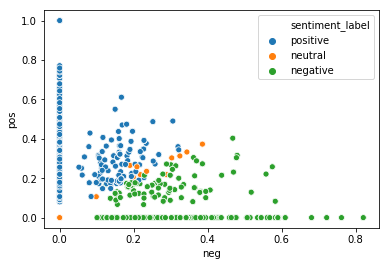

In [52]:
sns.scatterplot(x='neg',y='pos', hue='sentiment_label', data=pol_scores_df);

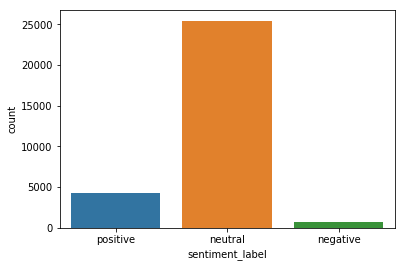

In [55]:
sns.countplot(x='sentiment_label', data=pol_scores_df);

In [108]:
logger.info(f'Negative Count: {len(pol_scores_df[pol_scores_df["sentiment_label"] == "negative"])}')
logger.info(f'Positive Count: {len(pol_scores_df[pol_scores_df["sentiment_label"] == "positive"])}')
logger.info(f'Neutral Count: {len(pol_scores_df[pol_scores_df["sentiment_label"] == "neutral"])}')

neg_count = len(pol_scores_df[pol_scores_df["sentiment_label"] == "negative"])
pos_count = len(pol_scores_df[pol_scores_df["sentiment_label"] == "positive"])

print(neg_count/pos_count)
print(pos_count/neg_count)            

Negative Count: 744
Positive Count: 4299
Neutral Count: 25428


0.17306350314026517
5.778225806451613


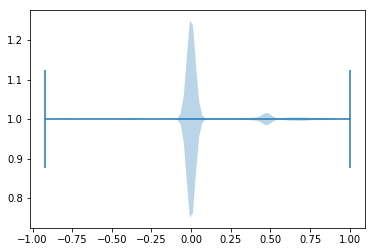

In [56]:
# Initialize Figure and Axes object
fig, ax = plt.subplots()
# Create violinplot
ax.violinplot(pol_scores_df['compound'], vert=False)

# Show the plot
plt.show()

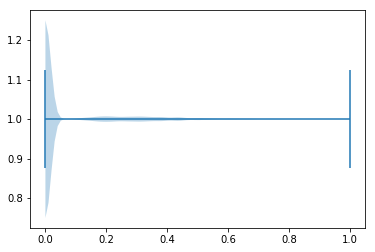

In [167]:
# Initialize Figure and Axes object
fig, ax = plt.subplots()
# Create violinplot
ax.violinplot(pol_scores_df['pos'], vert=False)

# Show the plot
plt.show()

In [169]:
pos_neg = pol_scores_df[['pos', 'neg']]
pos_neg.head()
pos_neg_melt = pd.melt(pos_neg)
pos_neg_melt.head()


,variable,value
0,pos,0.333
1,pos,0.279
2,pos,0.000
3,pos,0.279
4,pos,0.000


In [172]:
# Swarmplot with melted_df
#sns.swarmplot(x='variable', y='value', data=pos_neg_melt)

In [69]:
# pull in SentiStrength classifier results for comparison Vader classification results
senti_strength_analysis = {'tweet':[],'pos_score':[],'neg_score':[]}
with open(f'{dataDir}/ai_tweets_cleaned+results2.txt','r') as f:
    for line in f.readlines():
        temp = line.split('\t')
        senti_strength_analysis['tweet'].append(temp[0])
        senti_strength_analysis['pos_score'].append(temp[1])
        senti_strength_analysis['neg_score'].append(temp[2].replace('\n',''))
        


In [101]:
#
def classify_senti_strength(scores):
    logger.debug(scores)
    pos_sent = 'positive'
    neu_sent = 'neutral'
    neg_sent = 'negative'
    sentiment_class = ''
    
    logger.debug(f'pos_score:{scores[0]} | neg_score: {scores[1]}')
    pos_score = scores[0]
    neg_score = scores[1]
    logger.debug(f'score = {(pos_score+neg_score)}')
    
    if (pos_score+neg_score) >= 1:
        sentiment_class = pos_sent
    elif (pos_score+neg_score)  < 0:
        sentiment_class = neg_sent
    elif (pos_score+neg_score)  == 0:
        sentiment_class = neu_sent
    else:
        logger.warning(f'classify_senti_strength: score not in range: {scores}')

        
    return sentiment_class

In [89]:
senti_df = pd.DataFrame(senti_strength_analysis)
senti_df = senti_df[1:]
senti_df.pos_score =  senti_df.pos_score.astype('int32', copy=False)
senti_df.neg_score =  senti_df.neg_score.astype('int32', copy=False)
senti_df.head()

,tweet,pos_score,neg_score
1,blacklists Chinese artificial intelligence fir...,1,-1
2,Machine Learning Software Development Techniqu...,1,-1
3,EHR Software With Artificial Intelligence The ...,1,-1
4,Rahko raises seed from Balderton for quantum m...,1,-1
5,Artificial intelligence isn threat humanity na...,1,-3


In [103]:
# classify each sentence as 'positive', 'negative' or 'neutral' - see function above
sentiment_classes = []
for (idx,row) in senti_df.iterrows():
    sentiment_classes.append(classify_senti_strength([row['pos_score'],row['neg_score']]))

senti_df['sentiment_label'] = sentiment_classes
senti_df.head()

,tweet,pos_score,neg_score,sentiment_label
1,blacklists Chinese artificial intelligence fir...,1,-1,neutral
2,Machine Learning Software Development Techniqu...,1,-1,neutral
3,EHR Software With Artificial Intelligence The ...,1,-1,neutral
4,Rahko raises seed from Balderton for quantum m...,1,-1,neutral
5,Artificial intelligence isn threat humanity na...,1,-3,negative


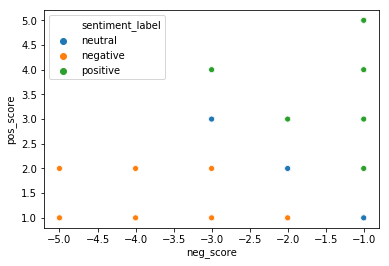

In [109]:
sns.scatterplot(x='neg_score',y='pos_score', hue='sentiment_label', data=senti_df);

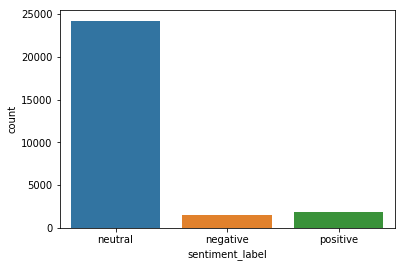

In [105]:
sns.countplot(x='sentiment_label', data=senti_df);

In [106]:
logger.info(f'Negative Count: {len(senti_df[senti_df["sentiment_label"] == "negative"])}')
logger.info(f'Positive Count: {len(senti_df[senti_df["sentiment_label"] == "positive"])}')
logger.info(f'Neutral Count: {len(senti_df[senti_df["sentiment_label"] == "neutral"])}')

            
neg_count = len(senti_df[senti_df["sentiment_label"] == "negative"])
pos_count = len(senti_df[senti_df["sentiment_label"] == "positive"])
neu_count = len(senti_df[senti_df["sentiment_label"] == "neutral"])

print(neg_count/pos_count)
print(pos_count/neg_count)            

Negative Count: 1519
Positive Count: 1907
Neutral Count: 24195


0.7965390665967488
1.2554312047399605
